# Setup

In [1]:
# Uncomment on first run
# %pip install matplotlib yfinance pandas-datareader

In [2]:
import sys
import os
sys.path.append(os.path.abspath("..")) 
import importlib

In [3]:
import numpy as np
import torch
import pandas as pd
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from torch.optim import Adam
import matplotlib.cm as cm

import math
from IPython.display import display
import yfinance as yf

import matplotlib.pyplot as plt
from tqdm import tqdm 
import torch
import torch.nn as nn
import torch.nn.functional as F

In [4]:
## Rerun cell to reload imports

import src
try: 
    for module in [src.models, src.data, src.utils, src.train, src.verification, src.visualisation, src.evaluation]:
        if module:
            importlib.reload(module)
    print("Reloading")
except:
    print("Not reloading")

from src.models import *
from src.data import *
from src.utils import *
from src.train import *
from src.verification import *
from src.visualisation import *
from src.evaluation import *

Not reloading


In [5]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


# Data Load

In [6]:
trainval_start = "2006-04-02"
trainval_end = "2019-12-31"
test_start = "2020-01-01"
test_start = "2020-01-01"
test_end = "2022-12-31"

In [7]:
returns_df, close_df =  get_asset_dataset(trainval_start, test_end)

asset_names = list(returns_df.columns)
n_assets = len(asset_names)

YF.download() has changed argument auto_adjust default to True


[*********************100%***********************]  3 of 3 completed


In [8]:
trainval_mask = (close_df.index >= trainval_start) & (close_df.index <= trainval_end)
trainval_indices = close_df[trainval_mask].index

val_size = int(0.2 * len(trainval_indices))
train_indices = trainval_indices[:-val_size]
val_indices = trainval_indices[-val_size:]

test_mask = (close_df.index >= test_start) & (close_df.index <= test_end)
test_indices = close_df[test_mask].index

/tmp/ipykernel_214950/1227994262.py:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab10')


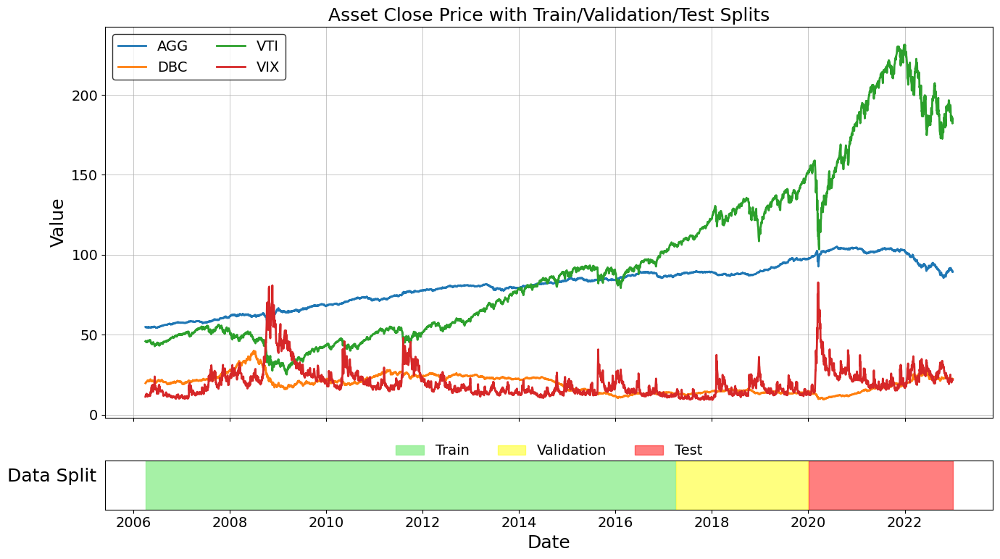

In [9]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np
colors = cm.get_cmap('tab10')

plt.rcParams.update({
    "font.size": 16,            
    "axes.titlesize": 18,       
    "axes.labelsize": 18,       
    "xtick.labelsize": 14,      
    "ytick.labelsize": 14,     
    "legend.fontsize": 14,     
})

train_start = min(train_indices)
train_end = max(train_indices)
val_start = min(val_indices)
val_end = max(val_indices)
test_start = min(test_indices)
test_end = max(test_indices)

fig, (ax_main, ax_timeline) = plt.subplots(
    2, 1, sharex=True,
    gridspec_kw={'height_ratios': [8, 1]},
    figsize=(14, 8)
)

for i, ticker in enumerate(close_df.columns):
    asset_color = colors(i)
    for idx, label in zip([train_indices, val_indices, test_indices], ["Train", "Val", "Test"]):
        plot_label = ticker if label == "Train" else "_nolegend_"
        ax_main.plot(
            close_df.loc[idx, ticker],
            color=asset_color,
            linewidth=2,
            label=plot_label
        )

ax_main.set_title("Asset Close Price with Train/Validation/Test Splits")
ax_main.set_ylabel("Value")
ax_main.grid(True, linewidth=0.5)
ax_main.legend(loc="upper left", fontsize="14", ncol=2, frameon=True, edgecolor="black")

ax_timeline.axvspan(train_start, train_end, color="lightgreen", alpha=0.8, label="Train")
ax_timeline.axvspan(val_start, val_end, color="yellow", alpha=0.5, label="Validation")
ax_timeline.axvspan(test_start, test_end, color="red", alpha=0.5, label="Test")

ax_timeline.set_yticks([])
ax_timeline.set_ylabel("Data Split", rotation=0, labelpad=40)
ax_timeline.yaxis.set_label_coords(-0.06, 0.5)
ax_timeline.grid(False)

ax_timeline.xaxis.set_major_locator(mdates.AutoDateLocator())
ax_timeline.xaxis.set_major_formatter(mdates.ConciseDateFormatter(mdates.AutoDateLocator()))

ax_timeline.legend(loc="center", ncol=3, frameon=False, bbox_to_anchor=(0.5, 1.2))

plt.xlabel("Date")
plt.tight_layout(h_pad=1.0)
plt.show()


In [10]:
lookback = 50   
horizon = 5     
allocation_step = 5

X_train, y_train, train_idx = create_windows(returns_df, train_indices, lookback, horizon)
X_val, y_val, val_idx = create_windows(returns_df, val_indices, lookback, horizon)
X_test, y_test, test_idx = create_windows(returns_df, test_indices, lookback, horizon)

batch_size = 32

X_train_tensor_ = torch.tensor(X_train, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train, dtype=torch.float32)

X_val_tensor_ = torch.tensor(X_val, dtype=torch.float32)
y_val_tensor = torch.tensor(y_val, dtype=torch.float32)

X_test_tensor_ = torch.tensor(X_test, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test, dtype=torch.float32)

num_samples, seq_len, num_assets = X_train_tensor_.shape
flattened = X_train_tensor_.reshape(-1, num_assets)

mean = flattened.mean(dim=0)  
std = flattened.std(dim=0)    

std[std == 0] = 1.0

X_train_tensor = standardize(X_train_tensor_, mean, std)
X_val_tensor = standardize(X_val_tensor_, mean, std)
X_test_tensor = standardize(X_test_tensor_, mean, std)

saved_mean = mean
saved_std = std

In [11]:

val_dataset = TensorDataset(X_val_tensor, y_val_tensor)
test_dataset = TensorDataset(X_test_tensor, y_test_tensor)

val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Experiments

In [12]:
def run_experiment(model, data, experiment={}):
    params = experiment.get("params", {})
    rebalance_freq = params.get("rebalance_freq", 5)
    x, y = data
    model.eval()
    n = y.shape[0]

    x = x.to(device)

    # print(rebalance_freq)

    portfolio_values,weights,holdings = get_portfolio_value(model, (x,y), rebalance_freq)

    weights = torch.tensor(weights).squeeze(1)
    holdings = torch.tensor(holdings).squeeze(1)


    # returns = portfolio_values.
    cum_returns = portfolio_values - 1

    returns = (portfolio_values[1:] - portfolio_values[:-1]) / portfolio_values[:-1]

    # Daily metrics
    mean_return = np.mean(returns)
    std_return = np.std(returns)
    sharpe = sharpe_ratio(returns)

    metrics = {
        "expected_return": cum_returns[-1].item(),
        "sharpe_ratio": sharpe,
        "max_drawdown": max_drawdown(portfolio_values),
        "mean_entropy": mean_entropy(weights),
        "mean_return": mean_return,
        "std_return": std_return,
    }

    raw = {
        "weights": weights,
        "returns": returns,
        "cum_returns": cum_returns,
        "holdings": holdings,
    }

    return {"metrics": metrics, "raw": raw}

In [13]:
def default_linestyle_map(params):
    return "-"

def display_train_results(experiments):
    plt.figure(figsize=(10, 6))
    colors = cm.get_cmap('tab10')

    for idx, (label, experiment) in enumerate(experiments.items()):
        if "train_results" not in experiment:
            continue
        # label = label_from_params(experiment["params"], experiments)
        
        data = experiment["train_results"]
        epochs = list(range(1, len(data["train_losses"]) + 1))
        color = colors(idx % 10) 

        plt.plot(epochs, data["train_losses"], label=f"{label} - Train", linestyle='-', color=color)
        plt.plot(epochs, data["val_losses"], label=f"{label} - Val", linestyle='--', color=color)

    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title("Training and Validation Losses")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

def display_experiment_results(experiments, dataset_key, dataset_idx, linestyle_map=default_linestyle_map, label_from_params=None, additional_detail=False):
    metrics_df  = pd.DataFrame({k: v['results'][dataset_key]["metrics"] for k, v in experiments.items()}).T
    metrics_df = metrics_df.applymap(lambda x: f"{x:.3g}" if isinstance(x, float) else x)
    display(metrics_df)

    plt.figure(figsize=(10, 6))
    for label, params, cr in [(k, v["params"], v['results'][dataset_key]["raw"]["cum_returns"]) for k, v in experiments.items()]:

        print(cr.shape)
        plt.plot(dataset_idx[::5], cr[::5], label=label, linestyle=linestyle_map(params))

    plt.title(f"Cumulative Returns of Different Models ({dataset_key.title()})")
    plt.xlabel("Time Step")
    plt.ylabel("Cumulative Return")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    ncols = 2
    nrows = math.ceil(len(experiments.items()) / ncols)

    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(10 * ncols, 5 * nrows))
    axes = axes.flatten()

    # Loop through and plot
    for i, (label, weights) in enumerate([(k, v['results'][dataset_key]["raw"]["weights"]) for k, v in experiments.items()]):
        ax = axes[i]
        ax.stackplot(dataset_idx, weights.T.detach().numpy(), labels=asset_names)
        ax.set_title(f'Stacked Area Plot of Asset Allocations ({label})')
        ax.set_xlabel('Time Step')
        ax.set_ylabel('Proportion')
        ax.legend(loc='upper left')
        ax.grid(True)

    # Hide any unused axes
    for j in range(i + 1, len(axes)):
        axes[j].set_visible(False)

    plt.tight_layout()
    plt.show()

    if additional_detail:

        fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(10 * ncols, 5 * nrows))
        axes = axes.flatten()

        # Loop through and plot
        for i, (label, holding) in enumerate([(k, v['results'][dataset_key]["raw"]["holdings"]) for k, v in experiments.items()]):
            ax = axes[i]
            ax.plot(dataset_idx, holding.detach().numpy(), label=asset_names)
            ax.set_title(f'Stacked Area Plot of Asset Allocations ({label})')
            ax.set_xlabel('Time Step')
            ax.set_ylabel('Proportion')
            ax.legend(loc='upper left')
            ax.grid(True)

        # Hide any unused axes
        for j in range(i + 1, len(axes)):
            axes[j].set_visible(False)

        plt.tight_layout()
        plt.show()

        plt.figure(figsize=(10, 6))

        for params, weights in [(k, v['results'][dataset_key]["raw"]["weights"]) for k, v in experiments.items()]:
            if "epochs" not in params:
                continue
            plt.plot(dataset_idx, entropy(weights).detach().numpy(), label=label)

        plt.axhline(np.log(n_assets), color='gray', linestyle='--', label='Max Entropy (Uniform)')
        plt.title(f'Allocation Entropy Over Time ({dataset_key.title()})')
        plt.xlabel('Date')
        plt.ylabel('Entropy')
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()

    return metrics_df    

<!-- # Standard Training -->

In [14]:
def loss_fn_fn(params):
    lambda_entropy = params["lambda_entropy"]
    def loss_fn(x, y, model, _):
        weights = model(x)

        asset_returns = ((1 + y).prod(1)-1)
        portfolio_returns = (asset_returns*weights).sum(1)
        natural_loss = -portfolio_returns.mean() 
        clamped_weights = weights.clamp(min=1e-8)
        entropy_loss = lambda_entropy * (-(clamped_weights * clamped_weights.log()).sum(dim=1).mean())
        return natural_loss -  entropy_loss
    return loss_fn 
    
def standard_model_fn(params):
    if params["model"] == "CNN":
        return FinalCNN().to(device)
    if params["model"] == "CNN_Causal":
        return CNNAllocatorCausal(4, lookback).to(device)
    elif params["model"] == "MLP":
        return SimpleAssetAllocationModel(4*lookback).to(device)
    elif params["model"] == "LSTM":
        hidden_size = params["lstm_hidden_size"]
        num_layers = params["lstm_hidden_layers"]
        return LSTM(n_assets, hidden_size, num_layers, n_assets).to(device)
    elif params["model"] == "LSTM_Unrolled":
        hidden_size = params["lstm_hidden_size"]
        num_layers = params["lstm_hidden_layers"]
        return LSTM_Unrolled(n_assets, hidden_size, num_layers, n_assets).to(device)
    elif params["model"] == "Transformer":
        return Transformer(input_size=50,  output_size=4, d_model=2, nhead=2, num_layers=2, dim_head=4).to(device)

    raise Exception("Model not found")

In [15]:
def get_experiment_model(model_fn, experiment_path, params_grid, loss_fn_fn, dataset_fn, device="cuda", train_robust=True):
    experiments = {}

    train_result_path = os.path.join(experiment_path, "train_results.csv")
    os.makedirs(os.path.dirname(train_result_path), exist_ok=True)
    if os.path.exists(train_result_path):
        with open(train_result_path, 'r') as file:
            train_results = json.load(file)
    else:
        train_results = {}

    param_sets = grid_to_sets(params_grid)

    for params in param_sets:
        # name = f"{}"
        epochs = params.get("epochs", 10)
        checkpoint_freq = params.get("checkpoint_freq", epochs)
        
        paths = {}
        for epoch in range(1, epochs + 1):
            if epoch % checkpoint_freq == 0 or epochs==epoch: 
                name = model_file_name(params | {"checkpoint": epoch})
                model_path = os.path.join(experiment_path, name)
                paths[epoch] = model_path


        print("HERE")
        print(paths)

        load_checkpoint = params.get("checkpoint", None)
        print(load_checkpoint)
        if load_checkpoint is not None:
            paths = {load_checkpoint: paths[load_checkpoint]}
            del params["checkpoint"]
            print(paths)
        print([os.path.exists(p) for p in paths.values()])
        print([p for p in paths.values()])
            
      
       
        if all([os.path.exists(p) for p in paths.values()]):
            for checkpoint, path in paths.items():
                print("Loading", path)
                checkpoint_params = params | {"checkpoint": checkpoint}
                name = model_file_name(checkpoint_params)
                model_path = os.path.join(experiment_path, name)
                model = model_fn(params)
                model.load_state_dict(torch.load(model_path, map_location=device))
                experiments[name] = {"model": model, "params": checkpoint_params, "results": {}, "train_results": train_results[model_path]}
        else:
            print("Training", model_file_name(params))
            if "seed" in params:
                set_seed(params["seed"])
            model = model_fn(params)
            if train_robust:
                bounded_model = get_bounded_model2(model)
            else:
                bounded_model = model

            # model = unbounded_model
            loss_fn = loss_fn_fn(params)
            train_losses = []
            val_losses = []
            lr = params.get("learning_rate", 0.001)
            weight_decay = params.get("weight_decay", 1e-5)
            
            optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)
            train_time = 0
            pbar = tqdm(range(1, epochs + 1), desc="Epochs", unit="ep")

            train_loader, val_loader = dataset_fn(params)

            best_val_loss = np.inf
            patience_count = 0

            for epoch in pbar:

                start_time = time.time()
                train_loss  = train_step(model, device, train_loader, optimizer, loss_fn, epoch, params,"train", bounded_model=bounded_model)
                train_time += time.time() - start_time

                val_loss = train_step(model, device, val_loader, optimizer, loss_fn, epoch, params, "eval", bounded_model=bounded_model)
                train_losses.append(train_loss)
                val_losses.append(val_loss)

                pbar.set_postfix(train_loss=f"{train_loss:.5f}",val_loss=f"{val_loss:.10f}")

                if epoch % checkpoint_freq == 0 or epoch == epochs:
                    checkpoint_params = params | {"checkpoint": epoch} #{"checkpoint": epoch}
                    name = model_file_name(checkpoint_params)
                   
                    model_path = os.path.join(experiment_path, name)
                    print("Saving", name)
                    train_results[model_path] = {"train_time": train_time, "train_losses": train_losses.copy(), "val_losses": val_losses.copy()}
                    torch.save(model.state_dict(), model_path)

                    checkpoint_model = model_fn(params)
                    checkpoint_model.load_state_dict(torch.load(model_path, map_location=device))
                    experiments[name] = {"model": checkpoint_model, "params": checkpoint_params, "results": {}, "train_results": train_results[model_path]}
                    with open(train_result_path, 'w') as file: 
                        json.dump(train_results, file, indent=4)

                if epoch == epochs:
                    break
    experiments = name_experiments(experiments)
    return experiments

In [16]:
def loss_fn(x, y, model, _):
    eps = 1e-8

    # get weights and expand over time
    w0 = model(x)                                   # [28, A]
    w  = w0.unsqueeze(1).repeat(1, horizon, 1)      # [28, T, A]

    # per-period returns
    r  = (w * y).sum(dim=2)                         # [28, T]

    # flatten across batch and time
    flat_r = r.reshape(-1)                          # [28*T]

    # global Sharpe
    μ      = flat_r.mean()                          # scalar
    σ      = flat_r.std(unbiased=False)             # scalar
    sharpe = μ / (σ + eps)

    # we want to maximize Sharpe → minimize −Sharpe
    return -sharpe


In [17]:


def dataset_fn(params):
    jitter = Jitter(sigma=params.get("jitter", 0.025))
    train_dataset = AugmentedTimeSeriesDataset(X_train_tensor, y_train_tensor, transform=jitter)
    val_dataset = TensorDataset(X_val_tensor, y_val_tensor)

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
    return train_loader, val_loader


In [18]:
def hyperparam_search(experiments, metric="val_expected_return"):
    params_df = pd.DataFrame({k: v['params'] for k, v in experiments.items()}).T
    results_df = params_df
    for df_name in ["val", "test"]:
        df  = pd.DataFrame({k: v['results'][df_name]["metrics"] for k, v in experiments.items()}).T
        df = df.add_prefix(f'{df_name}_')
        results_df = pd.concat([results_df, df], axis=1)

    metric = "val_expected_return"
    params = params_df.columns 
    group_by_params = [p for p in params if p!= "seed"]
    agg_results_df = results_df.groupby(group_by_params)[metric].mean().reset_index().sort_values(metric, ascending=False).dropna().rename(columns={metric: f"mean_{metric}"})
    print("Hyperparam Search over seeds")
    display(agg_results_df)
    best_params = agg_results_df[group_by_params].iloc[0].to_dict()

    for col, val in best_params.items():
        results_df = results_df[results_df[col] == val]

    results_df = results_df.sort_values(metric, ascending=False)[params].iloc[0]
    return results_df.to_dict()


In [19]:
import pickle
from IPython import get_ipython


def run_abcrown_from_dict_ipython(args_dict, debug_file):
    cmd = "python alpha-beta-CROWN/complete_verifier/abcrown.py"

    output_path = args_dict["output_file"]
    results_path = args_dict["results_file"]
    cex_path = args_dict["cex_path"]

    

    if os.path.isfile(output_path):
        os.remove(output_path)
    if os.path.isfile(results_path):
        os.remove(results_path)

    with open(cex_path, "w") as f:
        json.dump( {"x": [], "adv_output": []}, f, indent=2)

    # data =

    
    # Append each argument with "--" prefix
    for key, value in args_dict.items():
        cmd += f" --{key} {value}"

    print(cmd)

    cmd = f"{cmd} > {debug_file}"



    get_ipython().system(cmd)



In [20]:
def robust_loss_fn_fn(params):
    if params["loss"] == "Standard":

        # lambda_entropy = params["lambda_entropy"]
        # true_alpha = params["alpha"]
        # robust_eps = params["robust_eps"]
        # warmup = params["warmup"]
        # eps_vector = torch.tensor(robust_eps, dtype=torch.float32, device=device)

        def loss_fn(x, y, model, epoch, _):

            # alpha = true_alpha * (min(epoch, warmup)/ warmup)
            β   = 0.1#risk_penalty  # e.g. 0.5 or tune via validation

            w0 = model(x)                                  # [B, A]
            w  = w0.unsqueeze(1).repeat(1, horizon, 1)     # [B, T, A]
            r  = (w * y).sum(dim=2)                        # [B, T]


                # wr = torch.zeros_like(r)

            μ  = r.mean(dim=1) 
            # wr = wr.mean(dim=1)                             # [B]
            σ  = r.std(dim=1, unbiased=False)              # [B]



            mv = μ - β * σ
            return -mv.mean(), {"standard": μ.mean().item()}


        return loss_fn

    elif params["loss"] == "CROWN-IBP" or params["loss"] == "IBP":
        lambda_entropy = params["lambda_entropy"]
        true_alpha = params["alpha"]
        robust_eps = params["robust_eps"]
        warmup = params["warmup"]
        # eps_vector = torch.tensor(robust_eps, dtype=torch.float32, device=device)

        def loss_fn(x, y, model, epoch, bounded_model):

            alpha = true_alpha * (min(epoch, warmup)/ warmup)
            β   = 0.1#risk_penalty  # e.g. 0.5 or tune via validation

            w0 = model(x)                                  # [B, A]
            w  = w0.unsqueeze(1).repeat(1, horizon, 1)     # [B, T, A]
            r  = (w * y).sum(dim=2)                        # [B, T]

            width = 0

            if true_alpha > 0:
                perturbation = PerturbationLpNorm(norm=np.inf, eps=robust_eps)
                x_perturbed = BoundedTensor(x, perturbation)
                ub, lb = bounded_model.compute_bounds(x=(x_perturbed,), method=params["loss"])
                ub = ub.unsqueeze(1).repeat(1, horizon, 1)
                lb = lb.unsqueeze(1).repeat(1, horizon, 1)

                width = (ub - lb).mean().item()

                wr = torch.min(y * ub, y * lb).sum(dim=2)  
            else:
                wr = torch.zeros_like(r)

            μ  = r.mean(dim=1) 
            wr = wr.mean(dim=1)                             
            σ  = r.std(dim=1, unbiased=False)              


            mv = μ * (1-alpha) + alpha * wr - β * σ
            return -mv.mean(), {"standard": μ.mean().item(), "robust": wr.mean().item(), "width": width}

        return loss_fn

    elif params["loss"] == "PGD":
        true_alpha = params["alpha"]
        robust_eps = params["robust_eps"]
        warmup = params["warmup"]

        def pgd_attack_loss(x, y):
                x = x.unsqueeze(1).repeat(1, horizon, 1)   
                loss = (x * y).sum(dim=2).mean(1)
                return loss

        def loss_fn(x, y, model, epoch, bounded_model):
            alpha = true_alpha * (min(epoch, warmup)/ warmup)
           
        
            # robust_eps = params["robust_eps"]
            # eps_vector = torch.tensor([0.1,0.1,0.1,0.1], device=device)

          

            
            if True:
                model.eval()
                aw = model(pgd_attack(model, x, y, robust_eps, pgd_attack_loss, n_steps=10))
                aw = aw.unsqueeze(1).repeat(1, horizon, 1)    
                ar = (aw * y).sum(dim=2)
                model.train()
                # print("attacked",  ar)
                # ar = torch.zeros_like(r)
            else:
                pass
                # ar = torch.zeros_like(r)

            β   = 0.1


            w0 = model(x)       

            # print(w0.shape, aw.shape)                           
            w  = w0.unsqueeze(1).repeat(1, horizon, 1)     
            r  = (w * y).sum(dim=2) 
            
                       
            
            ar = torch.zeros_like(r)
            μ  = r.mean(dim=1) 
            μa  = ar.mean(dim=1)
            σ  = r.std(dim=1, unbiased=False)
            
            # mv = μ - β * σ
            mv = μ * (1-alpha) + alpha * μa - β * σ
            return -mv.mean(), {"standard": μ.mean().item(), "robust": μa.mean().item()}
        
        return loss_fn



    
    elif params["loss"] in ["MTL-IBP", "Exp-IBP", "CC-IBP"]:
        lambda_entropy = params["lambda_entropy"]
        alpha = params["alpha"]
        robust_eps = params["robust_eps"]
        eps = robust_eps
        eps_vector = torch.tensor(eps, dtype=torch.float32, device=device)
        def pgd_attack_loss(x, y):
            loss = ((1 + y).prod(1) * x).sum(1)
            return loss
        def loss_fn(x, y, model):
            model.eval()
            output_adv = model(pgd_attack(model, x, y, eps_vector, pgd_attack_loss, n_steps=10))
            model.train()
            
            eps_tensor =eps_vector.repeat(x.shape[0], 50, 1)
            perturbation = PerturbationLpNorm(norm=np.inf, eps=eps_tensor)
            x_perturbed = BoundedTensor(x, perturbation)
            ub, lb = model.compute_bounds(x=(x_perturbed,), method="IBP")
            asset_returns = ((1 + y).prod(1)-1)

            weights = model(x)
            clamped_weights = weights.clamp(min=1e-8)
            entropy_loss = -lambda_entropy * (-(clamped_weights * clamped_weights.log()).sum(dim=1).mean())

            if params["loss"] == "CC-IBP":
                returns = torch.min(asset_returns * (output_adv * alpha + ub * (1-alpha)), asset_returns * (output_adv * alpha + lb * (1-alpha))).sum(1)
                loss = returns.mean()

                return loss + entropy_loss

            else:
                worst_returns = torch.min(asset_returns * ub, asset_returns * lb).sum(1)
                robust_loss = -worst_returns.mean() 
                adv_returns = (output_adv * asset_returns).sum(1)
                adv_loss = -adv_returns.mean() 

                if params["loss"] == "MTL-IBP":
                    loss = (adv_loss *(1 - alpha)) + (robust_loss * alpha) + entropy_loss
                elif params["loss"] == "Exp-IBP":
                    loss = (adv_loss **(1 - alpha)) + (robust_loss ** alpha) + entropy_loss

                return loss
        return loss_fn
    
    raise Exception("not foiund")

In [21]:
def get_bounded_model2(model):

    model = model.to(device)

    beta_crown_args = {
                "enable_alpha_crown": True,   # α-CROWN
                "enable_beta_crown": True,    # β-CROWN (branch-and-bound)
                "optimizer": "adam",          
                "iteration": 5,              # α/β optimization steps
                "lr_alpha": 0.5,
                "lr_beta": 0.05,
                "pruning_in_iteration": True
            }

    bound_opts = {
            "optimize_bound_args": beta_crown_args,
            "conv_mode": "matrix"
        }
    return BoundedModule(model, X_train_tensor, bound_opts=bound_opts)

In [22]:

def loss_fn(x, y, model, _):
    weights_ = model(x)  
    weights = weights_.unsqueeze(1).repeat(1, horizon, 1)

    portfolio_returns = (weights * y).sum(1).sum(1)

    natural_loss = -portfolio_returns.mean() 

    clamped_weights = weights.clamp(min=1e-8)
    entropy_loss = 0 * (-(clamped_weights * clamped_weights.log()).sum(dim=1).mean())

    return natural_loss -  entropy_loss
        
        # return loss_fn

# Standard Performance

In [23]:
import torch
import torch.nn as nn
import numpy as np

# def erc_weights_nonneg(window: np.ndarray,
#                        tol: float = 1e-8,
#                        max_iter: int = 1000,
#                        eps: float = 1e-6) -> np.ndarray:
#     """
#     window: (T, N) numpy array of raw returns
#     returns: (N,) non-negative ERC weights summing to 1
#     Uses multiplicative updates with clipping to enforce non-negativity.
#     """
#     Sigma = np.cov(window, rowvar=False)
#     n = Sigma.shape[0]
#     w = np.ones(n) / n

#     for _ in range(max_iter):
#         m = Sigma.dot(w)
#         rc = w * m
#         total = rc.sum()
#         target = total / n

#         w_new = w * (target / rc)
#         w_new = np.maximum(w_new, eps)
#         w_new /= w_new.sum()

#         if np.max(np.abs(w_new - w)) < tol:
#             w = w_new
#             break
#         w = w_new

#     return w

class UniformModel(nn.Module):
    def __init__(self, n_assets: int = 4):
        super(UniformModel, self).__init__()
        self.n_assets = n_assets

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        b = x.shape[0]
        return torch.full((b, self.n_assets), 1/self.n_assets,
                          device=x.device, dtype=x.dtype)

class InverseVolModel(nn.Module):
    def __init__(self):
        super(InverseVolModel, self).__init__()

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        """
        x: (batch, window, n_assets) standardized returns
        """
        # unstandardize returns
        # saved_mean, saved_std assumed in global scope
        m = saved_mean.view(1, 1, -1).to(x.device)
        s = saved_std.view(1, 1, -1).to(x.device)
        x_raw = x * s + m

        # compute sample vol per asset
        vol = x_raw.std(dim=1, unbiased=True)         # (batch, n_assets)
        inv_vol = 1.0 / vol
        weights = inv_vol / inv_vol.sum(dim=1, keepdim=True)
        return weights

# class ERCModel(nn.Module):
#     def __init__(self, tol: float = 1e-8, max_iter: int = 1000, eps: float = 1e-6):
#         super(ERCModel, self).__init__()
#         self.tol = tol
#         self.max_iter = max_iter
#         self.eps = eps

#     def forward(self, x: torch.Tensor) -> torch.Tensor:
#         """
#         x: (batch, window, n_assets) standardized returns
#         """
#         # unstandardize returns
#         m = saved_mean.view(1, 1, -1).to(x.device)
#         s = saved_std.view(1, 1, -1).to(x.device)
#         x_raw = x * s + m

#         # move to CPU-numpy
#         windows = x_raw.detach().cpu().numpy()
#         batch, _, n_assets = windows.shape

#         erc_list = []
#         for i in range(batch):
#             w_np = erc_weights_nonneg(
#                 windows[i],
#                 tol=self.tol,
#                 max_iter=self.max_iter,
#                 eps=self.eps
#             )                                              # (n_assets,)
#             erc_list.append(w_np)

#         erc_arr = np.stack(erc_list, axis=0)               # (batch, n_assets)
#         return torch.tensor(erc_arr, device=x.device, dtype=x.dtype)



In [24]:
import torch
import torch.nn as nn
import numpy as np
from sklearn.covariance import LedoitWolf


# def erc_weights_nonneg(window: np.ndarray,
#                        tol: float = 1e-8,
#                        max_iter: int = 1000,
#                        eps: float = 1e-6) -> np.ndarray:
#     Sigma = np.cov(window, rowvar=False)
#     n = Sigma.shape[0]
#     w = np.ones(n) / n
#     for _ in range(max_iter):
#         m = Sigma.dot(w)
#         rc = w * m
#         total = rc.sum()
#         target = total / n
#         w_new = w * (target / rc)
#         w_new = np.maximum(w_new, eps)
#         w_new /= w_new.sum()
#         if np.max(np.abs(w_new - w)) < tol:
#             w = w_new
#             break
#         w = w_new
#     return w

class MinVarianceModel(nn.Module):
    def __init__(self):
        super(MinVarianceModel, self).__init__()
        self.shrink = LedoitWolf()
        self.eps = 1e-6
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # x: (batch, window, n_assets) standardized returns
        m = saved_mean.view(1, 1, -1).to(device)
        s = saved_std.view(1, 1, -1).to(device)
        x_raw = x * s + m
        windows = x_raw.detach().cpu().numpy()
        batch, _, n_assets = windows.shape
        mv_list = []
        for i in range(batch):
            data = windows[i]
            Sigma_shrunk = self.shrink.fit(data).covariance_
            inv_S = np.linalg.pinv(Sigma_shrunk)
            ones = np.ones(n_assets)
            w_raw = inv_S.dot(ones)
            w_clipped = np.maximum(w_raw, self.eps)
            w = w_clipped / w_clipped.sum()
            mv_list.append(w)
        mv_arr = np.stack(mv_list, axis=0)
        return torch.tensor(mv_arr, device=x.device, dtype=x.dtype)
# class MomentumModel(nn.Module):
#     def __init__(self):
#         super(MomentumModel, self).__init__()

#     def forward(self, x: torch.Tensor) -> torch.Tensor:
#         # x: (batch, window, n_assets) standardized returns
#         device = x.device
#         m = saved_mean.to(device).view(1, 1, -1)
#         s = saved_std.to(device).view(1, 1, -1)
#         x_raw = x * s + m
#         # cumulative return per asset over window
#         ret_sum = x_raw.sum(dim=1)              # (batch, n_assets)
#         # only positive returns contribute
#         pos = torch.clamp(ret_sum, min=0.0)
#         sums = pos.sum(dim=1, keepdim=True)     # (batch,1)
#         # allocate proportionally where sums>0, else uniform
#         n_assets = x.shape[2]
#         # compute ratio, avoid division by zero
#         weights = torch.where(
#             sums > 0,
#             pos / sums,
#             torch.full_like(pos, 1.0 / n_assets)
#         )                                       # (batch,n_assets)
#         return weights

In [25]:
saved_mean.shape

torch.Size([4])

--------------------
Test RESULTS
--------------------


/tmp/ipykernel_214950/3805463404.py:30: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  metrics_df = metrics_df.applymap(lambda x: f"{x:.3g}" if isinstance(x, float) else x)


,expected_return,sharpe_ratio,max_drawdown,mean_entropy,mean_return,std_return
Fixed,0.326,0.0629,0.0861,1.19,0.000429,0.00681
Fixed (Annual),0.211,0.0497,0.14,1.16,0.000294,0.00593
1/N,0.443,0.0325,0.186,1.38,0.000591,0.0182
1/N (Annual),0.205,0.0194,0.195,1.36,0.000265,0.0136
Inv Baseline,0.103,0.0383,0.111,0.941,0.000163,0.00425
Min Variance,0.295,0.0751,0.0977,1.24,0.000395,0.00526


(701,)
(701,)
(701,)
(701,)
(701,)
(701,)


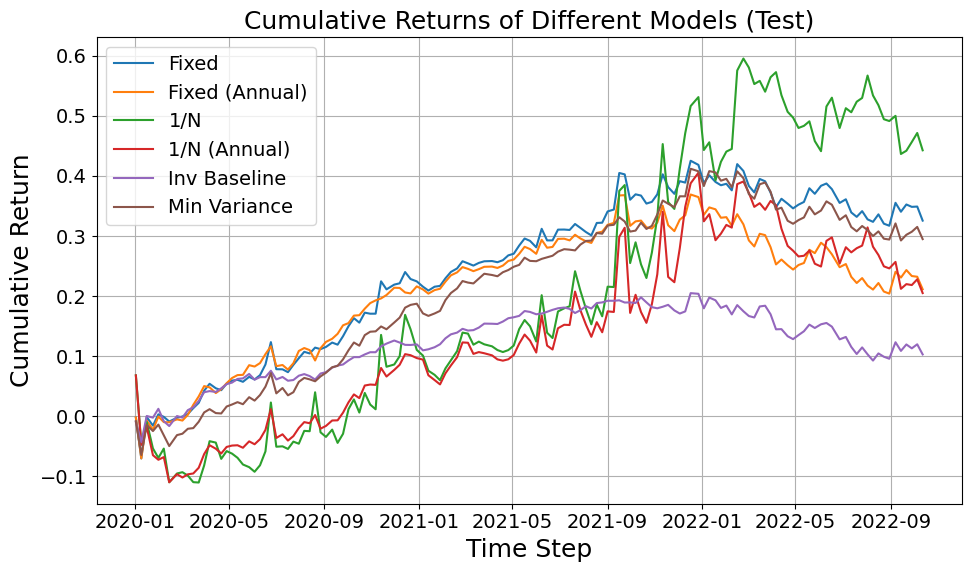

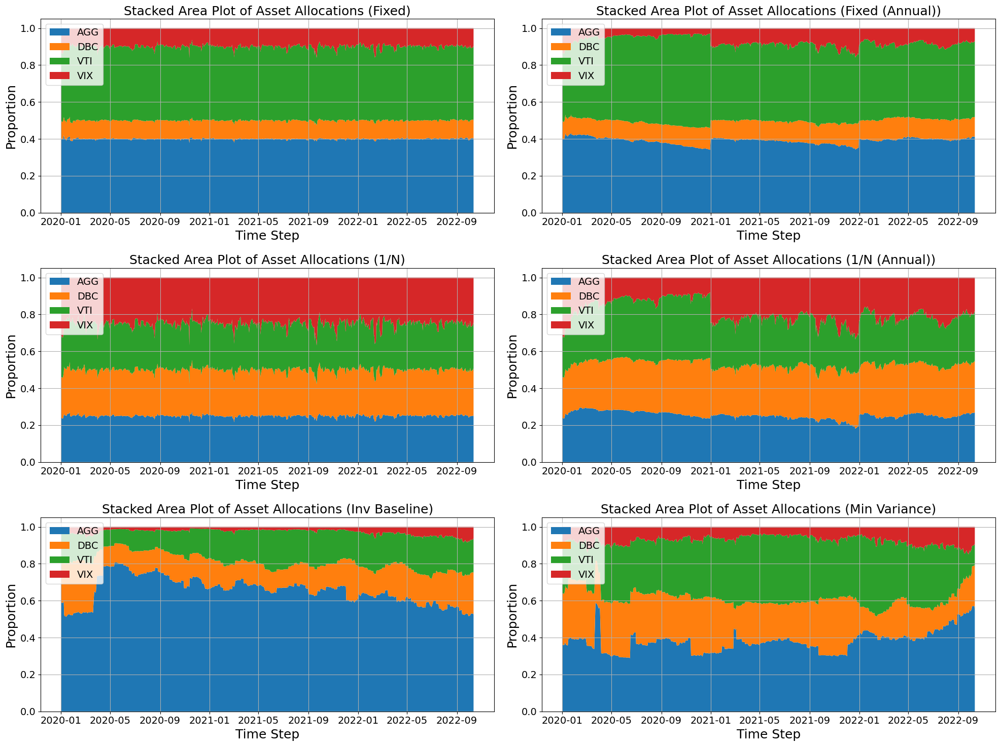

--------------------
Val RESULTS
--------------------


/tmp/ipykernel_214950/3805463404.py:30: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  metrics_df = metrics_df.applymap(lambda x: f"{x:.3g}" if isinstance(x, float) else x)


,expected_return,sharpe_ratio,max_drawdown,mean_entropy,mean_return,std_return
Fixed,0.464,0.0755,0.0966,1.19,0.000632,0.00837
Fixed (Annual),0.229,0.0366,0.165,1.2,0.000373,0.0102
1/N,0.735,0.0474,0.24,1.38,0.00113,0.0238
1/N (Annual),0.222,0.0243,0.351,1.38,0.000665,0.0274
Inv Baseline,0.196,0.147,0.0245,0.885,0.000284,0.00193
Min Variance,0.235,0.083,0.0779,1.23,0.000347,0.00418


(637,)
(637,)
(637,)
(637,)
(637,)
(637,)


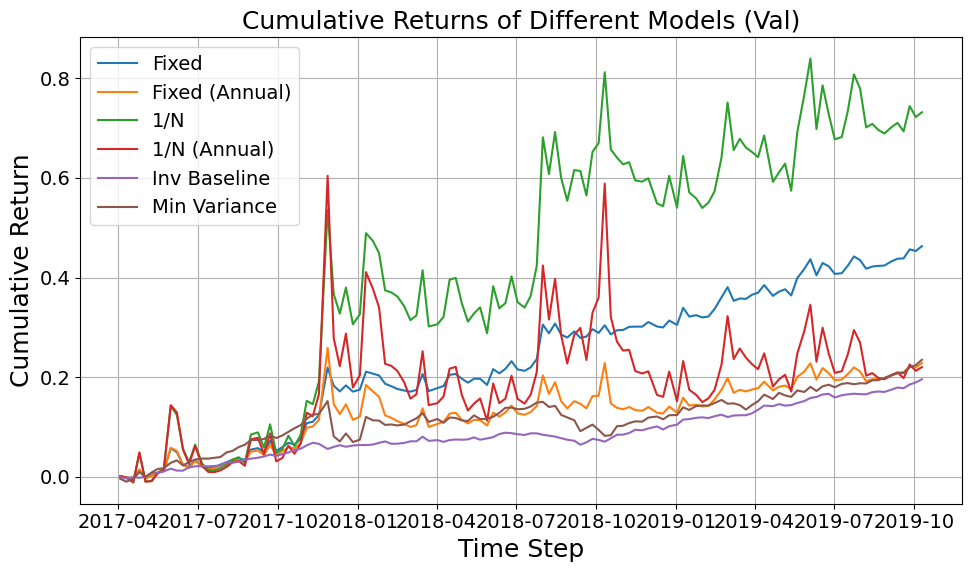

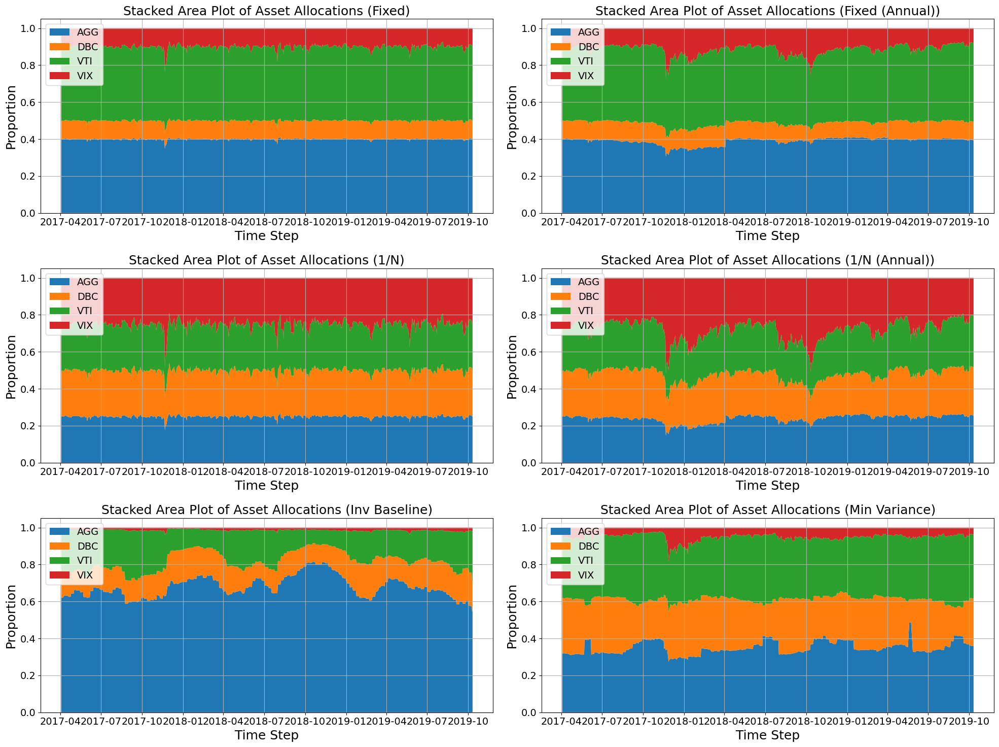

In [26]:
experiments = {}

experiments["Fixed"] = {"model": FixedWeightModel(torch.tensor([0.4, 0.1, 0.4, 0.1])), "params": { "rebalance_freq": 5}, "results": {}}
experiments["Fixed (Annual)"] = {"model": FixedWeightModel(torch.tensor([0.4, 0.1, 0.4, 0.1])), "params": { "rebalance_freq": 252}, "results": {}}
experiments["1/N"] = {"model": UniformModel(), "params": { "rebalance_freq": 5}, "results": {}}
experiments["1/N (Annual)"] = {"model": UniformModel(), "params": { "rebalance_freq": 252}, "results": {}}
experiments["1/N"] = {"model": UniformModel(), "params": { "rebalance_freq": 5}, "results": {}}
experiments["1/N (Annual)"] = {"model": UniformModel(), "params": { "rebalance_freq": 252}, "results": {}}
experiments["Inv Baseline"] = {"model": InverseVolModel(), "params": {"rebalance_freq": 5}, "results": {}}
experiments["Min Variance"] = {"model": MinVarianceModel(), "params": {"label": "Uniform Baseline", "rebalance_freq": 5}, "results": {}}


for model_name, experiment in experiments.items():
    model = experiment["model"]
    # experiment["results"]["train"] = run_experiment(model, (X_train_tensor, y_train_tensor[:, 0:1, :].squeeze(1)), experiment)
    experiment["results"]["val"] = run_experiment(model, (X_val_tensor, y_val_tensor[:, 0:1, :].squeeze(1)), experiment)
    experiment["results"]["test"] = run_experiment(model, (X_test_tensor[:], y_test_tensor[:][:, 0:1, :].squeeze(1)), experiment)

# display_train_results(experiments)
for dataset_key, dataset_idx in zip(["test", "val"], [test_idx[:], val_idx]):
    print("-"*20)
    print(dataset_key.capitalize() + " RESULTS")
    print("-"*20)
    display_experiment_results(experiments, dataset_key, dataset_idx )

baselines = experiments.copy()

In [27]:


seeds = [10, 5, 6]

alphas = [0.0625, 0.1250, 0.25, 0.3750, 0.5, 0.75, 1]

params_grids = [
    {
    "seed": seeds,
    "epochs": [60],
    "lambda_entropy": [0.000],
    "model": ["CNN"],
    "learning_rate": [0.001],
    "loss": ["Standard"],
    "jitter" : [1.5],
    "weight_decay": [1e-5],

},
{
    "seed": seeds,
    "epochs": [100],
    "lambda_entropy": [0.025],
    "model": ["LSTM_Unrolled"],
    "lstm_hidden_layers" : [1],
    "lstm_hidden_size": [8],
    "learning_rate": [1e-3],
    "rebalance_freq": [5],
    "loss": ["Standard"],
    "jitter": [1.5],
}
]


def dataset_fn(params):
    jitter = Jitter(sigma=params.get("jitter", 0.025))
    train_dataset = AugmentedTimeSeriesDataset(X_train_tensor, y_train_tensor, transform=jitter)
    val_dataset = TensorDataset(X_val_tensor, y_val_tensor)

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
    return train_loader, val_loader


experiment_path = "alpha-beta-CROWN/complete_verifier/trained_models"
experiments = get_experiment_model(standard_model_fn, experiment_path, params_grids, robust_loss_fn_fn, dataset_fn, device=device)

experiments = {k: v for k,v in experiments.items() if v["params"]["checkpoint"] == v["params"]["epochs"] }

for model_name, experiment in experiments.items():
    model = experiment["model"]
   
    experiment["results"]["val"] = run_experiment(model, (X_val_tensor, y_val_tensor[:, 0:1, :].squeeze(1)), experiment)
    experiment["results"]["test"] = run_experiment(model, (X_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1)), experiment)


HERE
{60: 'alpha-beta-CROWN/complete_verifier/trained_models/seed=10,epochs=60,lambda_entropy=0.0,model=CNN,learning_rate=0.001,loss=Standard,jitter=1.5,weight_decay=1e-05,checkpoint=60.pth'}
None
[True]
['alpha-beta-CROWN/complete_verifier/trained_models/seed=10,epochs=60,lambda_entropy=0.0,model=CNN,learning_rate=0.001,loss=Standard,jitter=1.5,weight_decay=1e-05,checkpoint=60.pth']
Loading alpha-beta-CROWN/complete_verifier/trained_models/seed=10,epochs=60,lambda_entropy=0.0,model=CNN,learning_rate=0.001,loss=Standard,jitter=1.5,weight_decay=1e-05,checkpoint=60.pth
HERE
{60: 'alpha-beta-CROWN/complete_verifier/trained_models/seed=5,epochs=60,lambda_entropy=0.0,model=CNN,learning_rate=0.001,loss=Standard,jitter=1.5,weight_decay=1e-05,checkpoint=60.pth'}
None
[True]
['alpha-beta-CROWN/complete_verifier/trained_models/seed=5,epochs=60,lambda_entropy=0.0,model=CNN,learning_rate=0.001,loss=Standard,jitter=1.5,weight_decay=1e-05,checkpoint=60.pth']
Loading alpha-beta-CROWN/complete_verifie

In [28]:
import matplotlib.pyplot as plt
import numpy as np


to_plot = {
    "LSTM": experiments["seed=10 epochs=100 lambda_entropy=0.025 model=LSTM_Unrolled checkpoint=100"],
    "LSTM2": experiments["seed=5 epochs=100 lambda_entropy=0.025 model=LSTM_Unrolled checkpoint=100"],
    "LSTM3": experiments["seed=6 epochs=100 lambda_entropy=0.025 model=LSTM_Unrolled checkpoint=100"],
    "CNN": experiments["seed=10 epochs=60 lambda_entropy=0.0 model=CNN checkpoint=60"],
    "CNN2": experiments["seed=5 epochs=60 lambda_entropy=0.0 model=CNN checkpoint=60"],
    "CNN3": experiments["seed=6 epochs=60 lambda_entropy=0.0 model=CNN checkpoint=60"],
    "1/N": baselines["1/N"],
    "Fixed": baselines["Fixed"],
    "Inverse Volatility": baselines["Inv Baseline"],
    "Min Variance": baselines["Min Variance"],
}

# to_plot = experiments | baselines
crs = { ek: e["results"]["test"]["raw"]["cum_returns"][::5] for ek, e in to_plot.items() }

cumulative_returns_dict = crs

time_points = test_indices[:-55][::5]#range(1, len(next(iter(cumulative_returns_dict.values()))) + 1)

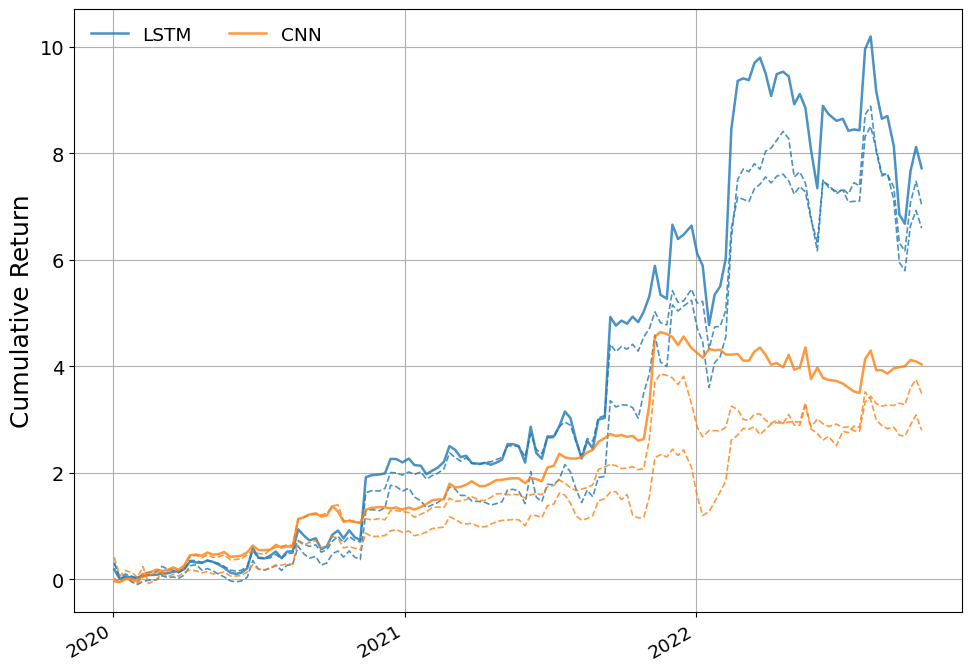

In [29]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

cr = cumulative_returns_dict
tp = time_points

lstm_keys = [k for k in cr if k.startswith("LSTM")]
cnn_keys  = [k for k in cr if k.startswith("CNN")]
baseline_keys = [k for k in cr if k not in (*lstm_keys, *cnn_keys)]

best_lstm = max(lstm_keys, key=lambda k: cr[k][-1])
best_cnn  = max(cnn_keys,  key=lambda k: cr[k][-1])

plt.figure(figsize=(10, 7))

for k in lstm_keys:
    ls = "-" if k == best_lstm else "--"
    lbl = "LSTM" if k == best_lstm else None
    plt.plot(tp, cr[k],
             color="C0", linestyle=ls,
             linewidth=1.8 if ls=="-" else 1.2,
             alpha=0.8,
             label=lbl)


for k in cnn_keys:
    ls = "-" if k == best_cnn else "--"
    lbl = "CNN" if k == best_cnn else None
    plt.plot(tp, cr[k],
             color="C1", linestyle=ls,
             linewidth=1.8 if ls=="-" else 1.2,
             alpha=0.8,
             label=lbl)



ax = plt.gca()
ax.xaxis.set_major_locator(mdates.YearLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y"))
plt.setp(ax.get_xticklabels(), rotation=30, ha="right", fontsize="small")

plt.ylabel("Cumulative Return")
plt.grid(True)
plt.legend(fontsize="small", frameon=False, ncol=2)
plt.tight_layout()
plt.show()


# Impact of Robustness on return variablity

### Standard Performance Of Robust + Standard Models 

In [30]:
seeds = [10, 5, 6]

alphas = [0.0625, 0.1250, 0.25, 0.3750, 0.5, 0.75, 1]

params_grids = [
    # Standard Models
    {
    "seed": [10],
    "epochs": [60],
    "lambda_entropy": [0.000], # Removed from loss function
    "model": ["CNN"],
    "learning_rate": [0.001],
    "loss": ["Standard"],
    "jitter" : [1.5],
    "weight_decay": [1e-5],

},
# Robust Models
    {
    "seed": seeds,
    "epochs": [60],
    "lambda_entropy": [0.000],
    "model": ["CNN"],
    "learning_rate": [0.001],
    "loss": ["CROWN-IBP"],
    "jitter" : [1.5],
    "weight_decay": [1e-5],
    "robust_eps": [0.01],
    "alpha": alphas,
    "warmup": [20]
},
]


def dataset_fn(params):
    jitter = Jitter(sigma=params.get("jitter", 0.025))
    train_dataset = AugmentedTimeSeriesDataset(X_train_tensor, y_train_tensor, transform=jitter)
    val_dataset = TensorDataset(X_val_tensor, y_val_tensor)
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
    return train_loader, val_loader


experiment_path = "alpha-beta-CROWN/complete_verifier/trained_models"
experiments = get_experiment_model(standard_model_fn, experiment_path, params_grids, robust_loss_fn_fn, dataset_fn, device=device)

for model_name, experiment in experiments.items():
    model = experiment["model"]
   
    experiment["results"]["val"] = run_experiment(model, (X_val_tensor, y_val_tensor[:, 0:1, :].squeeze(1)), experiment)
    experiment["results"]["test"] = run_experiment(model, (X_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1)), experiment)


HERE
{60: 'alpha-beta-CROWN/complete_verifier/trained_models/seed=10,epochs=60,lambda_entropy=0.0,model=CNN,learning_rate=0.001,loss=Standard,jitter=1.5,weight_decay=1e-05,checkpoint=60.pth'}
None
[True]
['alpha-beta-CROWN/complete_verifier/trained_models/seed=10,epochs=60,lambda_entropy=0.0,model=CNN,learning_rate=0.001,loss=Standard,jitter=1.5,weight_decay=1e-05,checkpoint=60.pth']
Loading alpha-beta-CROWN/complete_verifier/trained_models/seed=10,epochs=60,lambda_entropy=0.0,model=CNN,learning_rate=0.001,loss=Standard,jitter=1.5,weight_decay=1e-05,checkpoint=60.pth
HERE
{60: 'alpha-beta-CROWN/complete_verifier/trained_models/seed=10,epochs=60,lambda_entropy=0.0,model=CNN,learning_rate=0.001,loss=CROWN-IBP,jitter=1.5,weight_decay=1e-05,robust_eps=0.01,alpha=0.0625,warmup=20,checkpoint=60.pth'}
None
[True]
['alpha-beta-CROWN/complete_verifier/trained_models/seed=10,epochs=60,lambda_entropy=0.0,model=CNN,learning_rate=0.001,loss=CROWN-IBP,jitter=1.5,weight_decay=1e-05,robust_eps=0.01,al

/tmp/ipykernel_214950/3805463404.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab10')
/tmp/ipykernel_214950/3805463404.py:25: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


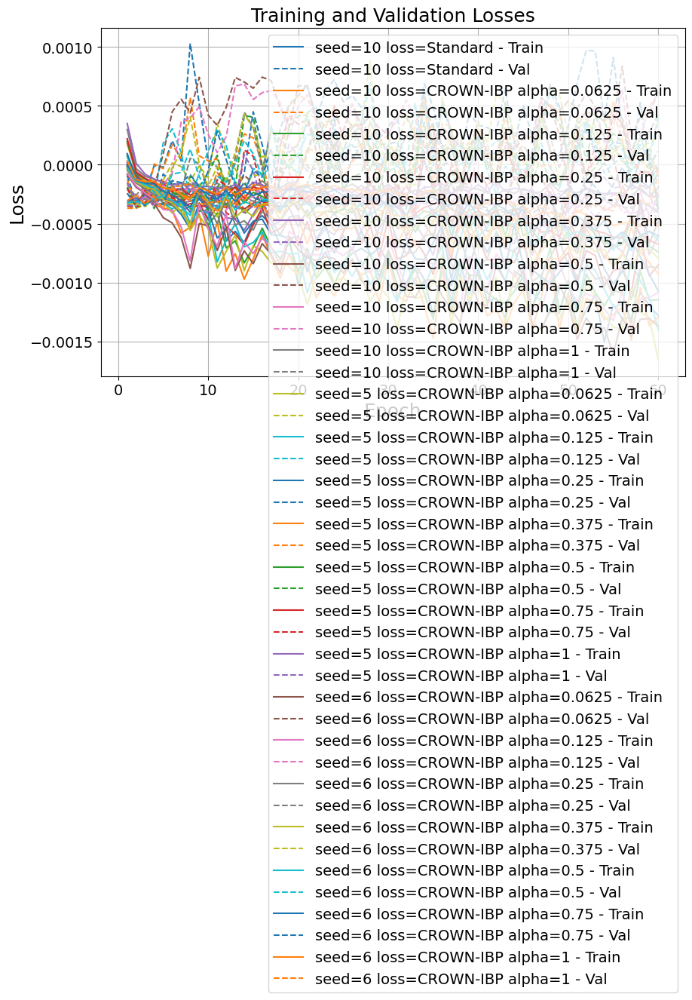

In [31]:
display_train_results(experiments)

Dataset test, Seed: 10


/tmp/ipykernel_214950/1161597947.py:15: MatplotlibDeprecationWarning: Passing label as a length 2 sequence when plotting a single dataset is deprecated in Matplotlib 3.9 and will error in 3.11.  To keep the current behavior, cast the sequence to string before passing.
  plt.plot(range(len(cum_returns)), cum_returns, label=label)


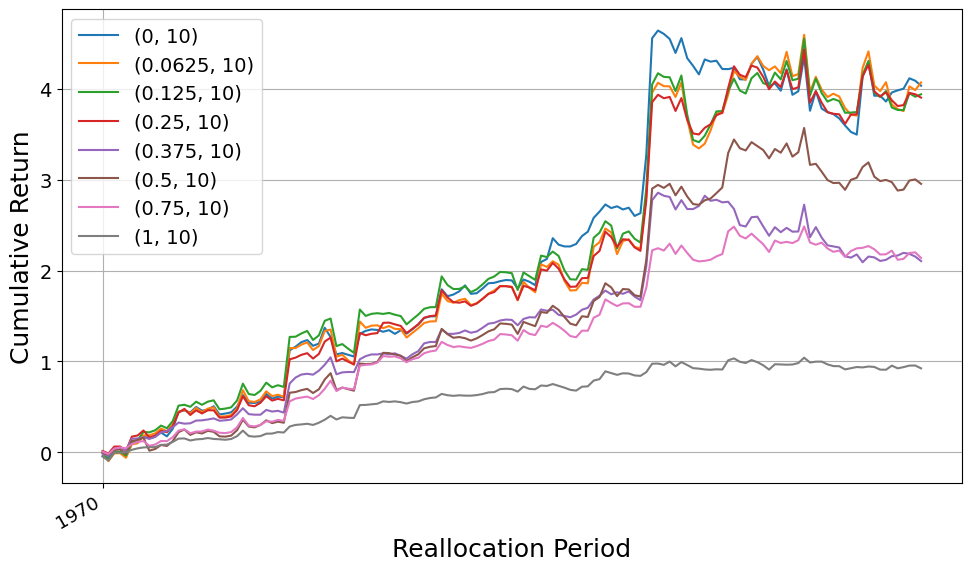

Dataset val, Seed: 10


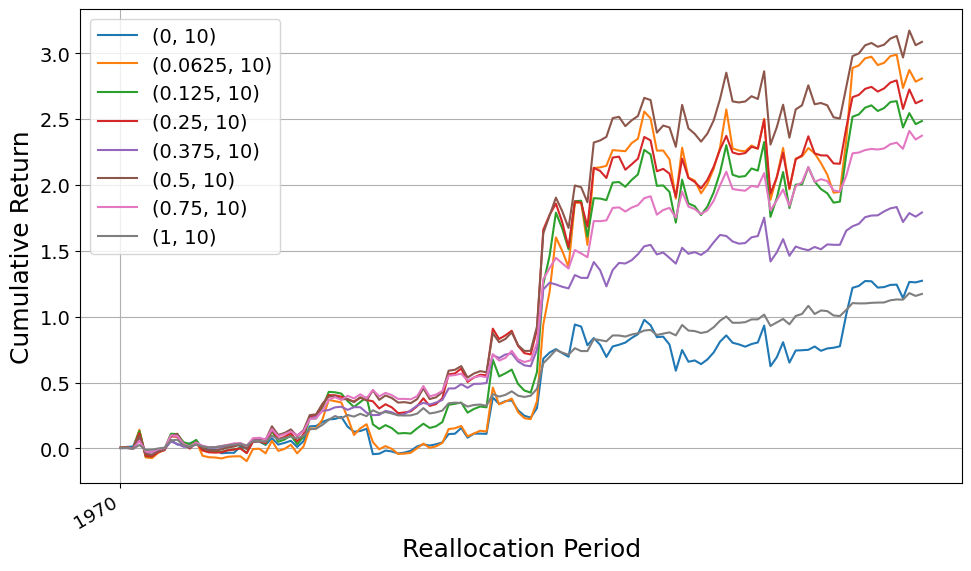

Dataset test, Seed: 5


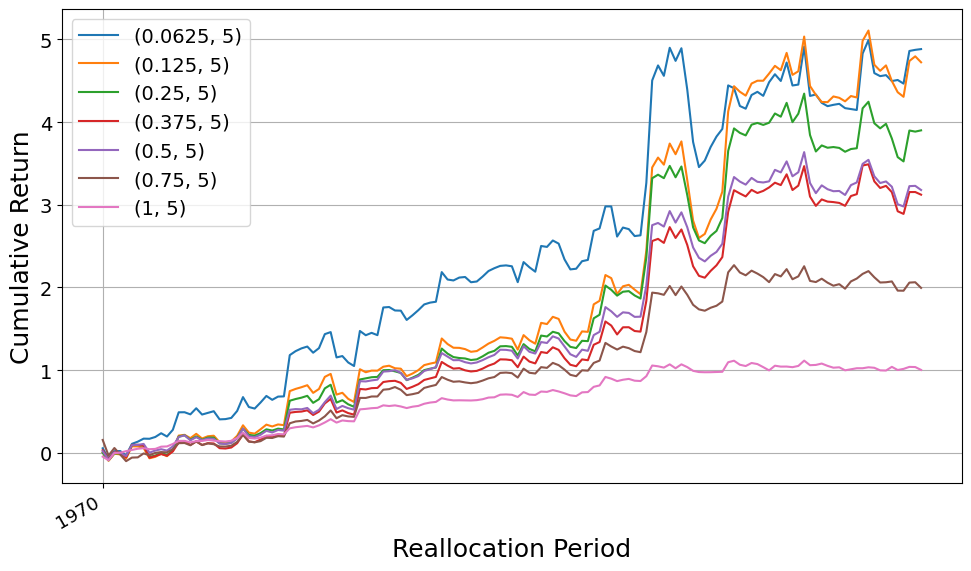

Dataset val, Seed: 5


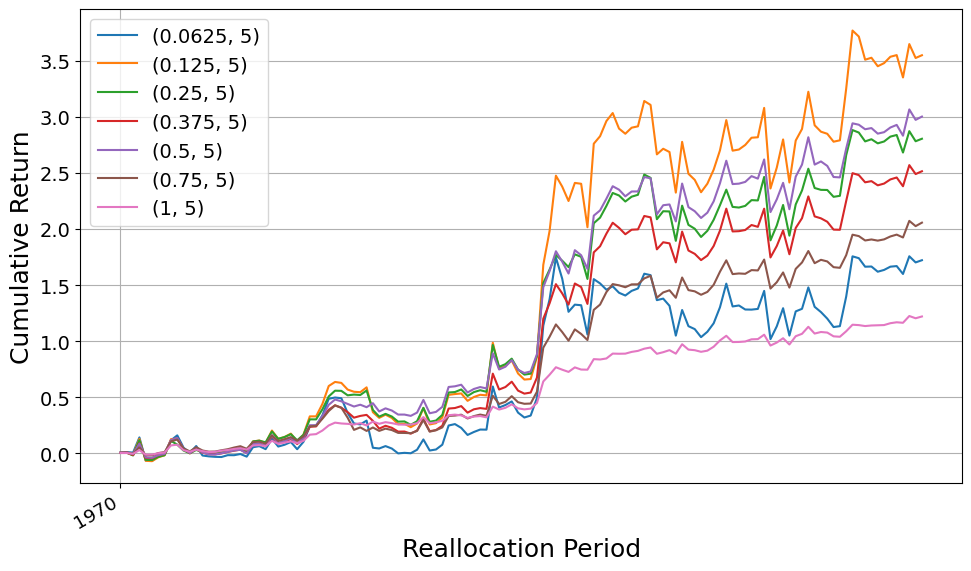

Dataset test, Seed: 6


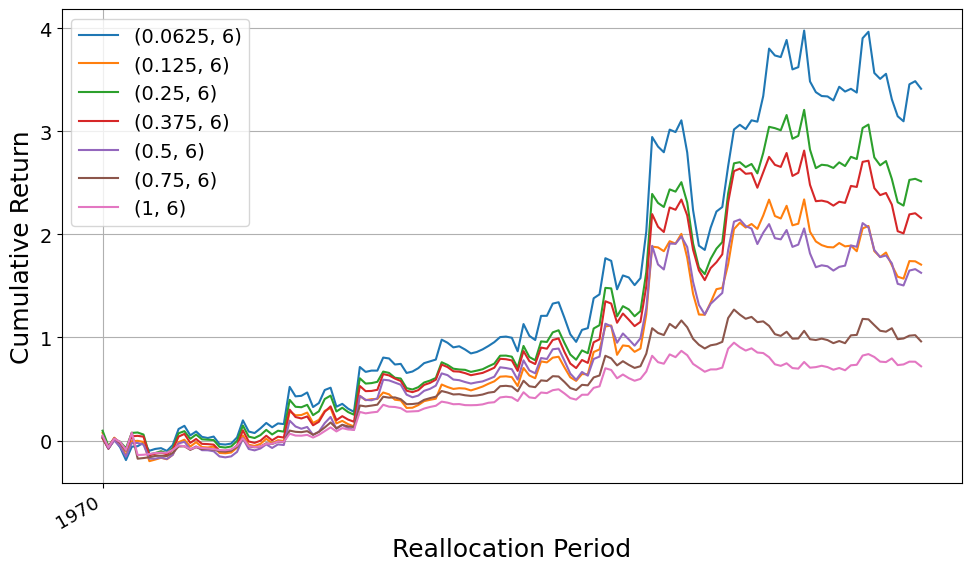

Dataset val, Seed: 6


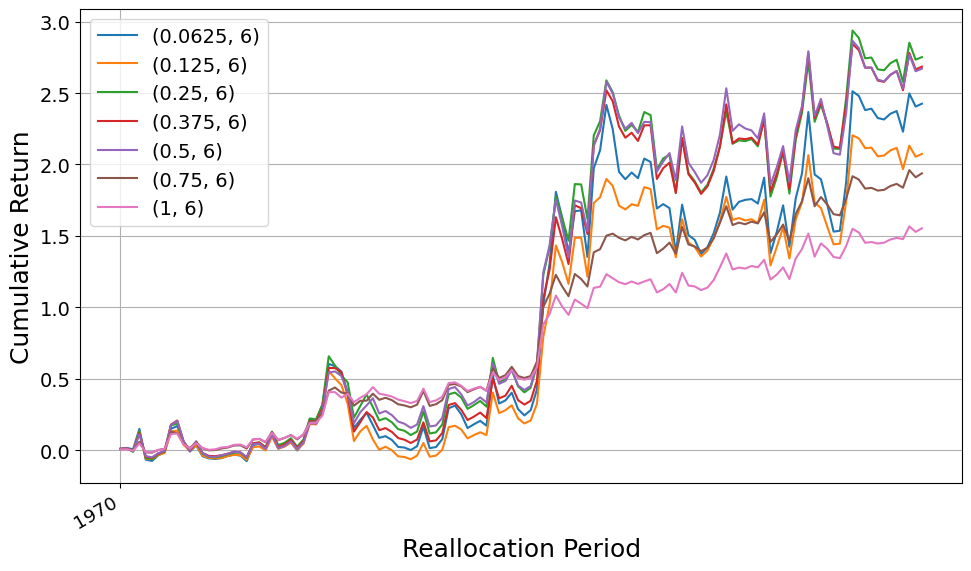

In [32]:
import matplotlib.pyplot as plt
import numpy as np

for seed in seeds:
    for dataset in ["test", "val"]:
        print(f"Dataset {dataset}, Seed: {seed}")
        crs = { (e["params"].get("alpha",0), e["params"]["seed"]) : e["results"][dataset]["raw"]["cum_returns"][::5] for ek, e in experiments.items() if seed == e["params"]["seed"]}

        cumulative_returns_dict = crs

        time_points = test_indices[50:-5][::5]#range(1, len(next(iter(cumulative_returns_dict.values()))) + 1)

        plt.figure(figsize=(10, 6))
        for label, cum_returns in cumulative_returns_dict.items():
            plt.plot(range(len(cum_returns)), cum_returns, label=label)

        plt.xlabel("Reallocation Period")
        plt.ylabel("Cumulative Return")
        # plt.ylim(bottom=0)  # Ensure returns start at zero or above
        plt.legend()
        plt.gca().xaxis.set_major_locator(mdates.YearLocator())
        plt.gca().xaxis.set_major_formatter(mdates.DateFormatter("%Y"))
        plt.setp(plt.gca().get_xticklabels(), rotation=30, ha="right", fontsize='small')

        plt.grid(True)
        plt.tight_layout()
        plt.show()


In [33]:
# Hyperparam search
best_per_alpha = {}
for alpha in [0] + alphas:
    alpha_exps = { ek: e for ek, e in experiments.items() if e["params"].get("alpha", 0) == alpha and e["params"]["seed"]  == 10}

    best_params = hyperparam_search(alpha_exps)

    alpha_seed_exps = { ek: e for ek, e in alpha_exps.items() if e["params"]["seed"] == best_params["seed"]}

    assert len(alpha_seed_exps) == 1

    best_per_alpha[alpha] = list(alpha_seed_exps.values())[0]

Hyperparam Search over seeds


,epochs,lambda_entropy,model,learning_rate,loss,jitter,weight_decay,checkpoint,mean_val_expected_return
0,60,0.0,CNN,0.001,Standard,1.5,0.00001,60,1.280139


Hyperparam Search over seeds


,epochs,lambda_entropy,model,learning_rate,loss,jitter,weight_decay,robust_eps,alpha,warmup,checkpoint,mean_val_expected_return
0,60,0.0,CNN,0.001,CROWN-IBP,1.5,0.00001,0.01,0.0625,20,60,2.831076


Hyperparam Search over seeds


,epochs,lambda_entropy,model,learning_rate,loss,jitter,weight_decay,robust_eps,alpha,warmup,checkpoint,mean_val_expected_return
0,60,0.0,CNN,0.001,CROWN-IBP,1.5,0.00001,0.01,0.125,20,60,2.504158


Hyperparam Search over seeds


,epochs,lambda_entropy,model,learning_rate,loss,jitter,weight_decay,robust_eps,alpha,warmup,checkpoint,mean_val_expected_return
0,60,0.0,CNN,0.001,CROWN-IBP,1.5,0.00001,0.01,0.25,20,60,2.660517


Hyperparam Search over seeds


,epochs,lambda_entropy,model,learning_rate,loss,jitter,weight_decay,robust_eps,alpha,warmup,checkpoint,mean_val_expected_return
0,60,0.0,CNN,0.001,CROWN-IBP,1.5,0.00001,0.01,0.375,20,60,1.800138


Hyperparam Search over seeds


,epochs,lambda_entropy,model,learning_rate,loss,jitter,weight_decay,robust_eps,alpha,warmup,checkpoint,mean_val_expected_return
0,60,0.0,CNN,0.001,CROWN-IBP,1.5,0.00001,0.01,0.5,20,60,3.10416


Hyperparam Search over seeds


,epochs,lambda_entropy,model,learning_rate,loss,jitter,weight_decay,robust_eps,alpha,warmup,checkpoint,mean_val_expected_return
0,60,0.0,CNN,0.001,CROWN-IBP,1.5,0.00001,0.01,0.75,20,60,2.384515


Hyperparam Search over seeds


,epochs,lambda_entropy,model,learning_rate,loss,jitter,weight_decay,robust_eps,alpha,warmup,checkpoint,mean_val_expected_return
0,60,0.0,CNN,0.001,CROWN-IBP,1.5,0.00001,0.01,1,20,60,1.176623


/tmp/ipykernel_214950/3969507025.py:6: MatplotlibDeprecationWarning: Passing label as a length 2 sequence when plotting a single dataset is deprecated in Matplotlib 3.9 and will error in 3.11.  To keep the current behavior, cast the sequence to string before passing.
  plt.plot(range(len(cum_returns)), cum_returns, label=label)


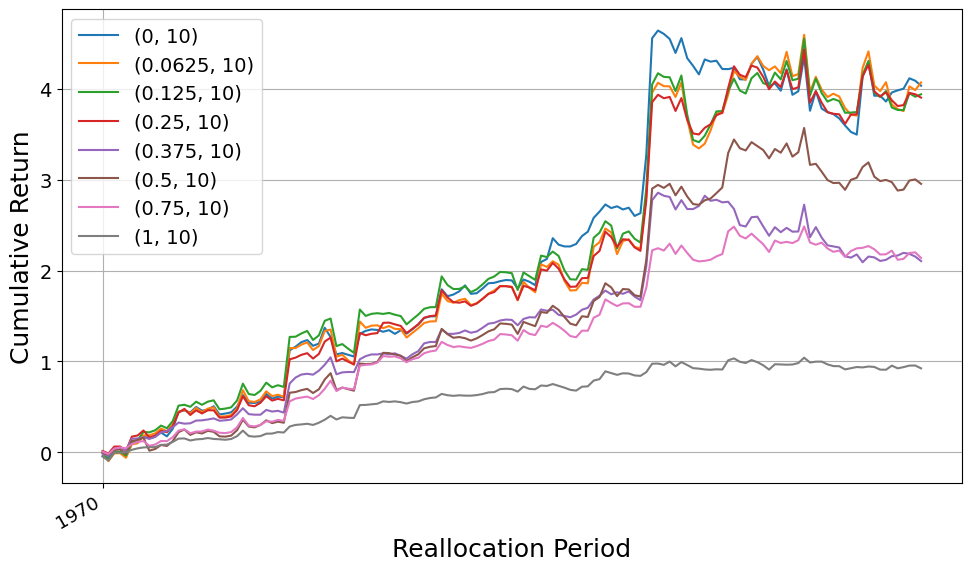

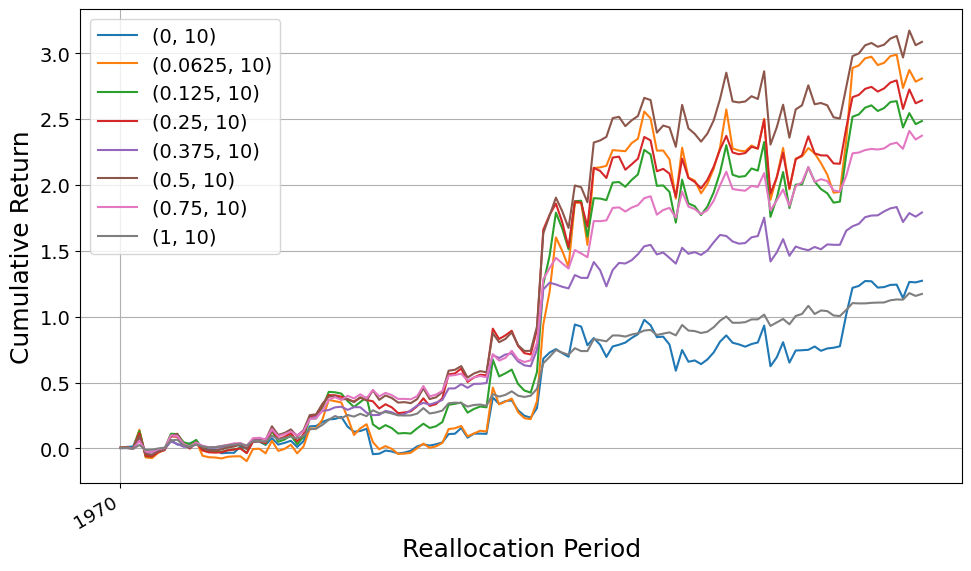

In [34]:

for dataset in ["test", "val"]:
    cumulative_returns_dict = { (e["params"].get("alpha",0), e["params"]["seed"]) : e["results"][dataset]["raw"]["cum_returns"][::5] for ek, e in best_per_alpha.items()}

    plt.figure(figsize=(10, 6))
    for label, cum_returns in cumulative_returns_dict.items():
        plt.plot(range(len(cum_returns)), cum_returns, label=label)

    plt.xlabel("Reallocation Period")
    plt.ylabel("Cumulative Return")
    plt.legend()
    plt.gca().xaxis.set_major_locator(mdates.YearLocator())
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter("%Y"))
    plt.setp(plt.gca().get_xticklabels(), rotation=30, ha="right", fontsize='small')

    plt.grid(True)
    plt.tight_layout()
    plt.show()

### Allocation distribution

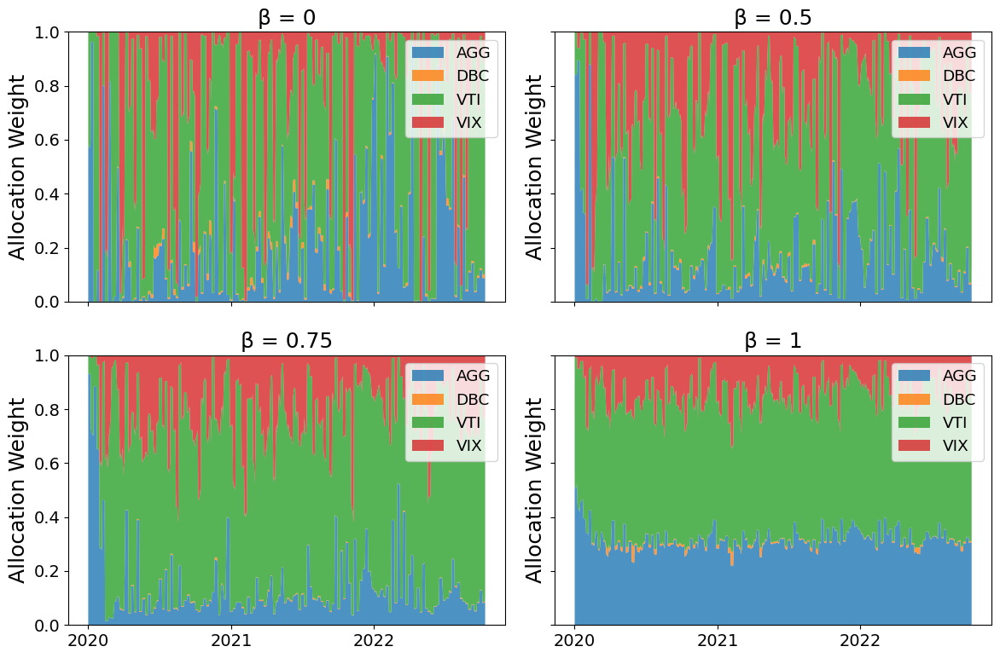

In [35]:
robust_weights = { e["params"].get("alpha", 0): e["results"]["test"]["raw"]["weights"] for ek,e in best_per_alpha.items() if e["params"].get("alpha", 0) in [0,0.5,0.75, 1]}

weights_dict = robust_weights

fig, axes = plt.subplots(2, 2, figsize=(12, 8), sharex=True, sharey=True)
axes = axes.flatten()


for ax, (label, weights) in zip(axes, robust_weights.items()):
   # Create a stackplot: weights[:,0], weights[:,1], weights[:,2], weights[:,3]
   ax.stackplot(test_indices[:-55] ,
                weights[:, 0],
                weights[:, 1],
                weights[:, 2],
           weights[:, 3],
                labels=asset_names,
                alpha=0.8)
   ax.set_title(f"β = {label}")
   # ax.set_xlabel("Date")
   ax.set_ylabel("Allocation Weight")
   ax.set_ylim(0, 1)
   ax.xaxis.set_major_locator(mdates.AutoDateLocator(minticks=1, maxticks=6))
   ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y"))
   ax.legend(loc='upper right', fontsize='small')


fig.tight_layout()
plt.show()


In [36]:
mean_entropies = { e["params"].get("alpha",0): entropy(e["results"]["test"]["raw"]["weights"]).mean() for ek,e in best_per_alpha.items()}
mean_entropies

{0: tensor(0.6059),
 0.0625: tensor(0.5771),
 0.125: tensor(0.5884),
 0.25: tensor(0.6460),
 0.375: tensor(0.6000),
 0.5: tensor(0.7764),
 0.75: tensor(0.7853),
 1: tensor(0.9763)}

In [37]:
import numpy as np

def performance_metrics(daily_returns):

    # Convert to numpy array
    r = np.asarray(daily_returns, dtype=float)
    n = len(r)
    if n == 0:
        raise ValueError("daily_returns array is empty")
    
    # 1. Annualized return: compound over entire period, then annualize
    cumulative_return = np.prod(1 + r) - 1
    years = n / 252.0
    annual_return = (1 + cumulative_return) ** (1 / years) - 1
    
    # 2. Annualized volatility: std of daily returns * sqrt(252)
    vol_daily = np.std(r, ddof=0)
    annual_volatility = vol_daily * np.sqrt(252)
    
    # 3. Sharpe ratio (zero risk-free rate)
    if annual_volatility != 0:
        sharpe_ratio = annual_return / annual_volatility
    else:
        sharpe_ratio = np.nan
    
    # 4. Maximum drawdown
    # Compute cumulative wealth index
    wealth_index = np.cumprod(1 + r)
    # Running peak of wealth
    running_max = np.maximum.accumulate(wealth_index)
    # Drawdown series
    drawdowns = (running_max - wealth_index) / running_max
    max_drawdown = np.max(drawdowns)
    
    return {
        'annual_return': annual_return,
        'annual_volatility': annual_volatility,
        'sharpe_ratio': sharpe_ratio,
        'max_drawdown': max_drawdown
    }


#### Main Results Table

In [38]:
metrics = { e["params"].get("alpha",0): performance_metrics(e["results"]["test"]["raw"]["returns"]) for ek, e in experiments.items()}

pd.DataFrame([ {"beta": k} | v for k,v in metrics.items()])

,beta,annual_return,annual_volatility,sharpe_ratio,max_drawdown
0,0.0000,0.816723,0.492076,1.659748,0.268156
1,0.0625,0.691757,0.645459,1.071729,0.322759
2,0.1250,0.394767,0.576885,0.684307,0.283351
3,0.2500,0.521706,0.599086,0.870835,0.292685
4,0.3750,0.501442,0.586651,0.854753,0.289370
5,0.5000,0.394343,0.568968,0.693086,0.277071
6,0.7500,0.259149,0.349645,0.741176,0.234970
7,1.0000,0.195234,0.305312,0.639456,0.200377


### Robustness Of Robust + Standard Models

In [39]:
def get_robustness(experiments, test_eps, test_delta, extra_args ={}, force_run=False):
    results = {}
    default_params = {
        "config": "jamie.yaml",
        "device": "cuda",
        "start": "0",
        "end": "151",
        "conv_mode": "matrix",
    } | extra_args


    model_paths = []

    to_model = {
    }
    namer = {

    }
    params = {}
    for k,v  in experiments.items():
    # for eps in [0, 0.25, 0.5]:
        robust_cnn_path = os.path.join(experiment_path, model_file_name(v["params"]))
        model_paths.append(robust_cnn_path)
        namer[robust_cnn_path] = v["params"].get("alpha", 0)
        params[robust_cnn_path] = v["params"]
        to_model[robust_cnn_path] = v["model"]

    print(model_paths)

    for model_path in model_paths:
        # model = 
        results[model_path] = {}


        # if namer[model_path] not in [0, 0.125, 0.25, 0.5]:
        #     continue
        
        for eps in test_eps:
            results[model_path][eps] = {}
            for delta in test_delta:
                path = model_path[:-4] + f"_e={eps}_d={delta}"
                for k,v in extra_args.items():
                    path+="_{k}={v}"
                output_path = path + "_output.pkl"
                results_path = path + "_results.txt" 
                cex_path = path + "_cex.json"
                debug_path = path + "_debug.txt"  

                if not os.path.isfile(output_path) or not os.path.isfile(results_path) or force_run:
                    print(f"No results found, running at {eps}, {delta}")
                    args = default_params | {
                        "epsilon": eps,
                        "delta": delta,
                        "output_file": output_path,
                        "results_file": results_path,
                        "cex_path": cex_path,
                        "load_model": model_path,
                    }
                    run_abcrown_from_dict_ipython(args, debug_path)

                
                if os.path.isfile(output_path) and os.path.isfile(results_path) and os.path.isfile(cex_path):
                    print("loading results")
                    with open(output_path, "rb") as f:
                        output_data = pickle.load(f)
                    with open(results_path, "rb") as f:
                        results_data = pickle.load(f)  
                    with open(cex_path, "r") as f:
                        cex_data = json.load(f)
                else:
                    print("failed to load results")
                    output_data = None
                    results_data = None    

                results[model_path][eps][delta] = {"results_data": results_data, "output_data": output_data, "cex_data": cex_data}

    to_df = []
    for model_path, model_path_dict in results.items():
        for eps, eps_dict in model_path_dict.items():
            for delta, delta_dict in eps_dict.items():

                Xc_test_tensor = X_test_tensor.clone()
                c = 0

                # print(summary["results_data"]["summary"]["unsafe-pgd"])
                for i in range(0,Xc_test_tensor.shape[0], 5):
                    if i // 5 in delta_dict["results_data"]["summary"]["unsafe-pgd"]:
                        avd = torch.tensor(delta_dict["cex_data"]["x"][c]).reshape(50,4)
                        c += 1
                        Xc_test_tensor[i] = avd

                # print(Xc_test_tensor)
                true_run = run_experiment(to_model[model_path], (X_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1)), experiment)
                fake_run = run_experiment(to_model[model_path], (Xc_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1)), experiment)

                cp = round((fake_run["metrics"]["expected_return"] - true_run["metrics"]["expected_return"]) / true_run["metrics"]["expected_return"], 2)
                band_width = np.mean(np.abs(fake_run["raw"]["cum_returns"] - true_run["raw"]["cum_returns"]))
                

                params_i = params[model_path]
                summary_agg = {}
                if delta_dict["results_data"] is not None:
                    summary = delta_dict["results_data"]["summary"]
                    for k, v in summary.items():
                        summary_agg[k] = len(v)

                

                to_df.append({
                    "model_path": namer[model_path],
                    "eps": eps,
                    "delta": delta,
                    "cp": cp,
                    # "seed": seed,
                    "band_width": band_width,
                    "fake": fake_run["metrics"]["expected_return"],
                    "true": true_run["metrics"]["expected_return"],
                    "fake_returns": fake_run["raw"]["cum_returns"],
                    "true_returns": true_run["raw"]["cum_returns"],
                    "summary":  delta_dict["results_data"]["summary"],
                    "adv_X": delta_dict["cex_data"]["x"]
                } | summary_agg | params_i)

    # df = pd.DataFrame(to_df)
    return to_df


#### Main Results Table

In [40]:
test_eps = [0.1]
test_delta = [0.225]
to_df = get_robustness(best_per_alpha, test_eps, test_delta)

metrics = { e["params"].get("alpha",0): performance_metrics(e["results"]["test"]["raw"]["returns"]) for ek, e in best_per_alpha.items()}

for item in to_df:
    alpha = item["model_path"]
    robust = item.get("safe-incomplete",0)+item.get("safe-complete",0)
    nonrobust = item.get("unsafe-pgd",0)
    unknown = item.get("unknown",0)


    robsut_per =  robust / (robust+nonrobust+unknown)
    cp = item["cp"]
    band_width = item["band_width"]

    metrics[alpha] = metrics[alpha] | {"robust": robsut_per, "cp": cp, "band_width": band_width}

df = pd.DataFrame([ {"beta": k} | v for k,v in metrics.items()])
df

['alpha-beta-CROWN/complete_verifier/trained_models/seed=10,epochs=60,lambda_entropy=0.0,model=CNN,learning_rate=0.001,loss=Standard,jitter=1.5,weight_decay=1e-05,checkpoint=60.pth', 'alpha-beta-CROWN/complete_verifier/trained_models/seed=10,epochs=60,lambda_entropy=0.0,model=CNN,learning_rate=0.001,loss=CROWN-IBP,jitter=1.5,weight_decay=1e-05,robust_eps=0.01,alpha=0.0625,warmup=20,checkpoint=60.pth', 'alpha-beta-CROWN/complete_verifier/trained_models/seed=10,epochs=60,lambda_entropy=0.0,model=CNN,learning_rate=0.001,loss=CROWN-IBP,jitter=1.5,weight_decay=1e-05,robust_eps=0.01,alpha=0.125,warmup=20,checkpoint=60.pth', 'alpha-beta-CROWN/complete_verifier/trained_models/seed=10,epochs=60,lambda_entropy=0.0,model=CNN,learning_rate=0.001,loss=CROWN-IBP,jitter=1.5,weight_decay=1e-05,robust_eps=0.01,alpha=0.25,warmup=20,checkpoint=60.pth', 'alpha-beta-CROWN/complete_verifier/trained_models/seed=10,epochs=60,lambda_entropy=0.0,model=CNN,learning_rate=0.001,loss=CROWN-IBP,jitter=1.5,weight_dec

,beta,annual_return,annual_volatility,sharpe_ratio,max_drawdown,robust,cp,band_width
0,0.0000,0.816723,0.492076,1.659748,0.268156,0.119205,-0.93,2.086642
1,0.0625,0.794431,0.521169,1.524326,0.297066,0.298013,-0.60,1.137333
2,0.1250,0.777707,0.509233,1.527212,0.312894,0.417219,-0.57,1.279036
3,0.2500,0.762429,0.461550,1.651889,0.288270,0.562914,-0.61,1.067858
4,0.3750,0.510785,0.298077,1.713598,0.209738,0.900662,-0.07,0.067305
5,0.5000,0.643434,0.406780,1.581774,0.253169,0.900662,-0.09,0.094188
6,0.7500,0.505594,0.272606,1.854669,0.168614,1.000000,0.00,0.000000
7,1.0000,0.287201,0.166412,1.725848,0.093562,1.000000,0.00,0.000000


## Sensitivity to pertubation magnitude

['alpha-beta-CROWN/complete_verifier/trained_models/seed=10,epochs=60,lambda_entropy=0.0,model=CNN,learning_rate=0.001,loss=Standard,jitter=1.5,weight_decay=1e-05,checkpoint=60.pth', 'alpha-beta-CROWN/complete_verifier/trained_models/seed=10,epochs=60,lambda_entropy=0.0,model=CNN,learning_rate=0.001,loss=CROWN-IBP,jitter=1.5,weight_decay=1e-05,robust_eps=0.01,alpha=0.125,warmup=20,checkpoint=60.pth', 'alpha-beta-CROWN/complete_verifier/trained_models/seed=10,epochs=60,lambda_entropy=0.0,model=CNN,learning_rate=0.001,loss=CROWN-IBP,jitter=1.5,weight_decay=1e-05,robust_eps=0.01,alpha=0.25,warmup=20,checkpoint=60.pth', 'alpha-beta-CROWN/complete_verifier/trained_models/seed=10,epochs=60,lambda_entropy=0.0,model=CNN,learning_rate=0.001,loss=CROWN-IBP,jitter=1.5,weight_decay=1e-05,robust_eps=0.01,alpha=0.5,warmup=20,checkpoint=60.pth']
loading results
loading results
loading results
loading results
loading results
loading results
loading results
loading results
loading results
loading resul

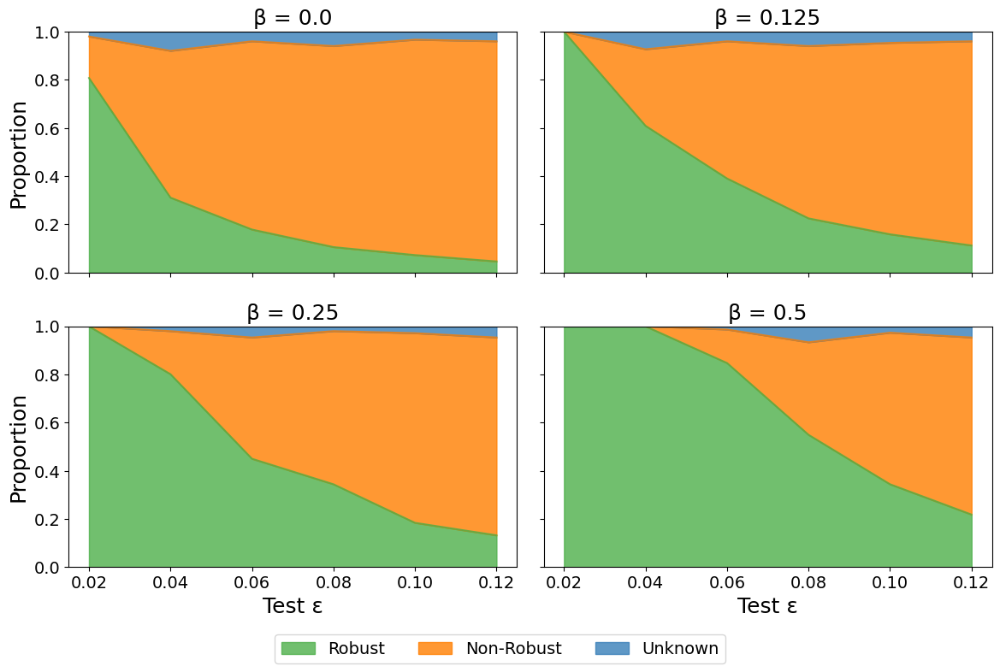

In [41]:
import pandas as pd
import matplotlib.pyplot as plt

# Assume df has columns: model_path, eps, unsafe-pgd, safe-incomplete, unknown

filtered = {k: v for k,v in best_per_alpha.items() if v["params"].get("alpha", 0) in [0, 0.125, 0.25, 0.5]}

test_eps = [0.02, 0.04, 0.06, 0.08, 0.1, 0.12]
test_delta = [0.1]

to_df = get_robustness(filtered, test_eps, test_delta)
df = pd.DataFrame(to_df)

# 1) Rename classes
col_renames = {
    'unknown': 'Unknown',
    'safe-incomplete': 'Robust',
    'unsafe-pgd': 'Non-Robust'
}

# 2) Grab Set1 palette from Matplotlib
palette = plt.get_cmap('Set1')
colors = {
    'Robust':     palette(2),  # green
    'Non-Robust': palette(4),  # red
    'Unknown':    palette(1)   # blue
}

models = df['model_path'].unique()
cols = 2
rows = (len(models) + cols - 1) // cols

fig, axes = plt.subplots(rows, cols, figsize=(12, 8), sharex=True, sharey=True)
axes = axes.flatten()

for ax, model in zip(axes, models):
    sub = (
        df[df['model_path'] == model]
        .set_index('eps')[['unsafe-pgd','safe-incomplete','unknown']]
    )
    prop = sub.div(sub.sum(axis=1), axis=0).rename(columns=col_renames)
    # 3) Reorder so robust is bottom layer
    prop = prop[['Robust', 'Non-Robust', 'Unknown']]
    prop.plot(
        kind='area',
        stacked=True,
        ax=ax,
        legend=False,
        color=[colors[c] for c in prop.columns],
        alpha=0.8
    )
    ax.set_title(f"β = {model}")
    ax.set_xlabel('Test ε')
    ax.set_ylabel('Proportion')
    ax.set_ylim(0, 1)

# Remove any empty subplots
for ax in axes[len(models):]:
    fig.delaxes(ax)

# Single global legend at bottom
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', ncol=3)

plt.tight_layout(rect=[0, 0.05, 1, 1])
plt.show()



## Counterfactual Return Comparison

In [42]:
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']

['alpha-beta-CROWN/complete_verifier/trained_models/seed=10,epochs=60,lambda_entropy=0.0,model=CNN,learning_rate=0.001,loss=Standard,jitter=1.5,weight_decay=1e-05,checkpoint=60.pth', 'alpha-beta-CROWN/complete_verifier/trained_models/seed=10,epochs=60,lambda_entropy=0.0,model=CNN,learning_rate=0.001,loss=CROWN-IBP,jitter=1.5,weight_decay=1e-05,robust_eps=0.01,alpha=0.125,warmup=20,checkpoint=60.pth', 'alpha-beta-CROWN/complete_verifier/trained_models/seed=10,epochs=60,lambda_entropy=0.0,model=CNN,learning_rate=0.001,loss=CROWN-IBP,jitter=1.5,weight_decay=1e-05,robust_eps=0.01,alpha=0.25,warmup=20,checkpoint=60.pth']
loading results
loading results
loading results


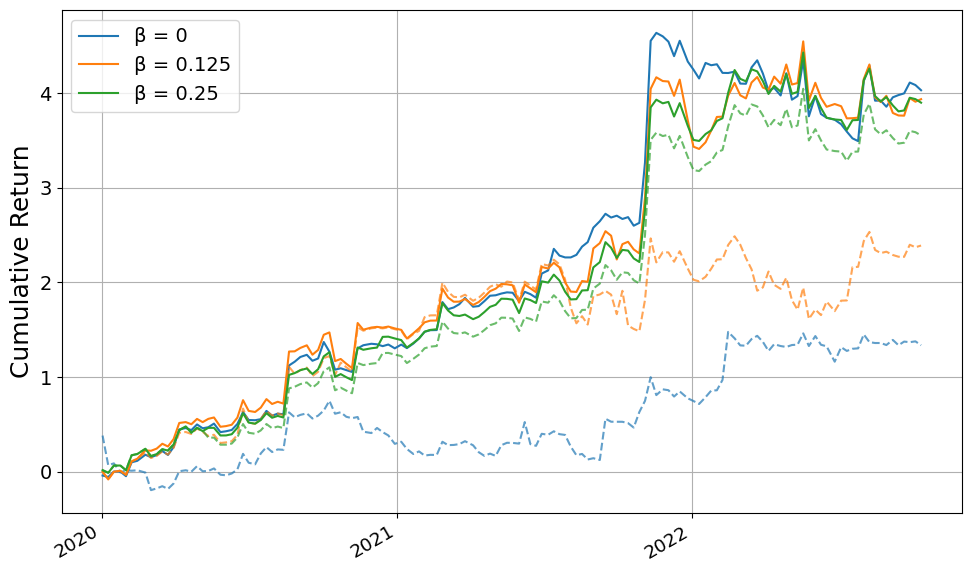

In [43]:
filtered = {k: v for k,v in best_per_alpha.items() if v["params"].get("alpha", 0) in [0, 0.125, 0.25]}

test_eps = [0.1]
test_delta = [0.3]

to_df = get_robustness(filtered, test_eps, test_delta)
plt.figure(figsize=(10, 6))
for j, row in enumerate(to_df):

    crs_fake = row["fake_returns"][::5]
    crs =row["true_returns"][::5]


    time_idx = test_indices[:-55][::5]
    

    plt.plot(time_idx, crs, label=f"β = {row['model_path']}", color=colors[j])
    plt.plot(time_idx, crs_fake, color=colors[j], alpha=0.7, linestyle='--')


plt.ylabel("Cumulative Return")
plt.legend()
plt.gca().xaxis.set_major_locator(mdates.YearLocator())
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter("%Y"))
plt.setp(plt.gca().get_xticklabels(), rotation=30, ha="right", fontsize='small')

plt.grid(True)
plt.tight_layout()
plt.show()

## Robustness vs Counterfactual return

['alpha-beta-CROWN/complete_verifier/trained_models/seed=10,epochs=60,lambda_entropy=0.0,model=CNN,learning_rate=0.001,loss=Standard,jitter=1.5,weight_decay=1e-05,checkpoint=60.pth', 'alpha-beta-CROWN/complete_verifier/trained_models/seed=10,epochs=60,lambda_entropy=0.0,model=CNN,learning_rate=0.001,loss=CROWN-IBP,jitter=1.5,weight_decay=1e-05,robust_eps=0.01,alpha=0.0625,warmup=20,checkpoint=60.pth', 'alpha-beta-CROWN/complete_verifier/trained_models/seed=10,epochs=60,lambda_entropy=0.0,model=CNN,learning_rate=0.001,loss=CROWN-IBP,jitter=1.5,weight_decay=1e-05,robust_eps=0.01,alpha=0.125,warmup=20,checkpoint=60.pth', 'alpha-beta-CROWN/complete_verifier/trained_models/seed=10,epochs=60,lambda_entropy=0.0,model=CNN,learning_rate=0.001,loss=CROWN-IBP,jitter=1.5,weight_decay=1e-05,robust_eps=0.01,alpha=0.25,warmup=20,checkpoint=60.pth', 'alpha-beta-CROWN/complete_verifier/trained_models/seed=10,epochs=60,lambda_entropy=0.0,model=CNN,learning_rate=0.001,loss=CROWN-IBP,jitter=1.5,weight_dec

,,seed,annual_return,annual_volatility,sharpe_ratio,max_drawdown,beta,robust,cp,band_width
0.0000,10,10.0,0.816723,0.492076,1.659748,0.268156,0.0000,0.119205,-0.93,2.086642
0.0625,10,10.0,0.794431,0.521169,1.524326,0.297066,0.0625,0.298013,-0.60,1.137333
0.1250,10,10.0,0.777707,0.509233,1.527212,0.312894,0.1250,0.417219,-0.57,1.279036
0.2500,10,10.0,0.762429,0.461550,1.651889,0.288270,0.2500,0.562914,-0.61,1.067858
0.3750,10,10.0,0.510785,0.298077,1.713598,0.209738,0.3750,0.900662,-0.07,0.067305
0.5000,10,10.0,0.643434,0.406780,1.581774,0.253169,0.5000,0.900662,-0.09,0.094188
0.7500,10,10.0,0.505594,0.272606,1.854669,0.168614,0.7500,1.000000,0.00,0.000000
1.0000,10,10.0,0.287201,0.166412,1.725848,0.093562,1.0000,1.000000,0.00,0.000000


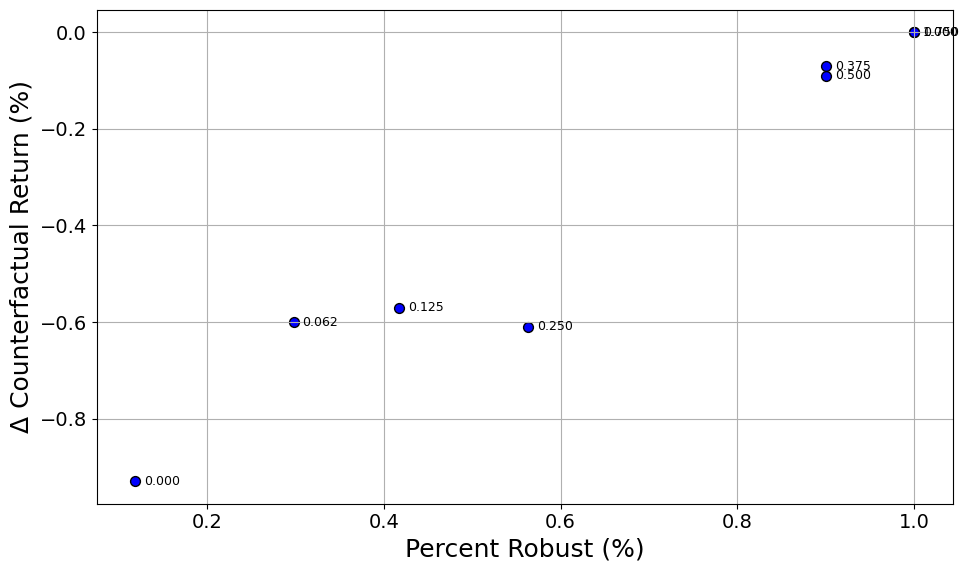

In [44]:
filtered = {k: v for k,v in best_per_alpha.items() if v["params"].get("alpha", 0) or True}

test_eps = [0.1]
test_delta = [0.225]

to_df = get_robustness(filtered, test_eps, test_delta)

metrics = { (e["params"].get("alpha",0),e["params"]["seed"]) : {"seed": e["params"]["seed"]} | performance_metrics(e["results"]["test"]["raw"]["returns"]) for ek, e in filtered.items()}

for item in to_df:
    alpha = item["model_path"]
    seed = item["seed"]
    robust = item.get("safe-incomplete",0)
    nonrobust = item.get("unsafe-pgd",0)
    unknown = item.get("unknown",0)

    robsut_per =  robust / (robust+nonrobust+unknown)

    print(robust+nonrobust+unknown)
    cp = item["cp"]
    band_width = item["band_width"]

    metrics[(alpha, seed)] = metrics[(alpha, seed)] | {"beta": alpha, "robust": robsut_per, "cp": cp, "band_width": band_width}


df_eps_02 = pd.DataFrame(metrics).T

display(df_eps_02)
plt.figure(figsize=(10, 6))
plt.scatter(
    df_eps_02['robust'],
    df_eps_02['cp'],
    s=50,
    color='blue',
    edgecolor='k'
)
for i, row in df_eps_02.iterrows():
    plt.text(
        row['robust'] + 0.01,
        row['cp'],
        f"{row['beta']:.3f}",
        fontsize=9,
        va='center'
    )
plt.xlabel('Percent Robust (%)')
plt.ylabel('Δ Counterfactual Return (%)')
# plt.title('Robustness vs. Clean P&L (Test ε=0.02, δ=0.10)')
plt.grid(True)
plt.tight_layout()
plt.show()

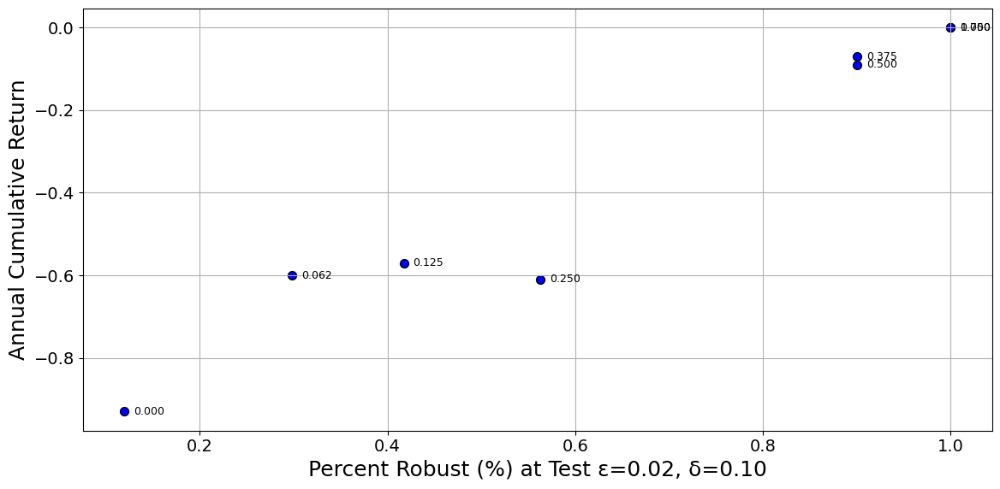

In [45]:
plt.figure(figsize=(12, 6))
plt.scatter(
    df_eps_02['robust'],
    df_eps_02['cp'],
    s=50,
    color='blue',
    edgecolor='k'
)
for i, row in df_eps_02.iterrows():
    plt.text(
        row['robust'] + 0.01,
        row['cp'],
        f"{row['beta']:.3f}",
        fontsize=9,
        va='center'
    )
plt.xlabel('Percent Robust (%) at Test ε=0.02, δ=0.10')
plt.ylabel('Annual Cumulative Return')
# plt.title('Robustness vs. Clean P&L (Test ε=0.02, δ=0.10)')
plt.grid(True)
plt.tight_layout()
plt.show()

# Alternative specificaitons

In [46]:

seeds = [10, 5, 6]

alphas = [0, 0.0625, 0.1250, 0.25, 0.3750, 0.5, 0.75, 1]

params_grids = [

    {
    "seed": seeds,
    "epochs": [60],
    "lambda_entropy": [0.000],#, 0.4],#, 0.0025],#[0.0001, 0.001, 0.01, 0.025, 0.05, 0.1],
    "model": ["CNN"],
    "learning_rate": [0.001],
    "loss": ["CROWN-IBP"],
    "jitter" : [1.5],
    "weight_decay": [1e-5],
    "robust_eps": [0.01],
    "alpha": alphas,
    "warmup": [20]
},


]


def dataset_fn(params):
    jitter = Jitter(sigma=params.get("jitter", 0.025))
    train_dataset = AugmentedTimeSeriesDataset(X_train_tensor, y_train_tensor, transform=jitter)
    val_dataset = TensorDataset(X_val_tensor, y_val_tensor)

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
    return train_loader, val_loader


experiment_path = "alpha-beta-CROWN/complete_verifier/trained_models"
experiments = get_experiment_model(standard_model_fn, experiment_path, params_grids, robust_loss_fn_fn, dataset_fn, device=device)

experiments = {k: v for k,v in experiments.items() if v["params"]["checkpoint"] == v["params"]["epochs"] }

for model_name, experiment in experiments.items():
    model = experiment["model"]
   
    experiment["results"]["val"] = run_experiment(model, (X_val_tensor, y_val_tensor[:, 0:1, :].squeeze(1)), experiment)
    experiment["results"]["test"] = run_experiment(model, (X_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1)), experiment)



HERE
{60: 'alpha-beta-CROWN/complete_verifier/trained_models/seed=10,epochs=60,lambda_entropy=0.0,model=CNN,learning_rate=0.001,loss=CROWN-IBP,jitter=1.5,weight_decay=1e-05,robust_eps=0.01,alpha=0,warmup=20,checkpoint=60.pth'}
None
[True]
['alpha-beta-CROWN/complete_verifier/trained_models/seed=10,epochs=60,lambda_entropy=0.0,model=CNN,learning_rate=0.001,loss=CROWN-IBP,jitter=1.5,weight_decay=1e-05,robust_eps=0.01,alpha=0,warmup=20,checkpoint=60.pth']
Loading alpha-beta-CROWN/complete_verifier/trained_models/seed=10,epochs=60,lambda_entropy=0.0,model=CNN,learning_rate=0.001,loss=CROWN-IBP,jitter=1.5,weight_decay=1e-05,robust_eps=0.01,alpha=0,warmup=20,checkpoint=60.pth
HERE
{60: 'alpha-beta-CROWN/complete_verifier/trained_models/seed=10,epochs=60,lambda_entropy=0.0,model=CNN,learning_rate=0.001,loss=CROWN-IBP,jitter=1.5,weight_decay=1e-05,robust_eps=0.01,alpha=0.0625,warmup=20,checkpoint=60.pth'}
None
[True]
['alpha-beta-CROWN/complete_verifier/trained_models/seed=10,epochs=60,lambda_

In [47]:
filtered= {}

# filtered["test"] = experiments["seed=10 loss=CROWN-IBP alpha=0.25"]

In [48]:
test_eps = [0.1]
test_delta = [0.0025]
to_df = get_robustness(experiments, test_eps, test_delta, extra_args={"robustness_type": "MR"})

['alpha-beta-CROWN/complete_verifier/trained_models/seed=10,epochs=60,lambda_entropy=0.0,model=CNN,learning_rate=0.001,loss=CROWN-IBP,jitter=1.5,weight_decay=1e-05,robust_eps=0.01,alpha=0,warmup=20,checkpoint=60.pth', 'alpha-beta-CROWN/complete_verifier/trained_models/seed=10,epochs=60,lambda_entropy=0.0,model=CNN,learning_rate=0.001,loss=CROWN-IBP,jitter=1.5,weight_decay=1e-05,robust_eps=0.01,alpha=0.0625,warmup=20,checkpoint=60.pth', 'alpha-beta-CROWN/complete_verifier/trained_models/seed=10,epochs=60,lambda_entropy=0.0,model=CNN,learning_rate=0.001,loss=CROWN-IBP,jitter=1.5,weight_decay=1e-05,robust_eps=0.01,alpha=0.125,warmup=20,checkpoint=60.pth', 'alpha-beta-CROWN/complete_verifier/trained_models/seed=10,epochs=60,lambda_entropy=0.0,model=CNN,learning_rate=0.001,loss=CROWN-IBP,jitter=1.5,weight_decay=1e-05,robust_eps=0.01,alpha=0.25,warmup=20,checkpoint=60.pth', 'alpha-beta-CROWN/complete_verifier/trained_models/seed=10,epochs=60,lambda_entropy=0.0,model=CNN,learning_rate=0.001,l

In [49]:


metrics = { (e["params"].get("alpha",0), e["params"]["seed"]): performance_metrics(e["results"]["test"]["raw"]["returns"]) for ek, e in experiments.items()}

for item in to_df:
    alpha = item["model_path"]
    seed = item["seed"]
    robust = item.get("safe-incomplete",0)
    nonrobust = item.get("unsafe-pgd",0)
    unknown = item.get("unknown",0)


    robsut_per =  robust / (robust+nonrobust+unknown)
    cp = item["cp"]
    band_width = item["band_width"]

    metrics[(alpha,seed)] = metrics[(alpha,seed)] | {"robust": robsut_per, "cp": cp, "band_width": band_width}

df_MR = pd.DataFrame([ {"beta": k[0], "seed": k[1]}| v for k,v in metrics.items()]) 

In [50]:
df_MR

,beta,seed,annual_return,annual_volatility,sharpe_ratio,max_drawdown,robust,cp,band_width
0,0.0000,10,1.464646,0.604629,2.422390,0.357134,0.432624,-0.92,4.178065
1,0.0625,10,0.794431,0.521169,1.524326,0.297066,0.539007,-0.96,1.710515
2,0.1250,10,0.777707,0.509233,1.527212,0.312894,0.638298,-0.96,1.633624
3,0.2500,10,0.762429,0.461550,1.651889,0.288270,0.652482,-0.93,1.583833
4,0.3750,10,0.510785,0.298077,1.713598,0.209738,0.794326,-0.72,0.852461
5,0.5000,10,0.643434,0.406780,1.581774,0.253169,0.716312,-0.79,0.937458
6,0.7500,10,0.505594,0.272606,1.854669,0.168614,0.893617,-0.37,0.379883
7,1.0000,10,0.287201,0.166412,1.725848,0.093562,0.971631,-0.14,0.061967
8,0.0000,5,0.628304,0.569232,1.103775,0.305340,0.432624,-1.23,1.383471
9,0.0625,5,0.857245,0.552556,1.551419,0.288567,0.432624,-1.04,2.206613


In [51]:
# test_eps = [0.1]
# test_delta = [0.2225]
# to_df = get_robustness(experiments, test_eps, test_delta)
# to_df

In [52]:
# pd.DataFrame(to_df)

In [53]:
# 0/0

metrics = { (e["params"].get("alpha",0), e["params"]["seed"]): performance_metrics(e["results"]["test"]["raw"]["returns"]) for ek, e in experiments.items()}

for item in to_df:
    alpha = item["model_path"]
    robust = item.get("safe-incomplete",0)
    nonrobust = item.get("unsafe-pgd",0)
    unknown = item.get("unknown",0)

    robsut_per =  robust / (robust+nonrobust+unknown)
    cp = item["cp"]
    band_width = item["band_width"]

    print(robust)

    metrics[(alpha,seed)] = metrics[(alpha,seed)] | {"robust": robsut_per, "cp": cp, "band_width": band_width}

df_spike = pd.DataFrame([ {"beta": k[0], "seed": k[1]} | v for k,v in metrics.items()])

metrics

61
76
90
92
112
101
126
137
61
61
73
79
90
99
117
136
48
61
71
73
87
97
126
133


{(0, 10): {'annual_return': 1.4646463381791945,
  'annual_volatility': 0.6046285045489671,
  'sharpe_ratio': 2.4223904879770304,
  'max_drawdown': 0.3571340883471572},
 (0.0625, 10): {'annual_return': 0.7944312593938916,
  'annual_volatility': 0.5211688117946364,
  'sharpe_ratio': 1.5243261711273175,
  'max_drawdown': 0.2970657857992031},
 (0.125, 10): {'annual_return': 0.7777067257985835,
  'annual_volatility': 0.5092330476588905,
  'sharpe_ratio': 1.527211812693527,
  'max_drawdown': 0.31289372769812424},
 (0.25, 10): {'annual_return': 0.7624287772148972,
  'annual_volatility': 0.4615496435274552,
  'sharpe_ratio': 1.651888995922373,
  'max_drawdown': 0.28827049358098933},
 (0.375, 10): {'annual_return': 0.5107847266633412,
  'annual_volatility': 0.2980772745767681,
  'sharpe_ratio': 1.7135983526036687,
  'max_drawdown': 0.2097382547412916},
 (0.5, 10): {'annual_return': 0.6434341148783287,
  'annual_volatility': 0.406780166311813,
  'sharpe_ratio': 1.5817735675566618,
  'max_drawdow

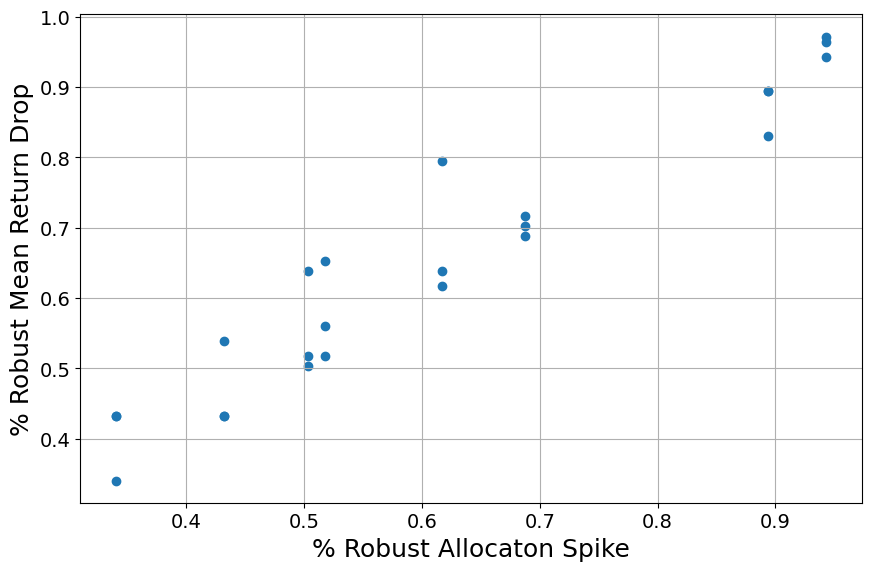

0.9607139024776127


In [54]:
import pandas as pd
import matplotlib.pyplot as plt

# Sample data for demonstration. Replace df1 and df2 with your actual DataFrames.
# df1 = pd.DataFrame({
#     'beta': [0.1, 0.2, 0.3, 0.4, 0.5],
#     'robust': [1.0, 2.5, 3.0, 4.5, 5.0]
# })
# df2 = pd.DataFrame({
#     'beta': [0.1, 0.2, 0.3, 0.4, 0.5],
#     'robust': [0.8, 2.7, 2.9, 4.2, 5.3]
# })

# merged = pd.merge(
#     df_spike[['beta', 'robust']], 
#     df_MR[['beta', 'robust']], 
#     on=['beta', "seed"], 
#     suffixes=('_df1', '_df2')
# )

# # Calculate Pearson correlation coefficient

# Merge on 'beta'
merged = pd.merge(
    df_spike[['beta', 'robust']], 
    df_MR[['beta', 'robust']], 
    on='beta', 
    suffixes=('_df1', '_df2')
)

corr = merged['robust_df1'].corr(merged['robust_df2'])



# Scatter plot of robust values from df1 vs df2
plt.figure(figsize=(9, 6))
plt.scatter(merged['robust_df1'], merged['robust_df2'], marker='o')
plt.xlabel('% Robust Allocaton Spike')
plt.ylabel('% Robust Mean Return Drop')
plt.grid(True)  # Add gridlines
# plt.text(0.05, 0.95, f'Corr = {corr:.2f}', transform=plt.gca().transAxes, va='top')

# plt.title('Scatter plot of robust values by beta')
plt.tight_layout()
plt.show()

print(corr)

In [55]:
df_spike

,beta,seed,annual_return,annual_volatility,sharpe_ratio,max_drawdown,robust,cp,band_width
0,0.0000,10,1.464646,0.604629,2.422390,0.357134,NaN,NaN,NaN
1,0.0625,10,0.794431,0.521169,1.524326,0.297066,NaN,NaN,NaN
2,0.1250,10,0.777707,0.509233,1.527212,0.312894,NaN,NaN,NaN
3,0.2500,10,0.762429,0.461550,1.651889,0.288270,NaN,NaN,NaN
4,0.3750,10,0.510785,0.298077,1.713598,0.209738,NaN,NaN,NaN
5,0.5000,10,0.643434,0.406780,1.581774,0.253169,NaN,NaN,NaN
6,0.7500,10,0.505594,0.272606,1.854669,0.168614,NaN,NaN,NaN
7,1.0000,10,0.287201,0.166412,1.725848,0.093562,NaN,NaN,NaN
8,0.0000,5,0.628304,0.569232,1.103775,0.305340,NaN,NaN,NaN
9,0.0625,5,0.857245,0.552556,1.551419,0.288567,NaN,NaN,NaN


In [56]:
filtered = {k: v for k,v in best_per_alpha.items() if v["params"].get("alpha", 0) in [0.25]}

test_eps = [0.1]
test_delta = [0.225]
# "robustness_type": "MR", 
to_df_allocation_spikes = get_robustness(filtered, test_eps, test_delta)

['alpha-beta-CROWN/complete_verifier/trained_models/seed=10,epochs=60,lambda_entropy=0.0,model=CNN,learning_rate=0.001,loss=CROWN-IBP,jitter=1.5,weight_decay=1e-05,robust_eps=0.01,alpha=0.25,warmup=20,checkpoint=60.pth']
loading results


In [57]:
filtered = {k: v for k,v in best_per_alpha.items() if v["params"].get("alpha", 0) in [0.25]}

test_eps = [0.1, 0.01]
test_delta = [0.01, 0.001, 0]

test_eps = [0.1]
test_delta = [0.01]

to_df_MR = get_robustness(filtered, test_eps, test_delta, extra_args={"robustness_type": "MR"}, force_run=False)

['alpha-beta-CROWN/complete_verifier/trained_models/seed=10,epochs=60,lambda_entropy=0.0,model=CNN,learning_rate=0.001,loss=CROWN-IBP,jitter=1.5,weight_decay=1e-05,robust_eps=0.01,alpha=0.25,warmup=20,checkpoint=60.pth']
loading results


In [58]:
# to_df_MR[1]["summary"]["safe-incomplete"]

### Results table here

In [59]:
filtered = {k: v for k,v in experiments.items() if v["params"]["seed"] == 6 and v["params"].get("alpha",0) == 0.25 }

filtered

{'seed=6 alpha=0.25': {'model': FinalCNN(
    (conv1): Conv1d(4, 32, kernel_size=(3,), stride=(1,), padding=(1,))
    (conv2): Conv1d(32, 64, kernel_size=(3,), stride=(1,), padding=(1,))
    (relu): ReLU()
    (dropout): Dropout(p=0.1, inplace=False)
    (flatten): Flatten(start_dim=1, end_dim=-1)
    (fc1): Linear(in_features=3200, out_features=100, bias=True)
    (fc2): Linear(in_features=100, out_features=4, bias=True)
    (softmax): CustomSoftmax()
  ),
  'params': {'seed': 6,
   'epochs': 60,
   'lambda_entropy': 0.0,
   'model': 'CNN',
   'learning_rate': 0.001,
   'loss': 'CROWN-IBP',
   'jitter': 1.5,
   'weight_decay': 1e-05,
   'robust_eps': 0.01,
   'alpha': 0.25,
   'warmup': 20,
   'checkpoint': 60},
  'results': {'val': {'metrics': {'expected_return': 2.772289276123047,
     'sharpe_ratio': 0.06976098,
     'max_drawdown': 0.42869028,
     'mean_entropy': 0.7460625171661377,
     'mean_return': 0.002891416,
     'std_return': 0.041447468},
    'raw': {'weights': tensor([[

In [60]:
# to_df_MR = get_robustness(filtered, [0.1, 0.05, 0.01],  [0.001, 0.0005, 0.0001], extra_args={"robustness_type": "MR"}, force_run=False)

In [61]:
# test_eps = [0]
# test_delta_MR = [-1]
# # test_delta_alloc = [0.1, 0.01]
# # 
# to_df_MR = get_robustness(filtered, test_eps, test_delta_MR, extra_args={"robustness_type": "MR"}, force_run=False)
# # to_df_allocation_spikes = get_robustness(filtered, test_eps, test_delta_alloc, force_run=False)

In [62]:
# # weights shift a lot but no impact on returns
# test_eps = [0.1]
# test_delta_MR = [0.01, 0.001]
# test_delta_alloc = [0.1, 0.01]

# to_df_MR = get_robustness(filtered, test_eps, test_delta_MR, extra_args={"robustness_type": "MR"}, force_run=False)
# # to_df_allocation_spikes = get_robustness(filtered, test_eps, test_delta_alloc, force_run=False)

In [63]:
# 0/0

In [64]:
# MR_safe = to_df_MR[0]["summary"]["safe-incomplete"]
# alloc_unsafe = to_df_allocation_spikes[0]["summary"]["unsafe"]

# common = list(set(MR_safe) & set(alloc_unsafe))
# print(common) 

In [65]:
# alloc_unsafe

In [66]:
keys = ['safe-incomplete', 'unsafe-pgd', 'unknown']


for MR_ in to_df_MR: 
    for Alloc_ in to_df_allocation_spikes: 
        print(f'MRdelta={MR_["delta"]}, Alloc_={Alloc_["delta"]}')
        print(MR_["summary"])
        print
        counts = {
            k1: {
                k2: len(set( MR_["summary"][k1]).intersection(Alloc_["summary"][k2]))
                for k2 in keys
            }
            for k1 in keys
        }

        # Turn it into a DataFrame
        df = pd.DataFrame(counts).T[keys]
        df.index.name = 'Allocation'   # rows come from dict1’s keys
        df.columns.name = 'MR'
        print(df)

MRdelta=0.01, Alloc_=0.225
defaultdict(<class 'list'>, {'safe-incomplete': [0, 1, 2, 4, 5, 6, 8, 9, 10, 11, 12, 13, 14, 15, 16, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 69, 71, 72, 74, 75, 76, 77, 78, 79, 81, 82, 83, 84, 85, 86, 87, 88, 89, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 104, 105, 106, 107, 108, 109, 110, 112, 113, 115, 117, 119, 120, 121, 122, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 143, 144, 145, 146, 147, 148, 149, 150], 'unsafe-pgd': [3, 7, 17, 22, 41, 54, 68, 73, 90, 103, 111, 114, 116, 118], 'unknown': [70, 80, 123, 142]})
MR               safe-incomplete  unsafe-pgd  unknown
Allocation                                           
safe-incomplete               83          32       18
unsafe-pgd                     2          11        1
unknown                        0

In [67]:
test_eps = [0.1]
test_delta_MR = [0.001]
test_delta_alloc = [0.1]

to_df_MR = get_robustness(filtered, test_eps, test_delta_MR, extra_args={"robustness_type": "MR"}, force_run=False)
to_df_allocation_spikes = get_robustness(filtered, test_eps, test_delta_alloc, force_run=False)

['alpha-beta-CROWN/complete_verifier/trained_models/seed=6,epochs=60,lambda_entropy=0.0,model=CNN,learning_rate=0.001,loss=CROWN-IBP,jitter=1.5,weight_decay=1e-05,robust_eps=0.01,alpha=0.25,warmup=20,checkpoint=60.pth']
loading results
['alpha-beta-CROWN/complete_verifier/trained_models/seed=6,epochs=60,lambda_entropy=0.0,model=CNN,learning_rate=0.001,loss=CROWN-IBP,jitter=1.5,weight_decay=1e-05,robust_eps=0.01,alpha=0.25,warmup=20,checkpoint=60.pth']
loading results


[32, 98, 99, 40, 41, 107, 44, 13, 77, 49, 89, 122, 93, 94]
tensor([[-0.1001,  0.1000,  0.1000, -0.1000],
        [ 0.1000,  0.1000,  0.1000, -0.1000],
        [ 0.1002, -0.1000,  0.1000, -0.1000],
        [ 0.0999,  0.1000,  0.1000, -0.1000],
        [ 0.1001,  0.1000,  0.1000, -0.1000],
        [ 0.0999,  0.1000,  0.1000, -0.1000],
        [ 0.1001,  0.1000,  0.1000, -0.1000],
        [ 0.1001,  0.1000, -0.1000,  0.1000],
        [ 0.1000,  0.1000, -0.1000, -0.1000],
        [-0.1001,  0.1000, -0.1000,  0.1000],
        [ 0.1000,  0.1000, -0.1000,  0.1000],
        [-0.1001, -0.1000, -0.1000,  0.1000],
        [-0.0999, -0.1000, -0.1000,  0.1000],
        [-0.1000,  0.1000, -0.1000,  0.1000],
        [-0.0999, -0.1000, -0.1000,  0.1000],
        [ 0.0999, -0.1000, -0.1000,  0.1000],
        [-0.0999, -0.1000, -0.1000,  0.1000],
        [-0.1001, -0.1000, -0.1000,  0.1000],
        [ 0.1001, -0.1000,  0.1000, -0.1000],
        [ 0.1000, -0.1000,  0.1000, -0.1000],
        [ 0.1000, -0.

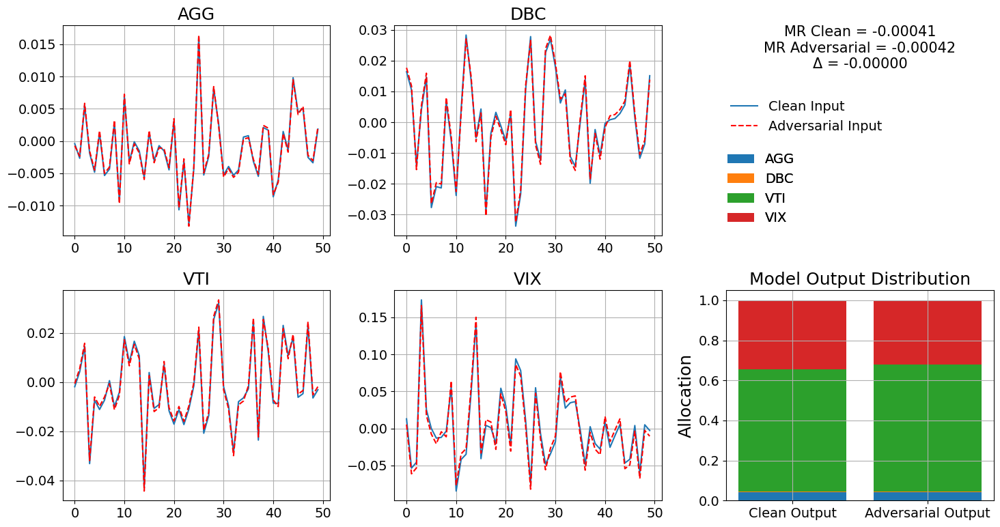

In [68]:

for MR_ in to_df_MR: 
    for Alloc_ in to_df_allocation_spikes: 

        if MR_["delta"] != 0.001 or Alloc_["delta"] != 0.1:
            continue


        print(list(set(Alloc_["summary"]["safe-incomplete"]).intersection(MR_["summary"]["unsafe-pgd"])))



        for i in list(set(MR_["summary"]["safe-incomplete"]).intersection(Alloc_["summary"]["unsafe-pgd"])):


        
            adv_X = torch.tensor(Alloc_["adv_X"][Alloc_["summary"]["unsafe-pgd"].index(i)]).reshape(50,4)

          
            
            o_X = X_test_tensor[::5][i]
            y = y_test_tensor[::5][i]

            print(adv_X - o_X)

            

            # print(adv_X.unsqueeze(0).shape)

            t1 = adv_X.unsqueeze(0).to(device)
            t2 = o_X.unsqueeze(0).to(device)

            # print(torch.max(torch.abs(o_X -adv_X)))



            w1 =model(t1).detach().cpu()
            w2 =model(t2).detach().cpu()

            MR_delta = (y.mean(0)*w1).mean() - (y.mean(0)*w2).mean()

          

            if MR_delta > 0:

                print("Before", (y.mean(0)*w2).mean().item())
                print("After",  (y.mean(0)*w1).mean())
                # break

       

                adv_X = destandardize(adv_X.unsqueeze(1), saved_mean, saved_std).squeeze(1)
                o_X = destandardize(o_X.unsqueeze(1), saved_mean, saved_std).squeeze(1)


                categories = asset_names
                colors = ['C0', 'C1', 'C2', 'C4']
                before = w1.numpy()[0]# np.array([0.6, 0.3, 0.1])
                after = w2.numpy()[0] # np.array([0.4, 0.4, 0.2])


                # asset_names = ['Asset A', 'Asset B', 'Asset C', 'Asset D']
                categories  = asset_names
                colors      = ['C0', 'C1', 'C2', 'C3']
                # before = np.array([0.4, 0.3, 0.2, 0.1])
                # after  = np.array([0.1, 0.2, 0.3, 0.4])

                # Example MR metrics (replace with your actual MR values)
                mr_clean = (y.mean(0)*w1).mean().item()
                mr_adv   = (y.mean(0)*w2).mean().item()
                delta    = mr_adv - mr_clean

                fig = plt.figure(figsize=(15, 8))
                gs = fig.add_gridspec(2, 3, width_ratios=[1, 1, 1])

                # 2x2 line plots
                axes = [
                    fig.add_subplot(gs[0, 0]),
                    fig.add_subplot(gs[0, 1]),
                    fig.add_subplot(gs[1, 0]),
                    fig.add_subplot(gs[1, 1])
                ]

                handles = []
                for i, ax in enumerate(axes):
                    h_clean, = ax.plot(o_X[:, i], label='Clean Input')
                    h_adv,   = ax.plot(adv_X[:, i], linestyle='--', label='Adversarial Input', color='red')
                    if i == 0:
                        handles = [h_clean, h_adv]
                    ax.set_title(asset_names[i])
                    ax.grid(True)

                # Stacked bar chart in bottom-right cell only
                ax_stack = fig.add_subplot(gs[1, 2])
                bottom_before = bottom_after = 0
                bars = []
                for val_b, val_a, color in zip(before, after, colors):
                    bar_b = ax_stack.bar(0, val_b, bottom=bottom_before, color=color)
                    bar_a = ax_stack.bar(1, val_a, bottom=bottom_after, color=color)
                    bars.append(bar_b[0])
                    bottom_before += val_b
                    bottom_after  += val_a

                ax_stack.set_xticks([0, 1])
                ax_stack.set_xticklabels(['Clean Output', 'Adversarial Output'])
                ax_stack.set_ylabel('Allocation')
                ax_stack.set_title('Model Output Distribution')
                ax_stack.grid(True)

                # Dummy axis for legends and MR text in the top-right cell
                ax_leg = fig.add_subplot(gs[0, 2])
                ax_leg.axis('off')

                legend1_loc = 'upper center'           # options: 'upper left', 'upper right', etc.
                legend1_bbox = (0.3,0.7)            # (x, y) in axes fraction for line-plot legend
                legend2_loc = 'upper right'           # options similarly
                legend2_bbox = (0.3,0.45) 

                # Add MR text above legends
                textstr = f"MR Clean = {mr_clean:.5f}\nMR Adversarial = {mr_adv:.5f}\n\u0394 = {delta:.5f}"
                ax_leg.text(0.5, 1, textstr, ha='center', va='top', fontsize=15)

                # Add line-plot legend
                legend1 = ax_leg.legend(handles, ['Clean Input', 'Adversarial Input'],
                                        loc=legend1_loc, bbox_to_anchor=legend1_bbox, frameon=False)
                ax_leg.add_artist(legend1)

                # Bar-chart legend (position controlled)
                legend2 = ax_leg.legend(bars, categories,
                                        loc=legend2_loc, bbox_to_anchor=legend2_bbox, frameon=False)
                ax_leg.add_artist(legend2)

                plt.tight_layout()
                plt.show()

                break

            

[32, 98, 99, 40, 41, 107, 44, 13, 77, 49, 89, 122, 93, 94]
tensor([[ 0.1000,  0.1000,  0.1000, -0.1000],
        [ 0.1001, -0.1000,  0.1000, -0.1000],
        [ 0.0999, -0.1000,  0.1000, -0.1000],
        [ 0.1000, -0.1000,  0.1000, -0.1000],
        [ 0.0999, -0.1000, -0.1000, -0.1000],
        [ 0.1001, -0.1000, -0.1000, -0.1000],
        [-0.0999, -0.1000, -0.1000,  0.1000],
        [-0.1001, -0.1000, -0.1000,  0.1000],
        [ 0.1000,  0.1000,  0.1000, -0.1000],
        [ 0.1000,  0.1000,  0.1000, -0.1000],
        [ 0.1001,  0.1000,  0.1000, -0.1000],
        [ 0.0998,  0.1000, -0.1000,  0.1000],
        [ 0.1000, -0.1000, -0.1000,  0.1000],
        [-0.1000, -0.1000, -0.1000,  0.1000],
        [ 0.1000, -0.1000, -0.1000,  0.1000],
        [-0.1000, -0.1000, -0.1000,  0.1000],
        [ 0.1000, -0.1000, -0.1000, -0.1000],
        [ 0.0998, -0.1000,  0.1000, -0.1000],
        [ 0.1002, -0.1000,  0.1000, -0.1000],
        [ 0.0999, -0.1000,  0.1000, -0.1000],
        [ 0.1000, -0.

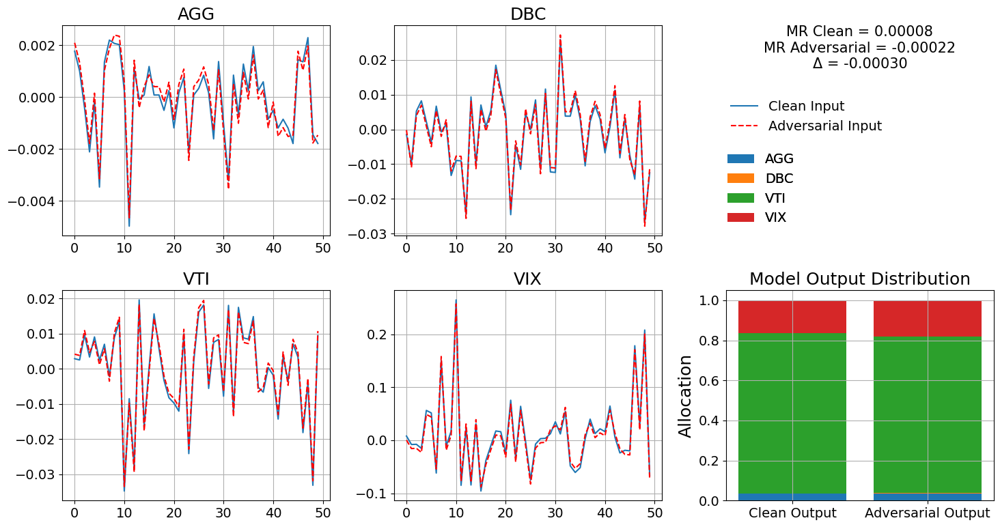

In [69]:

for MR_ in to_df_MR: 
    for Alloc_ in to_df_allocation_spikes: 

        if MR_["delta"] != 0.001 or Alloc_["delta"] != 0.1:
            continue


        print(list(set(Alloc_["summary"]["safe-incomplete"]).intersection(MR_["summary"]["unsafe-pgd"])))



        for i in list(set(Alloc_["summary"]["safe-incomplete"]).intersection(MR_["summary"]["unsafe-pgd"])):


        
            adv_X = torch.tensor(MR_["adv_X"][MR_["summary"]["unsafe-pgd"].index(i)]).reshape(50,4)

          
            
            o_X = X_test_tensor[::5][i]
            y = y_test_tensor[::5][i]

            print(adv_X - o_X)

            

            # print(adv_X.unsqueeze(0).shape)

            t1 = o_X.unsqueeze(0).to(device)
            t2 = adv_X.unsqueeze(0).to(device)

            # print(torch.max(torch.abs(o_X -adv_X)))



            w1 =model(t1).detach().cpu()
            w2 =model(t2).detach().cpu()

            MR_delta = (y.mean(0)*w1).mean() - (y.mean(0)*w2).mean()

          

            if True:

                print("Before", (y.mean(0)*w1).mean().item())
                print("After",  (y.mean(0)*w2).mean())
                # break

       

                adv_X = destandardize(adv_X.unsqueeze(1), saved_mean, saved_std).squeeze(1)
                o_X = destandardize(o_X.unsqueeze(1), saved_mean, saved_std).squeeze(1)


                categories = asset_names
                colors = ['C0', 'C1', 'C2', 'C4']
                before = w1.numpy()[0]# np.array([0.6, 0.3, 0.1])
                after = w2.numpy()[0] # np.array([0.4, 0.4, 0.2])


                # asset_names = ['Asset A', 'Asset B', 'Asset C', 'Asset D']
                categories  = asset_names
                colors      = ['C0', 'C1', 'C2', 'C3']
                # before = np.array([0.4, 0.3, 0.2, 0.1])
                # after  = np.array([0.1, 0.2, 0.3, 0.4])

                # Example MR metrics (replace with your actual MR values)
                mr_clean = (y.mean(0)*w1).mean().item()
                mr_adv   = (y.mean(0)*w2).mean().item()
                delta    = mr_adv - mr_clean

                fig = plt.figure(figsize=(15, 8))
                gs = fig.add_gridspec(2, 3, width_ratios=[1, 1, 1])

                # 2x2 line plots
                axes = [
                    fig.add_subplot(gs[0, 0]),
                    fig.add_subplot(gs[0, 1]),
                    fig.add_subplot(gs[1, 0]),
                    fig.add_subplot(gs[1, 1])
                ]

                handles = []
                for i, ax in enumerate(axes):
                    h_clean, = ax.plot(o_X[:, i], label='Clean Input')
                    h_adv,   = ax.plot(adv_X[:, i], linestyle='--', label='Adversarial Input', color='red')
                    if i == 0:
                        handles = [h_clean, h_adv]
                    ax.set_title(asset_names[i])
                    ax.grid(True)

                # Stacked bar chart in bottom-right cell only
                ax_stack = fig.add_subplot(gs[1, 2])
                bottom_before = bottom_after = 0
                bars = []
                for val_b, val_a, color in zip(before, after, colors):
                    bar_b = ax_stack.bar(0, val_b, bottom=bottom_before, color=color)
                    bar_a = ax_stack.bar(1, val_a, bottom=bottom_after, color=color)
                    bars.append(bar_b[0])
                    bottom_before += val_b
                    bottom_after  += val_a

                ax_stack.set_xticks([0, 1])
                ax_stack.set_xticklabels(['Clean Output', 'Adversarial Output'])
                ax_stack.set_ylabel('Allocation')
                ax_stack.set_title('Model Output Distribution')
                ax_stack.grid(True)

                # Dummy axis for legends and MR text in the top-right cell
                ax_leg = fig.add_subplot(gs[0, 2])
                ax_leg.axis('off')

                legend1_loc = 'upper center'           # options: 'upper left', 'upper right', etc.
                legend1_bbox = (0.3,0.7)            # (x, y) in axes fraction for line-plot legend
                legend2_loc = 'upper right'           # options similarly
                legend2_bbox = (0.3,0.45) 

                # Add MR text above legends
                textstr = f"MR Clean = {mr_clean:.5f}\nMR Adversarial = {mr_adv:.5f}\n\u0394 = {delta:.5f}"
                ax_leg.text(0.5, 1, textstr, ha='center', va='top', fontsize=15)

                # Add line-plot legend
                legend1 = ax_leg.legend(handles, ['Clean Input', 'Adversarial Input'],
                                        loc=legend1_loc, bbox_to_anchor=legend1_bbox, frameon=False)
                ax_leg.add_artist(legend1)

                # Bar-chart legend (position controlled)
                legend2 = ax_leg.legend(bars, categories,
                                        loc=legend2_loc, bbox_to_anchor=legend2_bbox, frameon=False)
                ax_leg.add_artist(legend2)

                plt.tight_layout()
                plt.show()

                break

            

In [70]:
# import matplotlib.pyplot as plt
# import numpy as np

# # Simulated data for demonstration (replace with your actual data)
# np.random.seed(0)
# adv_X = np.random.rand(100, 4)
# o_X   = np.random.rand(100, 4)
# asset_names = ['Asset A', 'Asset B', 'Asset C', 'Asset D']
# categories  = asset_names
# colors      = ['C0', 'C1', 'C2', 'C3']
# before = np.array([0.4, 0.3, 0.2, 0.1])
# after  = np.array([0.1, 0.2, 0.3, 0.4])

# # Example MR metrics (replace with your actual MR values)
# mr_clean = 0.85
# mr_adv   = 0.78
# delta    = mr_adv - mr_clean

# fig = plt.figure(figsize=(15, 8))
# gs = fig.add_gridspec(2, 3, width_ratios=[1, 1, 1])

# # 2x2 line plots
# axes = [
#     fig.add_subplot(gs[0, 0]),
#     fig.add_subplot(gs[0, 1]),
#     fig.add_subplot(gs[1, 0]),
#     fig.add_subplot(gs[1, 1])
# ]

# handles = []
# for i, ax in enumerate(axes):
#     h_clean, = ax.plot(o_X[:, i], label='Clean Input')
#     h_adv,   = ax.plot(adv_X[:, i], linestyle='--', label='Adversarial Input', color='red')
#     if i == 0:
#         handles = [h_clean, h_adv]
#     ax.set_title(asset_names[i])
#     ax.grid(True)

# # Stacked bar chart in bottom-right cell only
# ax_stack = fig.add_subplot(gs[1, 2])
# bottom_before = bottom_after = 0
# bars = []
# for val_b, val_a, color in zip(before, after, colors):
#     bar_b = ax_stack.bar(0, val_b, bottom=bottom_before, color=color)
#     bar_a = ax_stack.bar(1, val_a, bottom=bottom_after, color=color)
#     bars.append(bar_b[0])
#     bottom_before += val_b
#     bottom_after  += val_a

# ax_stack.set_xticks([0, 1])
# ax_stack.set_xticklabels(['Clean Output', 'Adversarial Output'])
# ax_stack.set_ylabel('Allocation')
# ax_stack.set_title('Model Output Distribution')
# ax_stack.grid(True)

# # Dummy axis for legends and MR text in the top-right cell
# ax_leg = fig.add_subplot(gs[0, 2])
# ax_leg.axis('off')

# legend1_loc = 'upper center'           # options: 'upper left', 'upper right', etc.
# legend1_bbox = (0.5,0.7)            # (x, y) in axes fraction for line-plot legend
# legend2_loc = 'upper right'           # options similarly
# legend2_bbox = (0.5,0.45) 

# # Add MR text above legends
# textstr = f"MR Clean = {mr_clean:.2f}\nMR Adversarial = {mr_adv:.2f}\n\u0394 = {delta:.2f}"
# ax_leg.text(0.5, 1, textstr, ha='center', va='top', fontsize=15)

# # Add line-plot legend
# legend1 = ax_leg.legend(handles, ['Clean Input', 'Adversarial Input'],
#                         loc=legend1_loc, bbox_to_anchor=legend1_bbox, frameon=False)
# ax_leg.add_artist(legend1)

# # Bar-chart legend (position controlled)
# legend2 = ax_leg.legend(bars, categories, title='Classes',
#                         loc=legend2_loc, bbox_to_anchor=legend2_bbox, frameon=False)
# ax_leg.add_artist(legend2)

# plt.tight_layout()
# plt.show()


In [71]:
# import matplotlib.pyplot as plt
# import numpy as np

# # Simulated line-plot data (replace with your actual adv_X and o_X)
# np.random.seed(0)
# adv_X = np.random.rand(100, 4)
# o_X = np.random.rand(100, 4)

# # Example probability distributions (replace with your actual vectors)
# categories = ['Class A', 'Class B', 'Class C']
# before = np.array([0.6, 0.3, 0.1])
# after = np.array([0.4, 0.4, 0.2])

# # Create figure with GridSpec: 2 rows, 3 columns
# fig = plt.figure(figsize=(15, 8))
# gs = fig.add_gridspec(2, 3, width_ratios=[1, 1, 1])

# # First four axes for the line plots
# axes = [
#     fig.add_subplot(gs[0, 0]),
#     fig.add_subplot(gs[0, 1]),
#     fig.add_subplot(gs[1, 0]),
#     fig.add_subplot(gs[1, 1])
# ]

# for i, ax in enumerate(axes):
#     ax.plot(adv_X[:, i], label='Tensor 1')
#     ax.plot(o_X[:, i], label='Tensor 2')
#     ax.set_title(f'Dimension {i}')
#     ax.legend()
#     ax.grid(True)

# # Stacked bar chart on the right spanning both rows
# ax_stack = fig.add_subplot(gs[:, 2])
# bottom_b, bottom_a = 0, 0
# bars = []
# for val_b, val_a, cat in zip(before, after, categories):
#     bar_b = ax_stack.bar(0, val_b, bottom=bottom_b)
#     bar_a = ax_stack.bar(1, val_a, bottom=bottom_a)
#     bars.append(bar_b[0])
#     bottom_b += val_b
#     bottom_a += val_a

# ax_stack.set_xticks([0, 1])
# ax_stack.set_xticklabels(['Before Attack', 'After Attack'])
# ax_stack.set_ylabel('Probability')
# ax_stack.set_title('Model Output Distribution')
# ax_stack.legend(bars, categories, title='Classes')
# ax_stack.grid(True)

# plt.tight_layout()
# plt.show()


# Robustify larger model

In [72]:
# x = X_train_tensor[:3].to(device)
# y = y_test_tensor[:3].to(device)


# model = LSTM_Unrolled(4,8,1,4).to(device)



In [73]:
def pgd_attack(model, x_init, y, eps, loss_fn, n_steps=20, step_size=0.1, device='cuda:0'):
    model.eval()
    x0 = x_init.to(device)
    y0 = y.to(device)
    eps = eps.to(device) if torch.is_tensor(eps) else eps

    # start from the clean example, one tensor that always requires grad
    adv = x0.clone().detach().requires_grad_(True)
    best_loss = torch.full((x0.size(0),), -float('inf'), device=device)
    with torch.enable_grad():
        for _ in range(n_steps):
            # zero the gradient from the previous step
            if adv.grad is not None:
                adv.grad.zero_()
            # forward + objective (we do -loss because we want the *worst* point)
            logits = model(adv)
            obj = -loss_fn(logits, y0)            # this must be a Tensor, not a float

            # keep the best‐so‐far point per example
            mask = (obj >= best_loss).view(-1, *([1] * (adv.dim()-1)))
            best_loss = torch.where(obj >= best_loss, obj.detach(), best_loss)
            # you can store best‐so‐far inputs if needed, same pattern

            # compute gradient w.r.t. adv
            obj.sum().backward()                  # builds d(obj)/d(adv)
            # PGD step: modify adv.data in‐place, then clamp
            adv.data = (adv.data + step_size * adv.grad.data.sign())
            adv.data = adv.data.clamp(x0 - eps, x0 + eps)

    # at the end, adv contains your adversarial examples
    return adv.detach()


def pgd_attack_loss(x, y):
    x = x.unsqueeze(1).repeat(1, horizon, 1)   
    loss = (x * y).sum(dim=2).mean(1)
    return loss

# w  = model(x).unsqueeze(1).repeat(1, horizon, 1)   
# loss = (w * y).sum(dim=2)
# y = model(x)
# eps_vector = torch.tensor([0.1,0.1,0.1,0.1]).to(device)

# model.eval()
# aw = model(pgd_attack(model, x, y, 0.1, pgd_attack_loss, n_steps=10))
# model.train()

### Test speed-up

In [74]:
import torch
import torch.nn as nn
import torch.optim as optim


def pgd_attack_loss(allocations, returns):
    """
    Compute negative mean return over the horizon: used for adversarial attack.
    allocations: (B, N_assets)
    returns: (B, horizon, N_assets)
    """
    horizon = returns.size(1)
    alloc_expanded = allocations.unsqueeze(1).repeat(1, horizon, 1)
    per_step = (alloc_expanded * returns).sum(dim=2)  # (B, horizon)
    mean_return = per_step.mean(dim=1)               # (B,)
    return -mean_return


def pgd_attack(model, X, returns, epsilon=0.3, alpha=0.01, num_iter=40, device='cuda'):
    """
    Projected Gradient Descent to maximize mean return (minimize negative mean).
    """
    model.eval()
    X_adv = X.detach().clone().to(device)
    X_orig = X_adv.clone()
    returns = returns.to(device)

    # random restart within epsilon-ball
    X_adv = X_adv + torch.empty_like(X_adv).uniform_(-epsilon, epsilon)
    X_adv = torch.clamp(X_adv, 0.0, 1.0)

    for _ in range(num_iter):
        X_adv.requires_grad_()
        alloc = model(X_adv)
        loss = pgd_attack_loss(alloc, returns).mean()

        model.zero_grad()
        loss.backward()
        grad = X_adv.grad.data

        # ascent step
        X_adv = X_adv.detach() + alpha * torch.sign(grad)
        # project back
        delta = torch.clamp(X_adv - X_orig, -epsilon, epsilon)
        X_adv = torch.clamp(X_orig + delta, 0.0, 1.0).detach()

    model.train()
    return X_adv


def train_adversarial(model, train_loader, val_loader=None, device='cuda',
                      lr=1e-3, weight_decay=1e-5,
                      epochs=10, epsilon=0.3, pgd_alpha=0.01,
                      pgd_iters=40, alpha_mix=0.5, beta=0.1):
    """
    Adversarial training with mixed clean/adv returns and variance regularizer.

    Args:
        model: nn.Module
        train_loader: DataLoader yielding (X, returns)
        val_loader: optional DataLoader for validation
        device: 'cuda' or 'cpu'
        lr: learning rate for Adam
        weight_decay: L2 regularization
        alpha_mix: weight for adversarial returns (0<=alpha_mix<=1)
        beta: variance penalty coefficient
        pgd_alpha: step size for PGD
    """
    model.to(device)
    optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)

    for epoch in range(1, epochs+1):
        model.train()
        train_mu, train_mu_a, train_sigma = 0.0, 0.0, 0.0

        for X, returns in train_loader:
            X, returns = X.to(device), returns.to(device)

            # adversarial example
            X_adv = pgd_attack(model, X, returns,
                               epsilon=epsilon, alpha=pgd_alpha,
                               num_iter=pgd_iters, device=device)

            # allocations
            alloc_clean = model(X)
            alloc_adv   = model(X_adv)
            horizon = returns.size(1)

            # compute return trajectories
            r_clean = (alloc_clean.unsqueeze(1).repeat(1, horizon, 1) * returns).sum(dim=2)
            r_adv   = (alloc_adv.unsqueeze(1).repeat(1, horizon, 1) * returns).sum(dim=2)

            mu    = r_clean.mean(dim=1)
            mu_a  = r_adv.mean(dim=1)
            sigma = r_clean.std(dim=1, unbiased=False)

            # mixed objective: maximize mixed => minimize negative
            mixed = mu * (1 - alpha_mix) + alpha_mix * mu_a - beta * sigma
            loss = - mixed.mean()

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            train_mu   += mu.mean().item()
            train_mu_a += mu_a.mean().item()
            train_sigma+= sigma.mean().item()

        n_train = len(train_loader)
        print(f"Epoch {epoch:2d} TRAIN | μ={train_mu/n_train:.4f} | μa={train_mu_a/n_train:.4f} | σ={train_sigma/n_train:.4f}")

        if val_loader is not None:
            model.eval()
            val_mu, val_mu_a, val_sigma = 0.0, 0.0, 0.0
            with torch.no_grad():
                for Xv, returns_v in val_loader:
                    Xv, returns_v = Xv.to(device), returns_v.to(device)
                    alloc_c = model(Xv)
                    # no adv attack on val to save compute, or could reuse pgd_attack
                    r_c = (alloc_c.unsqueeze(1).repeat(1, horizon, 1) * returns_v).sum(dim=2)
                    mu_v = r_c.mean(dim=1)
                    sigma_v = r_c.std(dim=1, unbiased=False)
                    val_mu   += mu_v.mean().item()
                    val_sigma+= sigma_v.mean().item()
                n_val = len(val_loader)
                print(f"Epoch {epoch:2d} VAL   | μ={val_mu/n_val:.4f} | σ={val_sigma/n_val:.4f}")

    print('Adversarial training complete.')


# test = dataset_fn({"jitter": 1.5})
# set_seed(10)
# model = LSTM_Unrolled().to(device)
# train_adversarial(model, dataset_fn({"jitter": 1.5})[0], dataset_fn({"jitter": 1.5})[1], alpha_mix=0.25, pgd_iters=30, epochs=60)


In [75]:
# import torch
# import torch.nn as nn
# import torch.optim as optim


# def pgd_attack_loss(allocations, returns):
#     """
#     Compute negative mean return over the horizon: used for adversarial attack.
#     allocations: (B, N_assets)
#     returns: (B, horizon, N_assets)
#     """
#     horizon = returns.size(1)
#     alloc_expanded = allocations.unsqueeze(1).repeat(1, horizon, 1)
#     per_step = (alloc_expanded * returns).sum(dim=2)  # (B, horizon)
#     mean_return = per_step.mean(dim=1)               # (B,)
#     return -mean_return


# def pgd_attack(model, X, returns, epsilon=0.05, alpha=0.2, num_iter=20, device='cuda'):
#     """
#     PGD to find worst-case (lowest mean) return adversarial perturbation.
#     Assumes inputs X are standardized (zero mean, unit variance) 
#     and so does not clamp to [0,1], only enforces epsilon-ball in feature space.
#     """
#     was_training = model.training
#     model.eval()

#     X_adv = X.detach().clone().to(device)
#     X_orig = X_adv.clone()
#     returns = returns.to(device)

#     # random initialization within epsilon-ball
#     X_adv = X_orig + torch.empty_like(X_orig).uniform_(-epsilon, epsilon)

#     for _ in range(num_iter):
#         with torch.enable_grad():
#             X_adv.requires_grad_()
#             alloc = model(X_adv)
#             loss = pgd_attack_loss(alloc, returns).mean()
#             grad = torch.autograd.grad(loss, X_adv)[0]

#         # ascent step
#         X_adv = X_adv.detach() + alpha * torch.sign(grad)
#         # project back into epsilon-ball around original X
#         delta = torch.clamp(X_adv - X_orig, -epsilon, epsilon)
#         X_adv = (X_orig + delta).detach()

#     if was_training:
#         model.train()
#     else:
#         model.eval()
#     return X_adv


# def pgd_loss_fn_fn(params):
#     """
#     Returns a loss function for adversarial robustness using PGD with warmup for alpha_mix.
#     Designed for standardized inputs (zero mean, unit variance).
#     Expects params:
#       epsilon (default=0.05), pgd_alpha (default=0.1), pgd_iters (default=20),
#       alpha_mix (default=0.5), beta (default=0.1), warmup (default=10)
#     """
#     epsilon   = params.get("epsilon",   0.01)
#     pgd_alpha = params.get("pgd_alpha", 0.1)
#     pgd_iters = params.get("pgd_iters", 20)
#     alpha_mix = params.get("alpha_mix", 0.25)
#     beta      = params.get("beta",      0.1)
#     warmup    = params.get("warmup",    20)

#     def loss_fn(x, returns, model, epoch, bounded_model):
#         # compute scheduled mix weight

#         current_mix = alpha_mix * min(epoch, warmup) / warmup
#         # print(alpha_mix, min(epoch, warmup), epoch)

#         # adversarial example under standardized feature scale
#         X_adv = pgd_attack(model, x, returns,
#                             epsilon=epsilon, alpha=pgd_alpha,
#                             num_iter=pgd_iters, device=x.device)
#         # forward passes
#         alloc_clean = model(x)
#         alloc_adv   = model(X_adv)
#         horizon = returns.size(1)

#         # compute return trajectories
#         r_clean = (alloc_clean.unsqueeze(1).repeat(1, horizon, 1) * returns).sum(dim=2)
#         r_adv   = (alloc_adv.unsqueeze(1).repeat(1, horizon, 1) * returns).sum(dim=2)

#         # statistics
#         mu    = r_clean.mean(dim=1)
#         mu_a  = r_adv.mean(dim=1)
#         sigma = r_clean.std(dim=1, unbiased=False)

#         # mixed objective: increase adversarial weight gradually
#         mixed = mu * (1 - current_mix) + current_mix * mu_a - beta * sigma
#         loss = - mixed.mean()

#         extra = {
#             "mu":        mu.mean().item(),
#             "mu_a":      mu_a.mean().item(),
#             # "sigma":     sigma.mean().item(),
#             # "alpha_mix": current_mix
#         }
#         return loss, extra

#     return loss_fn


In [76]:

def pgd_ibp_loss_fn_fn(params):
    """
    Loss combining natural (with variance penalty) and robust (IBP+PGD) objectives.

    Params:
      # Natural part
      alpha (true_alpha, default=0.5), warmup (default=10), beta (variance coef, default=0.1),
      # Robust IBP/PGD mix
      ibp_eps (default=0.05), ibp_method (default='backward'), ibp_weight (γ, default=0.5),
      pgd_eps (default=0.05), pgd_alpha (default=0.1), pgd_iters (default=20),
      # Combination weight
      robust_loss_weight (ρ, default=0.5)
    """
    # true_alpha         = params.get('alpha',    0.5)
    warmup             = params.get('warmup',   20)
    beta               = params.get('beta',     0.1)
    ibp_eps            = params.get('robust_eps',   None)
    pgd_eps =ibp_eps
    ibp_method         = params.get('ibp_method',  'IBP')
    ibp_weight         = params.get('ibp_weight',   None)
    # pgd_eps            = params.get('pgd_eps',    0.05)
    pgd_alpha          = params.get('pgd_alpha',  0.2)
    pgd_iters          = params.get('pgd_iters',  8)
    this_robust_loss_weight = params.get('alpha', None)

    def loss_fn(x, returns, model, epoch, bounded_model):
        B, horizon, _ = returns.shape
        # Natural allocations & stats
        alloc_n = model(x)
        r_n     = (alloc_n.unsqueeze(1).repeat(1, horizon, 1) * returns).sum(dim=2)
        natural_mean    = r_n.mean(dim=1)
        natural_std     = r_n.std(dim=1, unbiased=False)
        # natural loss includes variance penalty
        # natural_loss = -(natural_mean - beta * natural_std).mean()

        extras = {
            'natural_mean': natural_mean.mean().item(),
            'natural_std':  natural_std.mean().item(),
            # 'natural_loss': natunatural_meanral_loss.item()
        }

        # mv = μ * (1-alpha) + alpha * wr - β * σ

        # if no robustness, skip
        if this_robust_loss_weight == 0:
            extras['robust_weight'] = 0.0

            # mv = μ * (1-alpha) + alpha * wr - β * σ

            loss = natural_mean - beta * natural_std
            return -loss.mean(), extras

        extras['robust_weight'] = this_robust_loss_weight

        # warmup mix for natural vs robust
        robust_loss_weight = this_robust_loss_weight * min(epoch, warmup) / warmup
        extras['robust_loss_weight'] = robust_loss_weight

        # IBP component
        if ibp_weight > 0:
            perturb = PerturbationLpNorm(norm=np.inf, eps=ibp_eps)
            x_bnd   = BoundedTensor(x, perturb)
            ub, lb  = bounded_model.compute_bounds(x=(x_bnd,), method=ibp_method)
            ub = ub.unsqueeze(1).repeat(1, horizon, 1)
            lb = lb.unsqueeze(1).repeat(1, horizon, 1)
            wr_steps = torch.min(returns * lb, returns * ub).sum(dim=2)
            ibp_mean = wr_steps.mean(dim=1)
            extras['ibp_mean'] = ibp_mean.mean().item()
        else:
            ibp_mean = torch.zeros_like(natural_mean)
            extras['ibp_mean'] = 0.0

        # PGD component
        if ibp_weight < 1:
            X_adv = pgd_attack(model, x, returns,
                               epsilon=pgd_eps, alpha=pgd_alpha,
                               num_iter=pgd_iters, device=x.device)
            alloc_p = model(X_adv)
            r_p     = (alloc_p.unsqueeze(1).repeat(1, horizon, 1) * returns).sum(dim=2)
            pgd_mean  = r_p.mean(dim=1)
            extras['pgd_mean'] = pgd_mean.mean().item()
        else:
            pgd_mean = torch.zeros_like(natural_mean)
            extras['pgd_mean'] = 0.0

        # mix IBP & PGD
        robust_mean = ibp_weight * ibp_mean + (1 - ibp_weight) * pgd_mean
        extras['robust_mean'] = robust_mean.mean().item()

        # robust loss (no variance term)
        robust_loss = - robust_mean.mean()
        # extras['robust_loss'] = robust_loss.item()

        # final combined
        loss = (1 - robust_loss_weight) * natural_mean + robust_loss_weight * robust_mean - beta * natural_std
        return -loss.mean(), extras

    return loss_fn

<!-- # Attempt Robustify LSTM -->

In [77]:


# def dataset_fn(params):
#     jitter = Jitter(sigma=params.get("jitter", 0.025))
#     print(jitter)
#     train_dataset = AugmentedTimeSeriesDataset(X_train_tensor, y_train_tensor, transform=jitter)
#     val_dataset = TensorDataset(X_val_tensor, y_val_tensor)

#     train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
#     val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
#     return train_loader, val_loader


# experiment_path = "alpha-beta-CROWN/complete_verifier/trained_models"
# experiments = get_experiment_model(lambda x: FinalCNN().to(device), experiment_path, params_grids, robust_loss_fn_fn, dataset_fn, device=device)

# for model_name, experiment in experiments.items():
#     model = experiment["model"]
   
#     experiment["results"]["val"] = run_experiment(model, (X_val_tensor, y_val_tensor[:, 0:1, :].squeeze(1)), experiment)
#     experiment["results"]["test"] = run_experiment(model, (X_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1)), experiment)


In [78]:
# os.path.exists("alpha-beta-CROWN/complete_verifier/trained_models/seed=11,epochs=60,lambda_entropy=0.0,model=CNN,learning_rate=0.001,loss=PGD-IBP,jitter=1.5,weight_decay=1e-05,robust_eps=0.01,alpha=0.25,ibp_weight=0,warmup=20,checkpoint=60.pth")

### PGD-IBP CNN

In [79]:

# PGD_IBP_params_grids = [
# {
#     "seed": [10],
#     "epochs": [60],
#     "lambda_entropy": [0.000],#, 0.4],#, 0.0025],#[0.0001, 0.001, 0.01, 0.025, 0.05, 0.1],
#     "model": ["CNN"],
#     "learning_rate": [0.001],
#     "loss": ["Standard"],
#     "jitter" : [1.5],
#     "weight_decay": [1e-5],
# },
# ]

PGD_IBP_params_grids = [
     {
    "seed": [10],
    "epochs": [60],
    "lambda_entropy": [0.000],#, 0.4],#, 0.0025],#[0.0001, 0.001, 0.01, 0.025, 0.05, 0.1],warmup
    "model": ["CNN"],
    "learning_rate": [0.001],
    "loss": ["CROWN-IBP"],
    "jitter" : [1.5],
    "weight_decay": [1e-5],
    "robust_eps": [0.01],
    "alpha": [0.25],
    "warmup": [20]
},
# PGD_IBP_params_grids = [
# {
#     "seed": [10],
#     "epochs": [60],
#     "lambda_entropy": [0.000],#, 0.4],#, 0.0025],#[0.0001, 0.001, 0.01, 0.025, 0.05, 0.1],
#     "model": ["CNN"],
#     "learning_rate": [0.001],
#     "loss": ["Standard"],
#     "jitter" : [1.5],
#     "weight_decay": [1e-5],
# },
]



def dataset_fn(params):
    jitter = Jitter(sigma=params.get("jitter", 0.025))
    print(jitter)
    train_dataset = AugmentedTimeSeriesDataset(X_train_tensor, y_train_tensor, transform=jitter)
    val_dataset = TensorDataset(X_val_tensor, y_val_tensor)

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
    return train_loader, val_loader


def switch(params):
    if params["loss"] == "PGD-IBP":
        print("PGD_loss")
        return pgd_ibp_loss_fn_fn(params)
    return robust_loss_fn_fn(params)

experiment_path = "alpha-beta-CROWN/complete_verifier/trained_models"
experiments = get_experiment_model(standard_model_fn, experiment_path, PGD_IBP_params_grids, switch, dataset_fn, device=device)

for model_name, experiment in experiments.items():
    model = experiment["model"]
   
    experiment["results"]["val"] = run_experiment(model, (X_val_tensor, y_val_tensor[:, 0:1, :].squeeze(1)), experiment)
    experiment["results"]["test"] = run_experiment(model, (X_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1)), experiment)

# model = experiments[""]
bounded_model = get_bounded_model2(model)

HERE
{60: 'alpha-beta-CROWN/complete_verifier/trained_models/seed=10,epochs=60,lambda_entropy=0.0,model=CNN,learning_rate=0.001,loss=CROWN-IBP,jitter=1.5,weight_decay=1e-05,robust_eps=0.01,alpha=0.25,warmup=20,checkpoint=60.pth'}
None
[True]
['alpha-beta-CROWN/complete_verifier/trained_models/seed=10,epochs=60,lambda_entropy=0.0,model=CNN,learning_rate=0.001,loss=CROWN-IBP,jitter=1.5,weight_decay=1e-05,robust_eps=0.01,alpha=0.25,warmup=20,checkpoint=60.pth']
Loading alpha-beta-CROWN/complete_verifier/trained_models/seed=10,epochs=60,lambda_entropy=0.0,model=CNN,learning_rate=0.001,loss=CROWN-IBP,jitter=1.5,weight_decay=1e-05,robust_eps=0.01,alpha=0.25,warmup=20,checkpoint=60.pth
Dropout operation CANNOT be parsed during conversion when the model is in eval() mode!
Set model to train() mode!


In [80]:
def pgd_ibp_loss_fn_fn(params):
    """
    Loss combining natural (with variance penalty) and robust (IBP+PGD) objectives.

    Params:
      # Natural part
      alpha (true_alpha, default=0.5), warmup (default=10), beta (variance coef, default=0.1),
      # Robust IBP/PGD mix
      ibp_eps (default=0.05), ibp_method (default='backward'), ibp_weight (γ, default=0.5),
      pgd_eps (default=0.05), pgd_alpha (default=0.1), pgd_iters (default=20),
      # Combination weight
      robust_loss_weight (ρ, default=0.5)
    """
    # true_alpha         = params.get('alpha',    0.5)
    warmup             = params.get('warmup',   20)
    beta               = params.get('beta',     0.1)
    ibp_eps            = params.get('robust_eps',   None)
    pgd_eps =ibp_eps

    print("ibp_eps", ibp_eps)
    print("pgd_eps", pgd_eps)
    ibp_method         = params.get('ibp_method',  'IBP')
    ibp_weight         = params.get('ibp_weight',   None)
    # pgd_eps            = params.get('pgd_eps',    0.05)
    pgd_alpha          = params.get('pgd_alpha',  0.2)
    pgd_iters          = params.get('pgd_iters',  8)
    this_robust_loss_weight = params.get('alpha', None)

    def loss_fn(x, returns, model, epoch, bounded_model):
        B, horizon, _ = returns.shape
        # Natural allocations & stats
        alloc_n = model(x)
        r_n     = (alloc_n.unsqueeze(1).repeat(1, horizon, 1) * returns).sum(dim=2)
        natural_mean    = r_n.mean(dim=1)
        natural_std     = r_n.std(dim=1, unbiased=False)
        # natural loss includes variance penalty
        # natural_loss = -(natural_mean - beta * natural_std).mean()

        extras = {
            'natural_mean': natural_mean.mean().item(),
            'natural_std':  natural_std.mean().item(),
            # 'natural_loss': natunatural_meanral_loss.item()
        }

        # mv = μ * (1-alpha) + alpha * wr - β * σ

        # if no robustness, skip
        if this_robust_loss_weight == 0:
            extras['robust_weight'] = 0.0

            # mv = μ * (1-alpha) + alpha * wr - β * σ

            loss = natural_mean - beta * natural_std
            return -loss.mean(), extras

        extras['robust_weight'] = this_robust_loss_weight

        # warmup mix for natural vs robust
        robust_loss_weight = this_robust_loss_weight * min(epoch, warmup) / warmup
        extras['robust_loss_weight'] = robust_loss_weight

        # IBP component
        if ibp_weight > 0:
            perturb = PerturbationLpNorm(norm=np.inf, eps=ibp_eps)
            x_bnd   = BoundedTensor(x, perturb)
            ub, lb  = bounded_model.compute_bounds(x=(x_bnd,), method=ibp_method)
            ub = ub.unsqueeze(1).repeat(1, horizon, 1)
            lb = lb.unsqueeze(1).repeat(1, horizon, 1)
            wr_steps = torch.min(returns * lb, returns * ub).sum(dim=2)
            ibp_mean = wr_steps.mean(dim=1)
            extras['ibp_mean'] = ibp_mean.mean().item()
        else:
            ibp_mean = torch.zeros_like(natural_mean)
            extras['ibp_mean'] = 0.0

        # PGD component
        if ibp_weight < 1:
            X_adv = pgd_attack(model, x, returns,
                               epsilon=pgd_eps, alpha=pgd_alpha,
                               num_iter=pgd_iters, device=x.device)
            alloc_p = model(X_adv)
            r_p     = (alloc_p.unsqueeze(1).repeat(1, horizon, 1) * returns).sum(dim=2)
            pgd_mean  = r_p.mean(dim=1)
            extras['pgd_mean'] = pgd_mean.mean().item()
        else:
            pgd_mean = torch.zeros_like(natural_mean)
            extras['pgd_mean'] = 0.0

        # mix IBP & PGD
        robust_mean = ibp_weight * ibp_mean + (1 - ibp_weight) * pgd_mean
        extras['robust_mean'] = robust_mean.mean().item()

        # robust loss (no variance term)
        robust_loss = - robust_mean.mean()
        # extras['robust_loss'] = robust_loss.item()

        # final combined
        loss = (1 - robust_loss_weight) * natural_mean + robust_loss_weight * robust_mean - beta * natural_std
        return -loss.mean(), extras

    return loss_fn

x = X_test_tensor.to(device)
returns = y_test_tensor.to(device)




# alloc_n = model(x)
# r_n     = (alloc_n.unsqueeze(1).repeat(1, horizon, 1) * returns).sum(dim=2)
# natural_mean  = r_n.mean(dim=1)

# natural_mean.mean()


# perturb = PerturbationLpNorm(norm=np.inf, eps=0.1)
# x_bnd   = BoundedTensor(x, perturb)
# ub, lb  = bounded_model.compute_bounds(x=(x_bnd,), method="IBP")
# ub = ub.unsqueeze(1).repeat(1, horizon, 1)
# lb = lb.unsqueeze(1).repeat(1, horizon, 1)
# wr_steps = torch.min(returns * lb, returns * ub).sum(dim=2)
# ibp_mean = wr_steps.mean(dim=1)

# X_adv = pgd_attack(model, x, returns,
#                                epsilon=1, alpha=0.1,
#                                num_iter=100, device=x.device)
# alloc_p = model(X_adv)
# r_p     = (alloc_p.unsqueeze(1).repeat(1, horizon, 1) * returns).sum(dim=2)
# pgd_mean  = r_p.mean(dim=1)

# ibp_mean.mean(), natural_mean.mean(), pgd_mean.mean()

In [81]:
horizon = 5

### Compare Bound width CROWN-IBP, CROWN, IBP

In [82]:
# import numpy as np
# import matplotlib.pyplot as plt
# import torch

# # 1) build your epsilons
# # N = 10
# N = 20
# epsilons = np.geomspace(1e-6, 0.05, num=N)

# # 2) collect IBP means
# ibp_means = []
# for eps in epsilons:
#     perturb = PerturbationLpNorm(norm=np.inf, eps=eps)
#     x_bnd   = BoundedTensor(x, perturb)
#     ub, lb  = bounded_model.compute_bounds(x=(x_bnd,), method="IBP")
#     ub = ub.unsqueeze(1).repeat(1, horizon, 1)
#     lb = lb.unsqueeze(1).repeat(1, horizon, 1)
#     wr_steps = torch.min(returns * lb, returns * ub).sum(dim=2)
#     ibp_mean = wr_steps.mean(dim=1).mean().item()
#     ibp_means.append(ibp_mean)


In [83]:
# import numpy as np
# import matplotlib.pyplot as plt
# import torch

# # 1) build your epsilons
# N = 50
# epsilons = np.geomspace(1e-6, 0.015, num=N)

# # 2) collect IBP means, but stop once mean ≤ -1
# ibp_means = []
# eps_plot = []
# for eps in epsilons:
#     perturb = PerturbationLpNorm(norm=np.inf, eps=eps)
#     x_bnd   = BoundedTensor(x, perturb)
#     ub, lb  = bounded_model.compute_bounds(x=(x_bnd,), method="IBP")
#     ub = ub.unsqueeze(1).repeat(1, horizon, 1)
#     lb = lb.unsqueeze(1).repeat(1, horizon, 1)
#     wr_steps = torch.min(returns * lb, returns * ub).sum(dim=2)
#     ibp_mean = wr_steps.mean(dim=1).mean().item()
    
#     if ibp_mean > -0.1 or True:
#         eps_plot.append(eps)
#         ibp_means.append(ibp_mean)
#     else:
#         break  # all further means will also be ≤ -1, so we can stop

# # 3) plot filtered data
# plt.figure()
# plt.plot(eps_plot, ibp_means)
# plt.xlabel('ε (L∞ perturbation size)')
# plt.ylabel('Mean IBP-bound return')
# plt.title('IBP Mean vs. ε (only > -1)')


# plt.grid(True, which='both', ls='--', alpha=0.5)
# plt.tight_layout()
# plt.show()


In [84]:
horizon = 5

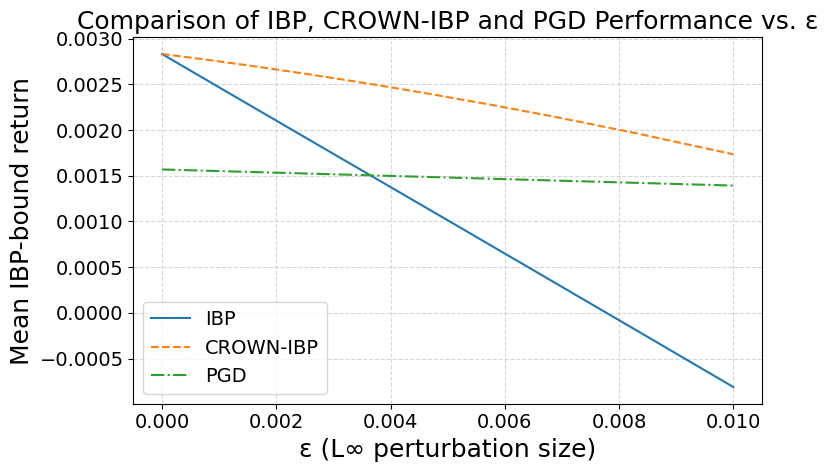

In [85]:
import numpy as np
import matplotlib.pyplot as plt
import torch

# 1) build your epsilons
N = 50
x = X_test_tensor.to(device)

epsilons = np.geomspace(1e-6, 0.01, num=N)

# 2) collect means for each method
means_ibp       = []
means_crownibp  = []
means_pgd       = []

for eps in epsilons:
    # --- IBP ---
    perturb = PerturbationLpNorm(norm=np.inf, eps=eps)
    x_bnd   = BoundedTensor(x, perturb)
    ub, lb  = bounded_model.compute_bounds(x=(x_bnd,), method="IBP")
    ub = ub.unsqueeze(1).repeat(1, horizon, 1)
    lb = lb.unsqueeze(1).repeat(1, horizon, 1)
    wr_steps = torch.min(returns * lb, returns * ub).sum(dim=2)
    means_ibp.append(wr_steps.mean(dim=1).mean().item())

    # --- CROWN-IBP ---
    perturb = PerturbationLpNorm(norm=np.inf, eps=eps)
    x_bnd   = BoundedTensor(x, perturb)
    ub, lb  = bounded_model.compute_bounds(x=(x_bnd,), method="CROWN-IBP")
    ub = ub.unsqueeze(1).repeat(1, horizon, 1)
    lb = lb.unsqueeze(1).repeat(1, horizon, 1)
    wr_steps = torch.min(returns * lb, returns * ub).sum(dim=2)
    means_crownibp.append(wr_steps.mean(dim=1).mean().item())

    # --- PGD attack ---
    X_adv   = pgd_attack(model, x, returns,
                         epsilon=eps, alpha=0.1,
                         num_iter=20, device=x.device)
    alloc_p = model(X_adv)
    r_p     = (alloc_p.unsqueeze(1)
                     .repeat(1, horizon, 1)
                     * returns).sum(dim=2)
    means_pgd.append(r_p.mean(dim=1).mean().cpu().detach().numpy())

# 3) plot all three on one figure
plt.figure(figsize=(8, 5))
plt.plot(epsilons, means_ibp,       linestyle='-', label='IBP')
plt.plot(epsilons, means_crownibp,  linestyle='--', label='CROWN-IBP')
plt.plot(epsilons, means_pgd,       linestyle='-.', label='PGD')

plt.xlabel('ε (L∞ perturbation size)')
plt.ylabel('Mean IBP-bound return')
plt.title('Comparison of IBP, CROWN-IBP and PGD Performance vs. ε')
plt.legend(loc='best')
plt.grid(True, which='both', ls='--', alpha=0.5)
plt.tight_layout()
plt.show()


In [86]:
means_crownibp[-1]

0.001735319965519011

In [87]:
N = 50
epsilons = np.linspace(1e-6, 0.2, num=N)

# 2) collect means for each method
means_ibp       = []
means_crownibp  = []
means_pgd       = []

for eps in epsilons:
    # --- IBP ---
    perturb = PerturbationLpNorm(norm=np.inf, eps=eps)
    x_bnd   = BoundedTensor(x, perturb)
    ub, lb  = bounded_model.compute_bounds(x=(x_bnd,), method="IBP")
    ub = ub.unsqueeze(1).repeat(1, horizon, 1)
    lb = lb.unsqueeze(1).repeat(1, horizon, 1)
    wr_steps = torch.min(returns * lb, returns * ub).sum(dim=2)
    means_ibp.append(wr_steps.mean(dim=1).mean().item())

    # --- CROWN-IBP ---
    perturb = PerturbationLpNorm(norm=np.inf, eps=eps)
    x_bnd   = BoundedTensor(x, perturb)
    ub, lb  = bounded_model.compute_bounds(x=(x_bnd,), method="CROWN-IBP")
    ub = ub.unsqueeze(1).repeat(1, horizon, 1)
    lb = lb.unsqueeze(1).repeat(1, horizon, 1)
    wr_steps = torch.min(returns * lb, returns * ub).sum(dim=2)
    means_crownibp.append(wr_steps.mean(dim=1).mean().item())

    # --- PGD attack ---
    X_adv   = pgd_attack(model, x, returns,
                         epsilon=eps, alpha=0.1,
                         num_iter=20, device=x.device)
    alloc_p = model(X_adv)
    r_p     = (alloc_p.unsqueeze(1)
                     .repeat(1, horizon, 1)
                     * returns).sum(dim=2)
    means_pgd.append(r_p.mean(dim=1).mean().cpu().detach().numpy())

In [88]:
# import numpy as np

# # assume you’ve already computed (over the same eps1 grid):
# #    eps1             : np.ndarray, shape (50,)
# #    means_ibp        : list or array of length 50
# #    means_crownibp   : list or array of length 50
# #    means_pgd        : list or array of length 50

# eps1           = np.array(epsilons)
# means_ibp      = np.array(means_ibp)
# means_crownibp = np.array(means_crownibp)
# means_pgd      = np.array(means_pgd)

# # 1) find the CROWN-IBP mean at ε closest to 0.1
# idx_c = np.argmin(np.abs(eps1 - 0.1))
# target_mean = means_crownibp[idx_c]
# print(f"CROWN-IBP @ ε≈{eps1[idx_c]:.4f} → mean={target_mean:.4f}")

# # 2) find the ε in IBP whose mean is closest to that target
# idx_ibp = np.argmin(np.abs(means_ibp - target_mean))
# eps_ibp_match = eps1[idx_ibp]
# print(f"IBP  match at ε≈{eps_ibp_match:.4f} → mean={means_ibp[idx_ibp]:.4f}")

# # 3) same for PGD
# idx_pgd = np.argmin(np.abs(means_pgd - target_mean))
# eps_pgd_match = eps1[idx_pgd]
# print(f"PGD  match at ε≈{eps_pgd_match:.4f} → mean={means_pgd[idx_pgd]:.4f}")


In [89]:
# pgd_means = []
# # ibp_means = []


# for eps in epsilons:
#     X_adv = pgd_attack(model, x, returns,
#                                epsilon=eps, alpha=0.01,
#                                num_iter=10, device=x.device)
#     alloc_p = model(X_adv)
#     r_p     = (alloc_p.unsqueeze(1).repeat(1, horizon, 1) * returns).sum(dim=2)
#     pgd_mean  = r_p.mean(dim=1).mean().cpu().detach().numpy()

#     pgd_means.append(pgd_mean)


In [90]:
# len(epsilons), len(crown_ibp_means)

In [91]:

# # 3) plot with y as symlog
# plt.figure()
# # plt.plot(epsilons, crown_ibp_means, label="CROWN-IBP")
# plt.plot(epsilons, pgd_means, label="PGD")
# plt.xlabel('ε (L∞ perturbation size)')
# plt.ylabel('Mean IBP-bound return')
# plt.title('IBP Mean vs. ε')
# plt.legend()

# # keep x linear (default), use symmetric log on y to handle negative and positive
# plt.xscale('symlog', linthresh=1e-2)  
# #  linthresh sets the range around zero within which the plot is linear
# plt.grid(True, which='both', ls='--', alpha=0.5)

# plt.tight_layout()
# plt.show()


In [92]:

# # 3) plot with y as symlog
# plt.figure()
# # plt.plot(epsilons, ibp_means)
# plt.plot(epsilons, pgd_means)
# plt.xlabel('ε (L∞ perturbation size)')
# plt.ylabel('Mean IBP-bound return')
# plt.title('IBP Mean vs. ε')

# # keep x linear (default), use symmetric log on y to handle negative and positive
# # plt.yscale('symlog', linthresh=1e-1)  
# #  linthresh sets the range around zero within which the plot is linear
# plt.grid(True, which='both', ls='--', alpha=0.5)

# plt.tight_layout()
# plt.show()


### PGD-IBP CNN

In [93]:

seeds = [10, 5, 6]

alphas = [0.0625, 0.1250, 0.25, 0.3750, 0.5, 0.75, 1]

CROWN_IBP_params_grids = [
    {
    "seed": [10],
    "epochs": [60, 61],
    "lambda_entropy": [0.000],#, 0.4],#, 0.0025],#[0.0001, 0.001, 0.01, 0.025, 0.05, 0.1],
    "model": ["CNN"],
    "learning_rate": [0.001],
    "loss": ["Standard"],
    "jitter" : [1.5],
    "weight_decay": [1e-5],
    # "robust_eps": [0.01],
    # "alpha": [0.25, 0.5],#, 0.75, 1],
    # "warmup": [20]
},
    {
    "seed": seeds,
    "epochs": [60],
    "lambda_entropy": [0.000],#, 0.4],#, 0.0025],#[0.0001, 0.001, 0.01, 0.025, 0.05, 0.1],warmup
    "model": ["CNN"],
    "learning_rate": [0.001],
    "loss": ["CROWN-IBP"],
    "jitter" : [1.5],
    "weight_decay": [1e-5],
    "robust_eps": [0.01],
    "alpha": [0.25],
    "warmup": [20]
},
]


PGD_IBP_params_grids = [
      {
    "seed": [10],
    "epochs": [60],
    "lambda_entropy": [0.000],#, 0.4],#, 0.0025],#[0.0001, 0.001, 0.01, 0.025, 0.05, 0.1],
    "model": ["CNN"],
    "learning_rate": [0.001],
    "loss": ["Standard"],
    "jitter" : [1.5],
    "weight_decay": [1e-5],
    # "robust_eps": [0.01],
    # "alpha": [0.25, 0.5],#, 0.75, 1],
    # "warmup": [20]
},
 {
    "seed": [10],
    "epochs": [60],
    "lambda_entropy": [0.000],#, 0.4],#, 0.0025],#[0.0001, 0.001, 0.01, 0.025, 0.05, 0.1],warmup
    "model": ["CNN"],
    "learning_rate": [0.001],
    "loss": ["CROWN-IBP"],
    "jitter" : [1.5],
    "weight_decay": [1e-5],
    "robust_eps": [0.1, 0.05, 0.01, 0.005, 0.001],
    "alpha": [0.25],
    "warmup": [20]
},
#     {
#     "seed": [10],
#     "epochs": [60],
#     "lambda_entropy": [0.000],#, 0.4],#, 0.0025],#[0.0001, 0.001, 0.01, 0.025, 0.05, 0.1],
#     "model": ["CNN"],
#     "learning_rate": [0.001],
#     "loss": ["PGD-IBP"],
#     "jitter" : [1.5],
#     "weight_decay": [1e-5],
#     "robust_eps": [0.1, 0.05, 0.01, 0.005, 0.001],
#     "alpha": [0.25],
#     "ibp_weight": [0, 0.25, 0.5, 0.75, 1],
#     "warmup": [20],
# }
 {
    "seed": [55,56,57],
    "epochs": [60],
    "lambda_entropy": [0.000],#, 0.4],#, 0.0025],#[0.0001, 0.001, 0.01, 0.025, 0.05, 0.1],
    "model": ["CNN"],
    "learning_rate": [0.001],
    "loss": ["PGD-IBP"],
    "jitter" : [1.5],
    "weight_decay": [1e-5],
    "robust_eps": [0.01],
    "alpha": [0.25],
    "ibp_weight": [0.5],
    "warmup": [20],
}
]


PGD_IBP_params_grids = [

      {
    "seed": [10],
    "epochs": [60],
    "lambda_entropy": [0.000],#, 0.4],#, 0.0025],#[0.0001, 0.001, 0.01, 0.025, 0.05, 0.1],
    "model": ["CNN"],
    "learning_rate": [0.001],
    "loss": ["Standard"],
    "jitter" : [1.5],
    "weight_decay": [1e-5],
    # "robust_eps": [0.01],
    # "alpha": [0.25, 0.5],#, 0.75, 1],
    # "warmup": [20]
},
 {
    "seed": [10],
    "epochs": [60],
    "lambda_entropy": [0.000],#, 0.4],#, 0.0025],#[0.0001, 0.001, 0.01, 0.025, 0.05, 0.1],
    "model": ["CNN"],
    "learning_rate": [0.001],
    "loss": ["PGD-IBP"],
    "jitter" : [1.5],
    "weight_decay": [1e-5],
    "robust_eps": [0.005, 0.0075, 0.01],
    "alpha": [0.25],
    "ibp_weight": [1],
    "warmup": [20],
}
]

PGD_IBP_params_grids = [
        {
    "seed": [11, 6,5],
    "epochs": [60],
    "lambda_entropy": [0.000],#, 0.4],#, 0.0025],#[0.0001, 0.001, 0.01, 0.025, 0.05, 0.1],
    "model": ["CNN"],
    "learning_rate": [0.001],
    "loss": ["PGD-IBP"],
    "jitter" : [1.5],
    "weight_decay": [1e-5],
    "robust_eps": [0.01],
    "alpha": [0.25],
    "ibp_weight": [0, 0.25, 0.5, 0.75, 1],
    "warmup": [20],
},
]



def dataset_fn(params):
    jitter = Jitter(sigma=params.get("jitter", 0.025))
    print(jitter)
    train_dataset = AugmentedTimeSeriesDataset(X_train_tensor, y_train_tensor, transform=jitter)
    val_dataset = TensorDataset(X_val_tensor, y_val_tensor)

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
    return train_loader, val_loader


def switch(params):
    if params["loss"] == "PGD-IBP":
        print("PGD_loss")
        return pgd_ibp_loss_fn_fn(params)
    return robust_loss_fn_fn(params)

experiment_path = "alpha-beta-CROWN/complete_verifier/trained_models"
experiments = get_experiment_model(standard_model_fn, experiment_path, PGD_IBP_params_grids, switch, dataset_fn, device=device)

for model_name, experiment in experiments.items():
    model = experiment["model"]
   
    experiment["results"]["val"] = run_experiment(model, (X_val_tensor, y_val_tensor[:, 0:1, :].squeeze(1)), experiment)
    experiment["results"]["test"] = run_experiment(model, (X_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1)), experiment)


HERE
{60: 'alpha-beta-CROWN/complete_verifier/trained_models/seed=11,epochs=60,lambda_entropy=0.0,model=CNN,learning_rate=0.001,loss=PGD-IBP,jitter=1.5,weight_decay=1e-05,robust_eps=0.01,alpha=0.25,ibp_weight=0,warmup=20,checkpoint=60.pth'}
None
[True]
['alpha-beta-CROWN/complete_verifier/trained_models/seed=11,epochs=60,lambda_entropy=0.0,model=CNN,learning_rate=0.001,loss=PGD-IBP,jitter=1.5,weight_decay=1e-05,robust_eps=0.01,alpha=0.25,ibp_weight=0,warmup=20,checkpoint=60.pth']
Loading alpha-beta-CROWN/complete_verifier/trained_models/seed=11,epochs=60,lambda_entropy=0.0,model=CNN,learning_rate=0.001,loss=PGD-IBP,jitter=1.5,weight_decay=1e-05,robust_eps=0.01,alpha=0.25,ibp_weight=0,warmup=20,checkpoint=60.pth
HERE
{60: 'alpha-beta-CROWN/complete_verifier/trained_models/seed=11,epochs=60,lambda_entropy=0.0,model=CNN,learning_rate=0.001,loss=PGD-IBP,jitter=1.5,weight_decay=1e-05,robust_eps=0.01,alpha=0.25,ibp_weight=0.25,warmup=20,checkpoint=60.pth'}
None
[True]
['alpha-beta-CROWN/comp

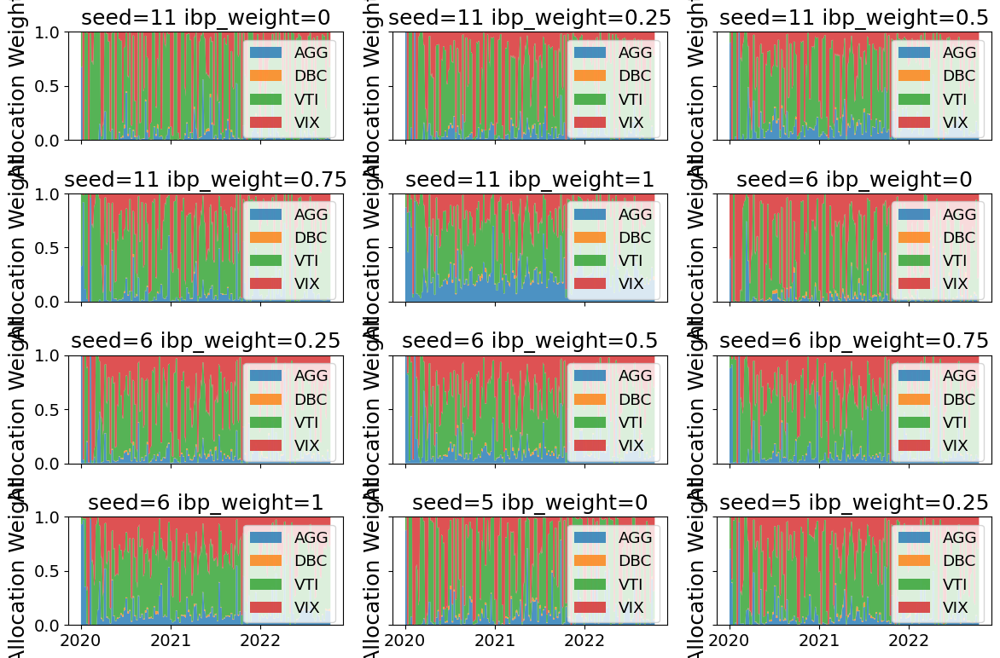

In [94]:
# robust_weights = { e["params"]["seed"]: e["results"]["test"]["raw"]["weights"] for ek,e in experiments.items()}
# robust_weights = {"Standard (Train ε=0)": standard_experiment["results"]["test"]["raw"]["weights"]}
# for eps in [0.001, 0.01, 0.015]:
#    robust_weights[ f'Robust (Train ε={eps})'] = robust_weights_[eps]
robust_weights = { ek: e["results"]["test"]["raw"]["weights"] for ek,e in experiments.items() }


weights_dict = robust_weights


asset_labels = asset_names
time_points = test_indices[:-55]  # 1 to 151 periods


fig, axes = plt.subplots(4, 3, figsize=(12, 8), sharex=True, sharey=True)
axes = axes.flatten()


for ax, (label, weights) in zip(axes, weights_dict.items()):
   # Create a stackplot: weights[:,0], weights[:,1], weights[:,2], weights[:,3]
   ax.stackplot(time_points,
                weights[:, 0],
                weights[:, 1],
                weights[:, 2],
           weights[:, 3],
                labels=asset_labels,
                alpha=0.8)
   ax.set_title(label)
   # ax.set_xlabel("Date")
   ax.set_ylabel("Allocation Weight")
   ax.set_ylim(0, 1)
   ax.xaxis.set_major_locator(mdates.AutoDateLocator(minticks=1, maxticks=6))
   ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y"))
   ax.legend(loc='upper right', fontsize='small')


fig.tight_layout()
plt.show()


test 6


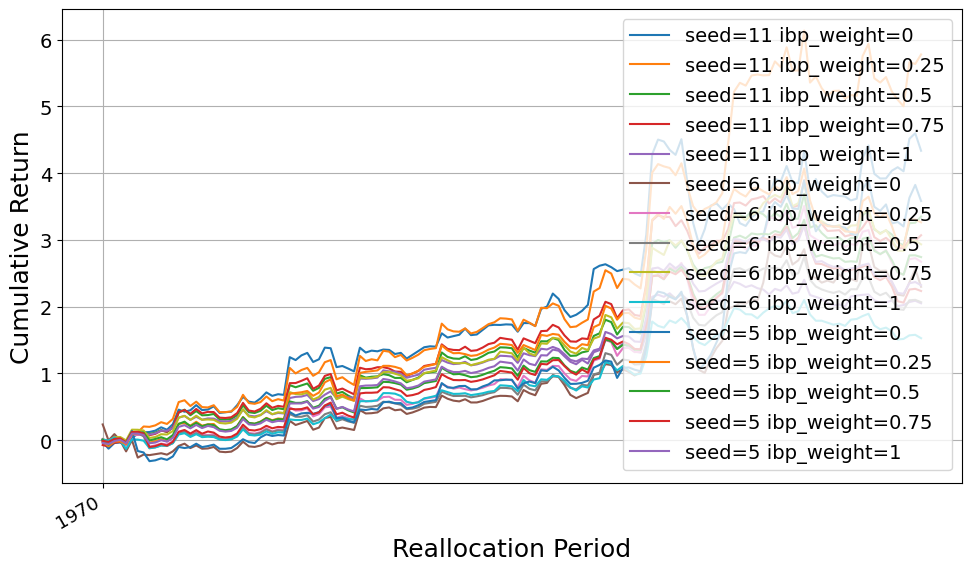

val 6


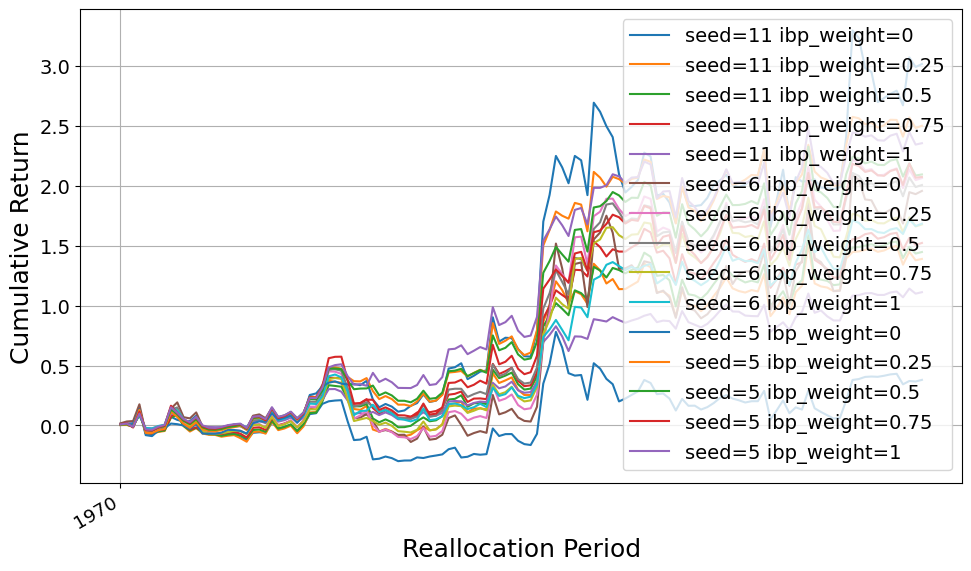

In [95]:
import matplotlib.pyplot as plt
import numpy as np

# crs_ = { e["params"]["robust_eps"]: e["results"]["test"]["raw"]["cum_returns"] for ek,e in CNN_experiments.items() if (e["params"]["checkpoint"] == 75)}


# for seed in seeds:
for dataset in ["test", "val"]:
    print(dataset, seed)
    crs = { ek: e["results"][dataset]["raw"]["cum_returns"][::5] for ek, e in experiments.items()}
    # crs = { ek : e["results"][dataset]["raw"]["cum_returns"][::5] for ek, e in experiments.items() if seed == e["params"]["seed"]}

    cumulative_returns_dict = crs

    time_points = test_indices[50:-5][::5]#range(1, len(next(iter(cumulative_returns_dict.values()))) + 1)

    plt.figure(figsize=(10, 6))
    for label, cum_returns in cumulative_returns_dict.items():
        plt.plot(range(len(cum_returns)), cum_returns, label=label)

    plt.xlabel("Reallocation Period")
    plt.ylabel("Cumulative Return")
    # plt.ylim(bottom=0)  # Ensure returns start at zero or above
    plt.legend()
    plt.gca().xaxis.set_major_locator(mdates.YearLocator())
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter("%Y"))
    plt.setp(plt.gca().get_xticklabels(), rotation=30, ha="right", fontsize='small')

    plt.grid(True)
    plt.tight_layout()
    plt.show()


In [96]:
    # print(i)
filtered = {k:v for k,v in experiments.items() if v["params"].get("ibp_weight", None) == None}
metrics = { e["params"].get("robust_eps",0): performance_metrics(e["results"]["test"]["raw"]["returns"]) for ek, e in filtered.items()}
display(pd.DataFrame(metrics).T)

for i in [0,0.25,0.5,0.75,1]:
    print(i)
    filtered = {k:v for k,v in experiments.items() if v["params"].get("ibp_weight", -1) == i}
    metrics = { e["params"].get("robust_eps",0): performance_metrics(e["results"]["test"]["raw"]["returns"]) for ek, e in filtered.items()}
    display(pd.DataFrame(metrics).T)

""


0


,annual_return,annual_volatility,sharpe_ratio,max_drawdown
0.01,0.730238,0.657651,1.110373,0.408531


0.25


,annual_return,annual_volatility,sharpe_ratio,max_drawdown
0.01,0.70019,0.56481,1.239691,0.316131


0.5


,annual_return,annual_volatility,sharpe_ratio,max_drawdown
0.01,0.604846,0.505459,1.196627,0.290963


0.75


,annual_return,annual_volatility,sharpe_ratio,max_drawdown
0.01,0.532171,0.526362,1.011036,0.294271


1


,annual_return,annual_volatility,sharpe_ratio,max_drawdown
0.01,0.563071,0.486409,1.157606,0.272363


In [97]:
metrics = { ek: (performance_metrics(e["results"]["test"]["raw"]["returns"]) | e["params"]) for ek, e in experiments.items() }

filtered = {k: v for k,v in metrics.items()}
df= pd.DataFrame(filtered).T

df

,annual_return,annual_volatility,sharpe_ratio,max_drawdown,seed,epochs,lambda_entropy,model,learning_rate,loss,jitter,weight_decay,robust_eps,alpha,ibp_weight,warmup,checkpoint
seed=11 ibp_weight=0,0.845996,0.557409,1.517731,0.290826,11,60,0.0,CNN,0.001,PGD-IBP,1.5,0.00001,0.01,0.25,0,20,60
seed=11 ibp_weight=0.25,0.9798,0.605822,1.617308,0.337621,11,60,0.0,CNN,0.001,PGD-IBP,1.5,0.00001,0.01,0.25,0.25,20,60
seed=11 ibp_weight=0.5,0.696008,0.54791,1.270296,0.31634,11,60,0.0,CNN,0.001,PGD-IBP,1.5,0.00001,0.01,0.25,0.5,20,60
seed=11 ibp_weight=0.75,0.703473,0.536342,1.311613,0.301741,11,60,0.0,CNN,0.001,PGD-IBP,1.5,0.00001,0.01,0.25,0.75,20,60
seed=11 ibp_weight=1,0.494925,0.372821,1.327513,0.197275,11,60,0.0,CNN,0.001,PGD-IBP,1.5,0.00001,0.01,0.25,1,20,60
seed=6 ibp_weight=0,0.423658,0.66123,0.640712,0.401117,6,60,0.0,CNN,0.001,PGD-IBP,1.5,0.00001,0.01,0.25,0,20,60
seed=6 ibp_weight=0.25,0.588052,0.56165,1.04701,0.300887,6,60,0.0,CNN,0.001,PGD-IBP,1.5,0.00001,0.01,0.25,0.25,20,60
seed=6 ibp_weight=0.5,0.48855,0.500944,0.975258,0.277066,6,60,0.0,CNN,0.001,PGD-IBP,1.5,0.00001,0.01,0.25,0.5,20,60
seed=6 ibp_weight=0.75,0.637339,0.516956,1.232868,0.282484,6,60,0.0,CNN,0.001,PGD-IBP,1.5,0.00001,0.01,0.25,0.75,20,60
seed=6 ibp_weight=1,0.392752,0.443292,0.885989,0.215197,6,60,0.0,CNN,0.001,PGD-IBP,1.5,0.00001,0.01,0.25,1,20,60


In [98]:
grouped = df.groupby('ibp_weight')[['annual_return']].mean().reset_index()
grouped

,ibp_weight,annual_return
0,0.00,0.666631
1,0.25,0.756014
2,0.50,0.596468
3,0.75,0.624327
4,1.00,0.483582


In [99]:
filtered = {k:v for k,v in experiments.items()}
metrics = { ek: (performance_metrics(e["results"]["test"]["raw"]["returns"]) | e["params"]) for ek, e in filtered.items() }


In [100]:
to_df = get_robustness(filtered, [0.1], [0.225], force_run=False)
pd.DataFrame(to_df)

['alpha-beta-CROWN/complete_verifier/trained_models/seed=11,epochs=60,lambda_entropy=0.0,model=CNN,learning_rate=0.001,loss=PGD-IBP,jitter=1.5,weight_decay=1e-05,robust_eps=0.01,alpha=0.25,ibp_weight=0,warmup=20,checkpoint=60.pth', 'alpha-beta-CROWN/complete_verifier/trained_models/seed=11,epochs=60,lambda_entropy=0.0,model=CNN,learning_rate=0.001,loss=PGD-IBP,jitter=1.5,weight_decay=1e-05,robust_eps=0.01,alpha=0.25,ibp_weight=0.25,warmup=20,checkpoint=60.pth', 'alpha-beta-CROWN/complete_verifier/trained_models/seed=11,epochs=60,lambda_entropy=0.0,model=CNN,learning_rate=0.001,loss=PGD-IBP,jitter=1.5,weight_decay=1e-05,robust_eps=0.01,alpha=0.25,ibp_weight=0.5,warmup=20,checkpoint=60.pth', 'alpha-beta-CROWN/complete_verifier/trained_models/seed=11,epochs=60,lambda_entropy=0.0,model=CNN,learning_rate=0.001,loss=PGD-IBP,jitter=1.5,weight_decay=1e-05,robust_eps=0.01,alpha=0.25,ibp_weight=0.75,warmup=20,checkpoint=60.pth', 'alpha-beta-CROWN/complete_verifier/trained_models/seed=11,epochs=6

,model_path,eps,delta,cp,band_width,fake,true,fake_returns,true_returns,summary,...,model,learning_rate,loss,jitter,weight_decay,robust_eps,alpha,ibp_weight,warmup,checkpoint
0,0.25,0.1,0.225,1.00,1.896208,8.660820,4.335272,"[-0.07781583, -0.052879512, -0.102124274, -0.0...","[-0.028088987, -0.030094564, -0.073280215, -0....","{'unsafe-pgd': [0, 6, 12, 13, 15, 16, 21, 22, ...",...,CNN,0.001,PGD-IBP,1.5,0.00001,0.01,0.25,0.00,20,60
1,0.25,0.1,0.225,0.16,0.673553,6.699944,5.778664,"[0.016706944, -0.009570122, -0.04729736, -0.02...","[0.016706944, -0.009570122, -0.04729736, -0.02...","{'safe-incomplete': [0, 1, 2, 3, 4, 5, 6, 7, 8...",...,CNN,0.001,PGD-IBP,1.5,0.00001,0.01,0.25,0.25,20,60
2,0.25,0.1,0.225,0.47,0.697228,4.937162,3.350903,"[0.0029515028, -0.015828729, -0.055232882, -0....","[0.0029515028, -0.015828729, -0.055232882, -0....","{'safe-incomplete': [0, 1, 2, 3, 4, 5, 8, 9, 1...",...,CNN,0.001,PGD-IBP,1.5,0.00001,0.01,0.25,0.50,20,60
3,0.25,0.1,0.225,0.03,0.190668,3.171789,3.070517,"[-0.07305956, -0.05070144, -0.099366665, -0.08...","[-0.07305956, -0.05070144, -0.099366665, -0.08...","{'safe-incomplete': [0, 1, 2, 3, 4, 5, 8, 9, 1...",...,CNN,0.001,PGD-IBP,1.5,0.00001,0.01,0.25,0.75,20,60
4,0.25,0.1,0.225,-0.03,0.041829,1.994385,2.051163,"[-0.0013533235, -0.017839193, -0.057767212, -0...","[-0.0013533235, -0.017839193, -0.057767212, -0...","{'safe-incomplete': [0, 2, 3, 4, 5, 6, 7, 8, 9...",...,CNN,0.001,PGD-IBP,1.5,0.00001,0.01,0.25,1.00,20,60
5,0.25,0.1,0.225,-0.45,0.441970,1.263859,2.298754,"[0.39260304, 0.28359902, 0.28869152, 0.2205687...","[0.23658228, 0.16196012, 0.14928317, 0.1182096...","{'unsafe-pgd': [0, 6, 7, 9, 10, 11, 12, 14, 15...",...,CNN,0.001,PGD-IBP,1.5,0.00001,0.01,0.25,0.00,20,60
6,0.25,0.1,0.225,-0.16,0.126045,2.255057,2.673605,"[0.016563654, -0.009513199, -0.047260046, -0.0...","[0.016563654, -0.009513199, -0.047260046, -0.0...","{'safe-incomplete': [0, 1, 2, 4, 5, 6, 8, 9, 1...",...,CNN,0.001,PGD-IBP,1.5,0.00001,0.01,0.25,0.25,20,60
7,0.25,0.1,0.225,-0.06,0.023034,1.943826,2.067573,"[0.016006589, -0.00986135, -0.047674596, -0.02...","[0.016006589, -0.00986135, -0.047674596, -0.02...","{'safe-incomplete': [0, 1, 2, 4, 5, 7, 8, 9, 1...",...,CNN,0.001,PGD-IBP,1.5,0.00001,0.01,0.25,0.50,20,60
8,0.25,0.1,0.225,0.02,0.098442,2.998213,2.934226,"[6.92606e-05, -0.01719296, -0.05694747, -0.037...","[6.92606e-05, -0.01719296, -0.05694747, -0.037...","{'safe-incomplete': [0, 1, 2, 3, 4, 5, 6, 7, 8...",...,CNN,0.001,PGD-IBP,1.5,0.00001,0.01,0.25,0.75,20,60
9,0.25,0.1,0.225,0.10,0.118336,1.687281,1.528059,"[0.0072522163, -0.013861418, -0.052741587, -0....","[0.0072522163, -0.013861418, -0.052741587, -0....","{'safe-incomplete': [0, 1, 2, 4, 5, 6, 7, 8, 9...",...,CNN,0.001,PGD-IBP,1.5,0.00001,0.01,0.25,1.00,20,60


In [101]:
len(to_df), len(metrics)

(15, 15)

In [102]:
to_df[0].keys()

dict_keys(['model_path', 'eps', 'delta', 'cp', 'band_width', 'fake', 'true', 'fake_returns', 'true_returns', 'summary', 'adv_X', 'unsafe-pgd', 'safe-incomplete', 'unknown', 'seed', 'epochs', 'lambda_entropy', 'model', 'learning_rate', 'loss', 'jitter', 'weight_decay', 'robust_eps', 'alpha', 'ibp_weight', 'warmup', 'checkpoint'])

In [103]:
test_eps = [0.1]
test_delta = [0.225]
to_df = get_robustness(filtered,  [0.1], [0.225])

metrics = { (e["params"].get("ibp_weight",0),  e["params"].get("seed",0)): performance_metrics(e["results"]["test"]["raw"]["returns"]) | e["params"] for ek, e in filtered.items()}

for item in to_df:
    seed = item["seed"]
    ibp_weight = item.get("ibp_weight", 0)
    robust = item.get("safe-incomplete",0)
    nonrobust = item.get("unsafe-pgd",0)
    unknown = item.get("unknown",0)

    robsut_per =  robust / (robust+nonrobust+unknown)
    cp = item["cp"]
    t = item["true"]
    fake = item["fake"]
    band_width = item["band_width"]

    print((ibp_weight, seed))

    metrics[(ibp_weight, seed)] = metrics[(ibp_weight, seed)] | {"robust": robsut_per, "cp": cp, "t":t, "fake":fake, "band_width": band_width}

df = pd.DataFrame([ {"beta": k} | v for k,v in metrics.items()])

df 

['alpha-beta-CROWN/complete_verifier/trained_models/seed=11,epochs=60,lambda_entropy=0.0,model=CNN,learning_rate=0.001,loss=PGD-IBP,jitter=1.5,weight_decay=1e-05,robust_eps=0.01,alpha=0.25,ibp_weight=0,warmup=20,checkpoint=60.pth', 'alpha-beta-CROWN/complete_verifier/trained_models/seed=11,epochs=60,lambda_entropy=0.0,model=CNN,learning_rate=0.001,loss=PGD-IBP,jitter=1.5,weight_decay=1e-05,robust_eps=0.01,alpha=0.25,ibp_weight=0.25,warmup=20,checkpoint=60.pth', 'alpha-beta-CROWN/complete_verifier/trained_models/seed=11,epochs=60,lambda_entropy=0.0,model=CNN,learning_rate=0.001,loss=PGD-IBP,jitter=1.5,weight_decay=1e-05,robust_eps=0.01,alpha=0.25,ibp_weight=0.5,warmup=20,checkpoint=60.pth', 'alpha-beta-CROWN/complete_verifier/trained_models/seed=11,epochs=60,lambda_entropy=0.0,model=CNN,learning_rate=0.001,loss=PGD-IBP,jitter=1.5,weight_decay=1e-05,robust_eps=0.01,alpha=0.25,ibp_weight=0.75,warmup=20,checkpoint=60.pth', 'alpha-beta-CROWN/complete_verifier/trained_models/seed=11,epochs=6

,beta,annual_return,annual_volatility,sharpe_ratio,max_drawdown,seed,epochs,lambda_entropy,model,learning_rate,...,robust_eps,alpha,ibp_weight,warmup,checkpoint,robust,cp,t,fake,band_width
0,"(0, 11)",0.845996,0.557409,1.517731,0.290826,11,60,0.0,CNN,0.001,...,0.01,0.25,0.00,20,60,0.276596,1.00,4.335272,8.660820,1.896208
1,"(0.25, 11)",0.979800,0.605822,1.617308,0.337621,11,60,0.0,CNN,0.001,...,0.01,0.25,0.25,20,60,0.482270,0.16,5.778664,6.699944,0.673553
2,"(0.5, 11)",0.696008,0.547910,1.270296,0.316340,11,60,0.0,CNN,0.001,...,0.01,0.25,0.50,20,60,0.539007,0.47,3.350903,4.937162,0.697228
3,"(0.75, 11)",0.703473,0.536342,1.311613,0.301741,11,60,0.0,CNN,0.001,...,0.01,0.25,0.75,20,60,0.524823,0.03,3.070517,3.171789,0.190668
4,"(1, 11)",0.494925,0.372821,1.327513,0.197275,11,60,0.0,CNN,0.001,...,0.01,0.25,1.00,20,60,0.971631,-0.03,2.051163,1.994385,0.041829
5,"(0, 6)",0.423658,0.661230,0.640712,0.401117,6,60,0.0,CNN,0.001,...,0.01,0.25,0.00,20,60,0.148936,-0.45,2.298754,1.263859,0.441970
6,"(0.25, 6)",0.588052,0.561650,1.047010,0.300887,6,60,0.0,CNN,0.001,...,0.01,0.25,0.25,20,60,0.638298,-0.16,2.673605,2.255057,0.126045
7,"(0.5, 6)",0.488550,0.500944,0.975258,0.277066,6,60,0.0,CNN,0.001,...,0.01,0.25,0.50,20,60,0.815603,-0.06,2.067573,1.943826,0.023034
8,"(0.75, 6)",0.637339,0.516956,1.232868,0.282484,6,60,0.0,CNN,0.001,...,0.01,0.25,0.75,20,60,0.822695,0.02,2.934226,2.998213,0.098442
9,"(1, 6)",0.392752,0.443292,0.885989,0.215197,6,60,0.0,CNN,0.001,...,0.01,0.25,1.00,20,60,0.971631,0.10,1.528059,1.687281,0.118336


In [104]:
result = (
    df
    .groupby('ibp_weight')[[
        'annual_return',
        'annual_volatility',
        'sharpe_ratio',
        'max_drawdown',
        "robust", 
        "cp",
        "t",
        "fake",
    ]]
    .mean()
    .reset_index()
)
result

,ibp_weight,annual_return,annual_volatility,sharpe_ratio,max_drawdown,robust,cp,t,fake
0,0.00,0.666631,0.625430,1.089605,0.366825,0.182033,0.303333,3.405756,4.934349
1,0.25,0.756014,0.577427,1.301336,0.318213,0.572104,0.050000,3.905336,4.239585
2,0.50,0.596468,0.518104,1.147394,0.294790,0.657210,0.166667,2.720582,3.291579
3,0.75,0.624327,0.526553,1.185172,0.292832,0.692671,0.190000,2.746621,3.188660
4,1.00,0.483582,0.434174,1.123703,0.228278,0.903073,0.120000,1.966984,2.228191


## PGD-IBP LSTM

In [105]:
# # 0/0
    
# #     {
# #     "seed": seeds[:1],
# #     "epochs": [40],
# #     "lambda_entropy": [0.025],
# #     "model": ["LSTM"],
# #     "lstm_hidden_layers" : [1],
# #     "lstm_hidden_size": [8],
# #     "learning_rate": [1e-3],
# #     "rebalance_freq": [5],
# #     "loss": ["Standard"],
# #     "jitter": [1.5],
# # },
# # ]

# #{
# #     "seed": seeds[:1],
# #     "epochs": [120],
# #     "lambda_entropy": [0.025],
# #     "model": ["LSTM_Unrolled"],
# #     "lstm_hidden_layers" : [1],
# #     "lstm_hidden_size": [8],
# #     "learning_rate": [1e-3],
# #     "rebalance_freq": [5],
# #     "loss": ["IBP"],
# #     "jitter": [1.5],
# #     "warmup": [20],
# #     "robust_eps": [0.0005],
# #     "alpha": [0.25],
# #     "checkpoint_freq": [10]
# # },
# params_grids = [{
#     "seed": seeds[:1],
#     "epochs": [100],
#     "lambda_entropy": [0.025],
#     "model": ["LSTM_Unrolled"],
#     "lstm_hidden_layers" : [1],
#     "lstm_hidden_size": [8],
#     "learning_rate": [1e-3],
#     "rebalance_freq": [5],
#     "loss": ["Standard"],
#     "jitter": [1.5],
# },
# {
#     "seed": seeds[:1],
#     "epochs": [80],
#     "lambda_entropy": [0.025],
#     "learning_rate": [1e-3],
#     "rebalance_freq": [5],
#     "loss": ["PGD"],
#     "jitter": [1.5],
#     "warmup": [20],
#     "model": ["LSTM_Unrolled"],
#     "lstm_hidden_layers" : [1],
#     "lstm_hidden_size": [8],
#     "alpha": [0],
#     "checkpoint_freq": [10],
#     "epsilon": [0.01, 0.05]
# },
# ]

# params_grids = [{
#     "seed": seeds[:1],
#     "epochs": [140],
#     "lambda_entropy": [0.025],
#     "model": ["LSTM_Unrolled"],
#     "lstm_hidden_layers" : [1],
#     "lstm_hidden_size": [8],
#     "learning_rate": [1e-3],
#     "rebalance_freq": [5],
#     "loss": ["Standard"],
#     "jitter": [1.5],
#     "checkpoint_freq": [20],
#     "robust_loss_weight": [0.25],
#     "ibp_weight": [0, 1, 0.25],
#     "robust_eps": [0.001, 0.002, 0.0005]
# },
# ]

params_grids = [
    {
    "seed": seeds[:1],
    "epochs": [100],
    "lambda_entropy": [0.025],
    "model": ["LSTM_Unrolled"],
    "lstm_hidden_layers" : [1],
    "lstm_hidden_size": [8],
    "learning_rate": [1e-3],
    "rebalance_freq": [5],
    "loss": ["Standard"],
    "jitter": [1.5],
    },
    {
    "seed": seeds[:1],
    "epochs": [140],
    "lambda_entropy": [0.025],
    "model": ["LSTM_Unrolled"],
    "lstm_hidden_layers" : [1],
    "lstm_hidden_size": [8],
    "learning_rate": [1e-3],
    "rebalance_freq": [5],
    "loss": ["Standard"],
    "jitter": [1.5],
    "checkpoint_freq": [20],
    "robust_loss_weight": [0.25],
    "ibp_weight": [0, 1],  #0.250.25 0.76 1.65 0.29 0.65 ,
    "robust_eps": [0.001, 0.002, 0.0005]
}
]

experiment_path = "alpha-beta-CROWN/complete_verifier/trained_models"
#lambda x: FinalCNN().to(device)
experiments = get_experiment_model(standard_model_fn, experiment_path, params_grids, pgd_ibp_loss_fn_fn, dataset_fn, device=device, train_robust=False)


experiments = {k:v for k,v in experiments.items() if v["params"]["checkpoint"] == 100}

# experiments = { "test": {"model": model, "params": {}, "results": {}}}
# 10.4
for model_name, experiment in experiments.items():
    model = experiment["model"]

    experiment["results"]["val"] = run_experiment(model, (X_val_tensor, y_val_tensor[:, 0:1, :].squeeze(1)), experiment)
    experiment["results"]["test"] = run_experiment(model, (X_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1)), experiment)


HERE
{100: 'alpha-beta-CROWN/complete_verifier/trained_models/seed=10,epochs=100,lambda_entropy=0.025,model=LSTM_Unrolled,lstm_hidden_layers=1,lstm_hidden_size=8,learning_rate=0.001,rebalance_freq=5,loss=Standard,jitter=1.5,checkpoint=100.pth'}
None
[True]
['alpha-beta-CROWN/complete_verifier/trained_models/seed=10,epochs=100,lambda_entropy=0.025,model=LSTM_Unrolled,lstm_hidden_layers=1,lstm_hidden_size=8,learning_rate=0.001,rebalance_freq=5,loss=Standard,jitter=1.5,checkpoint=100.pth']
Loading alpha-beta-CROWN/complete_verifier/trained_models/seed=10,epochs=100,lambda_entropy=0.025,model=LSTM_Unrolled,lstm_hidden_layers=1,lstm_hidden_size=8,learning_rate=0.001,rebalance_freq=5,loss=Standard,jitter=1.5,checkpoint=100.pth
HERE
{20: 'alpha-beta-CROWN/complete_verifier/trained_models/seed=10,epochs=140,lambda_entropy=0.025,model=LSTM_Unrolled,lstm_hidden_layers=1,lstm_hidden_size=8,learning_rate=0.001,rebalance_freq=5,loss=Standard,jitter=1.5,checkpoint_freq=20,robust_loss_weight=0.25,ibp

/tmp/ipykernel_214950/3805463404.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab10')


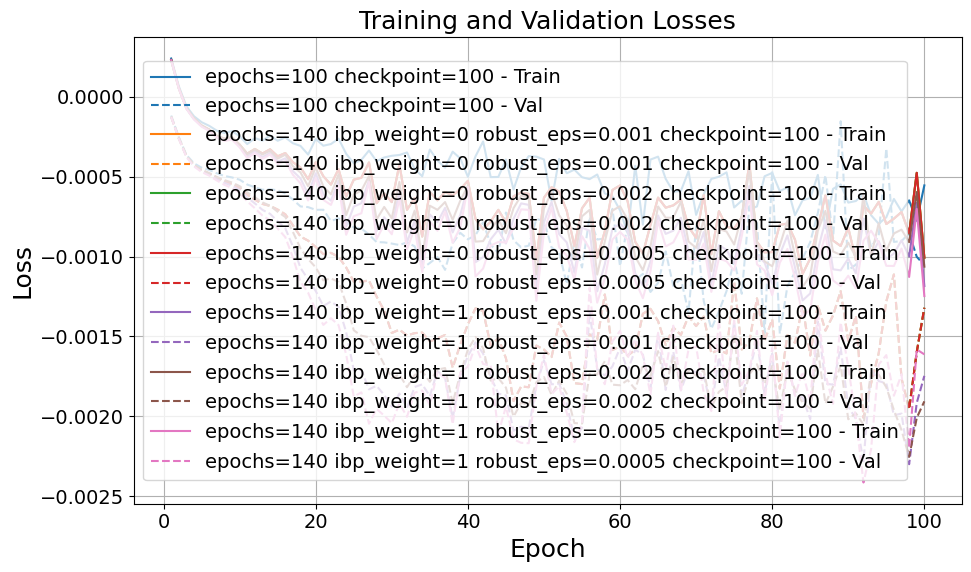

--------------------
Test RESULTS
--------------------


/tmp/ipykernel_214950/3805463404.py:30: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  metrics_df = metrics_df.applymap(lambda x: f"{x:.3g}" if isinstance(x, float) else x)


,expected_return,sharpe_ratio,max_drawdown,mean_entropy,mean_return,std_return
epochs=100 checkpoint=100,7.72,0.0788,0.39,0.604,0.00409,0.0519
epochs=140 ibp_weight=0 robust_eps=0.001 checkpoint=100,10.7,0.0798,0.425,0.464,0.00494,0.0619
epochs=140 ibp_weight=0 robust_eps=0.002 checkpoint=100,10.7,0.0798,0.425,0.464,0.00494,0.0619
epochs=140 ibp_weight=0 robust_eps=0.0005 checkpoint=100,10.7,0.0798,0.425,0.464,0.00494,0.0619
epochs=140 ibp_weight=1 robust_eps=0.001 checkpoint=100,9.46,0.0761,0.413,0.469,0.0047,0.0618
epochs=140 ibp_weight=1 robust_eps=0.002 checkpoint=100,7.79,0.0737,0.397,0.542,0.00425,0.0577
epochs=140 ibp_weight=1 robust_eps=0.0005 checkpoint=100,10.4,0.0783,0.421,0.427,0.00498,0.0635


(701,)
(701,)
(701,)
(701,)
(701,)
(701,)
(701,)


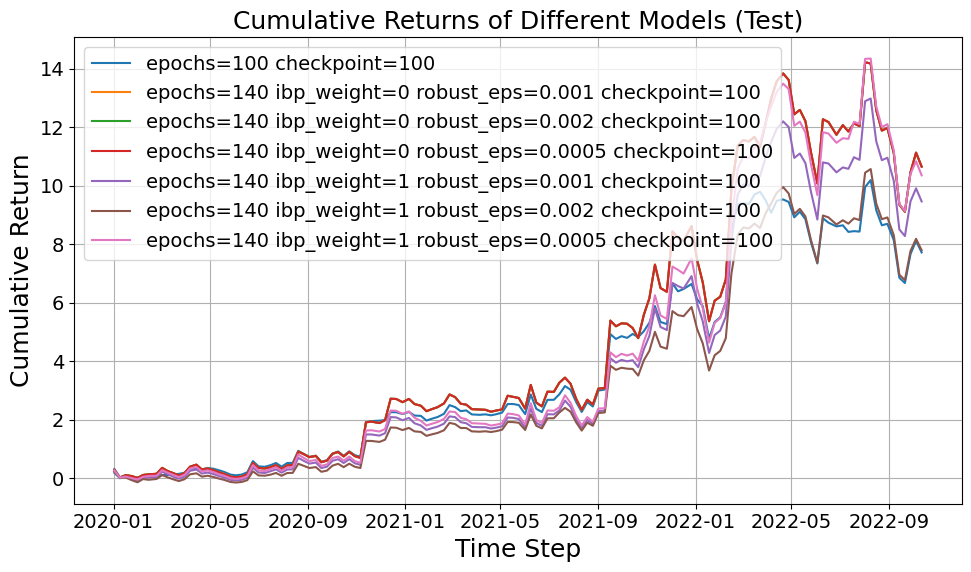

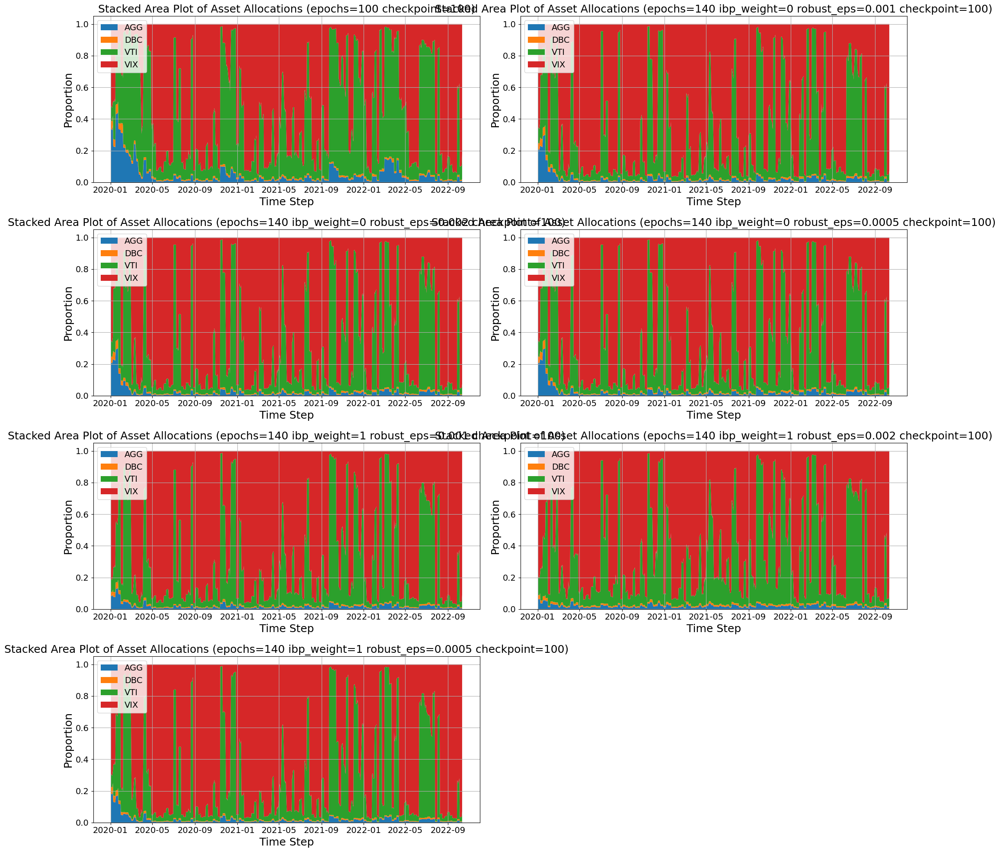

--------------------
Val RESULTS
--------------------


/tmp/ipykernel_214950/3805463404.py:30: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  metrics_df = metrics_df.applymap(lambda x: f"{x:.3g}" if isinstance(x, float) else x)


,expected_return,sharpe_ratio,max_drawdown,mean_entropy,mean_return,std_return
epochs=100 checkpoint=100,5.8,0.0794,0.356,0.531,0.00444,0.0559
epochs=140 ibp_weight=0 robust_eps=0.001 checkpoint=100,5.68,0.0761,0.401,0.392,0.00477,0.0627
epochs=140 ibp_weight=0 robust_eps=0.002 checkpoint=100,5.68,0.0761,0.401,0.392,0.00477,0.0627
epochs=140 ibp_weight=0 robust_eps=0.0005 checkpoint=100,5.68,0.0761,0.401,0.392,0.00477,0.0627
epochs=140 ibp_weight=1 robust_eps=0.001 checkpoint=100,6.97,0.0797,0.389,0.427,0.0051,0.064
epochs=140 ibp_weight=1 robust_eps=0.002 checkpoint=100,7.4,0.0847,0.322,0.523,0.00482,0.0569
epochs=140 ibp_weight=1 robust_eps=0.0005 checkpoint=100,6.49,0.0771,0.44,0.37,0.00518,0.0672


(637,)
(637,)
(637,)
(637,)
(637,)
(637,)
(637,)


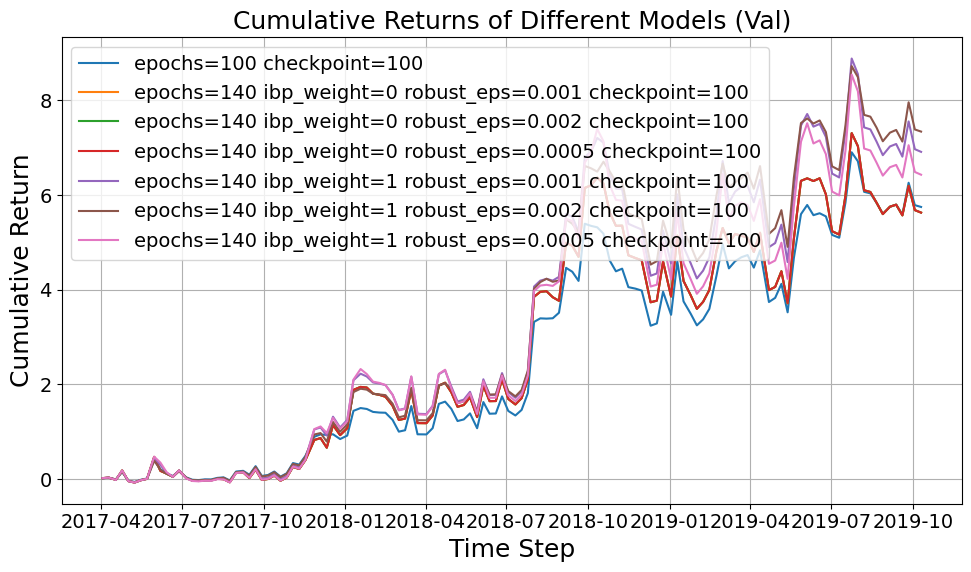

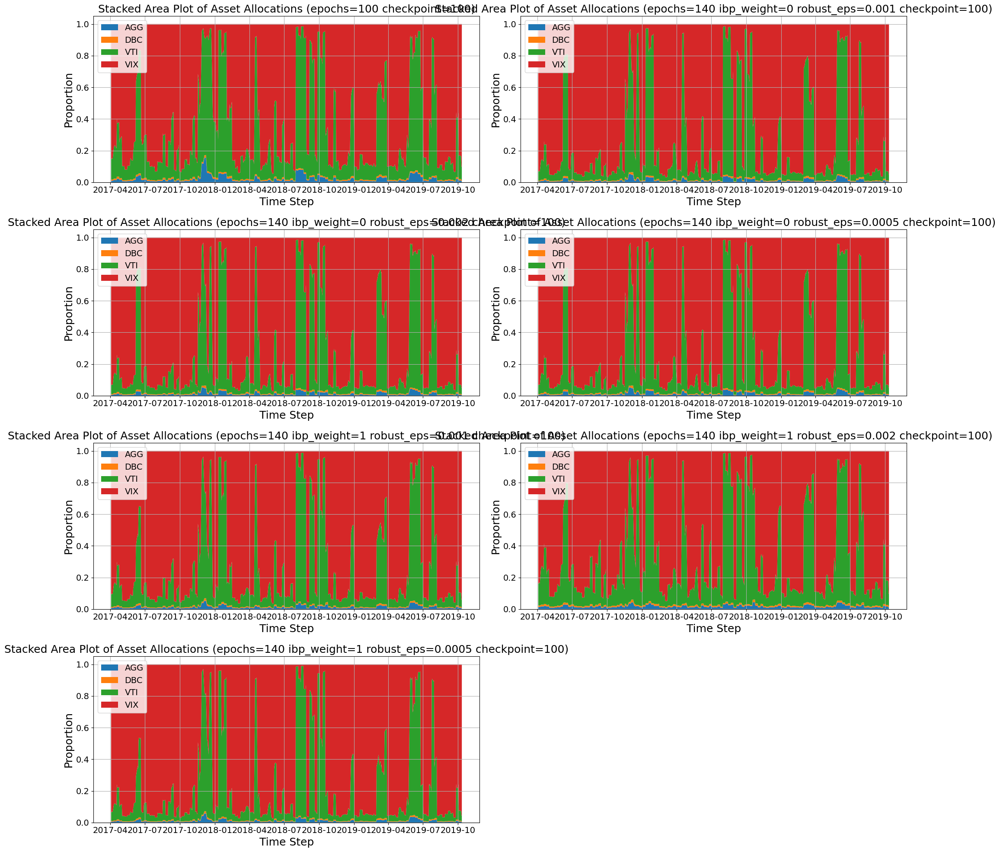

In [106]:
# ments.items() if all([(best_params[pk] == e["params"][pk] or pk == "seed") for pk in best_params])}
display_train_results(experiments)
# filtered_experiements = experiments
for dataset_key, dataset_idx in zip(["test", "val", ], [test_idx,val_idx]):
    print("-"*20)
    print(dataset_key.capitalize() + " RESULTS")
    print("-"*20)
    display_experiment_results(experiments, dataset_key, dataset_idx )

In [107]:
# params_grids = [{
#     "seed": seeds,
#     "epochs": [100],
#     "lambda_entropy": [0.025],
#     "model": ["LSTM_Unrolled"],
#     "lstm_hidden_layers" : [1],
#     "lstm_hidden_size": [8],
#     "learning_rate": [1e-3],
#     "rebalance_freq": [5],
#     "loss": ["Standard"],
#     "jitter": [1.5],
# },
# # { this works well for IBP
# #     "seed": seeds[:1],
# #     "epochs": [100],
# #     "lambda_entropy": [0.025],
# #     "model": ["LSTM_Unrolled"],
# #     "lstm_hidden_layers" : [1],
# #     "lstm_hidden_size": [8],
# #     "learning_rate": [1e-3],
# #     "rebalance_freq": [5],
# #     "loss": ["IBP"],
# #     "jitter": [1.5],
# #     "warmup": [20],
# #     "robust_eps": [0.005],
# #     "alpha": [0.25],
# # },
# params_grids = [
# {
#     "seed": seeds[:1],
#     "epochs": [60],
#     "lambda_entropy": [0.025],
#     "model": ["LSTM_Unrolled"],
#     "lstm_hidden_layers" : [1],
#     "lstm_hidden_size": [8],
#     "learning_rate": [1e-3],
#     "rebalance_freq": [5],
#     "loss": ["PGD"],
#     "jitter": [1.5],
#     "warmup": [20],
#     "robust_eps": [0.001],
#     "alpha": [0.25],
# },
# ]


# def dataset_fn(params):
#     jitter = Jitter(sigma=params.get("jitter", 0.025))
#     train_dataset = AugmentedTimeSeriesDataset(X_train_tensor, y_train_tensor, transform=jitter)
#     val_dataset = TensorDataset(X_val_tensor, y_val_tensor)

#     train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
#     val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
#     return train_loader, val_loader


# experiment_path = "alpha-beta-CROWN/complete_verifier/trained_models"
# experiments = get_experiment_model(standard_model_fn, experiment_path, params_grids, robust_loss_fn_fn, dataset_fn, device=device, train_robust=False)

# for model_name, experiment in experiments.items():
#     model = experiment["model"]

#     experiment["results"]["val"] = run_experiment(model, (X_val_tensor, y_val_tensor[:, 0:1, :].squeeze(1)), experiment)
#     experiment["results"]["test"] = run_experiment(model, (X_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1)), experiment)


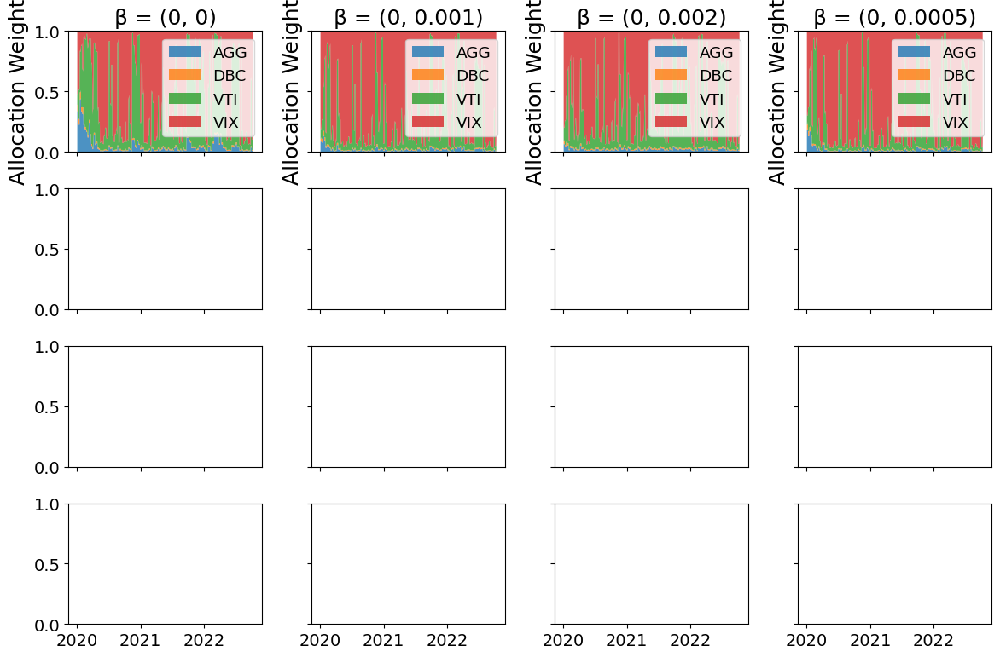

In [108]:
# robust_weights = { e["params"]["seed"]: e["results"]["test"]["raw"]["weights"] for ek,e in experiments.items()}
# robust_weights = {"Standard (Train ε=0)": standard_experiment["results"]["test"]["raw"]["weights"]}
# for eps in [0.001, 0.01, 0.015]:
#    robust_weights[ f'Robust (Train ε={eps})'] = robust_weights_[eps]
robust_weights = { (e["params"].get("epsilon", 0), e["params"].get("robust_eps", 0)): e["results"]["test"]["raw"]["weights"] for ek,e in experiments.items() }


weights_dict = robust_weights


asset_labels = asset_names
time_points = test_indices[:-55]  # 1 to 151 periods


fig, axes = plt.subplots(4, 4, figsize=(12, 8), sharex=True, sharey=True)
axes = axes.flatten()


for ax, (label, weights) in zip(axes, weights_dict.items()):
   # Create a stackplot: weights[:,0], weights[:,1], weights[:,2], weights[:,3]
   ax.stackplot(time_points,
                weights[:, 0],
                weights[:, 1],
                weights[:, 2],
           weights[:, 3],
                labels=asset_labels,
                alpha=0.8)
   ax.set_title(f"β = {label}")
   # ax.set_xlabel("Date")
   ax.set_ylabel("Allocation Weight")
   ax.set_ylim(0, 1)
   ax.xaxis.set_major_locator(mdates.AutoDateLocator(minticks=1, maxticks=6))
   ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y"))
   ax.legend(loc='upper right', fontsize='small')


fig.tight_layout()
plt.show()


In [109]:
# experiments["checkpoint=100"]["model"](X_test_tensor[:10].to(device))

/tmp/ipykernel_214950/3805463404.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab10')


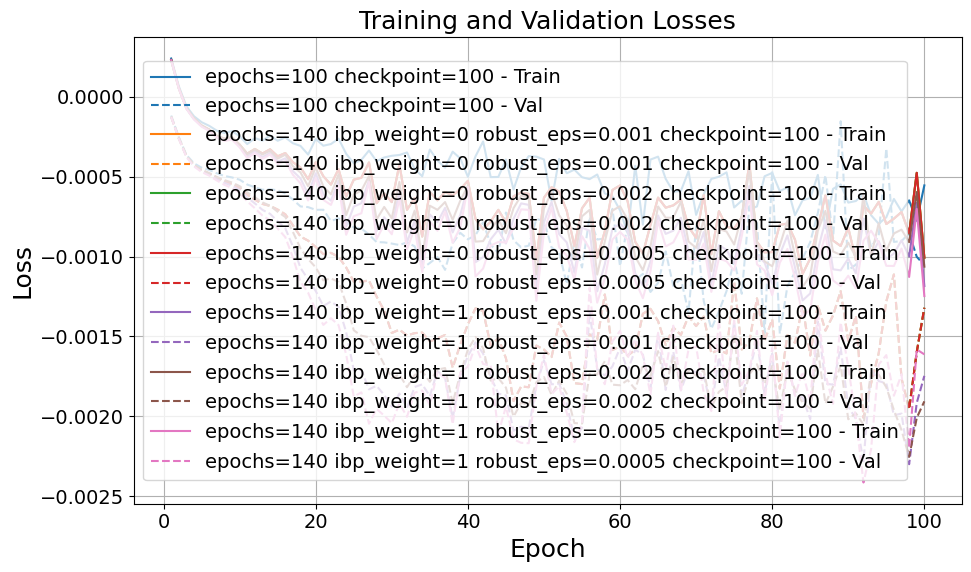

In [110]:
display_train_results(experiments)

test 5


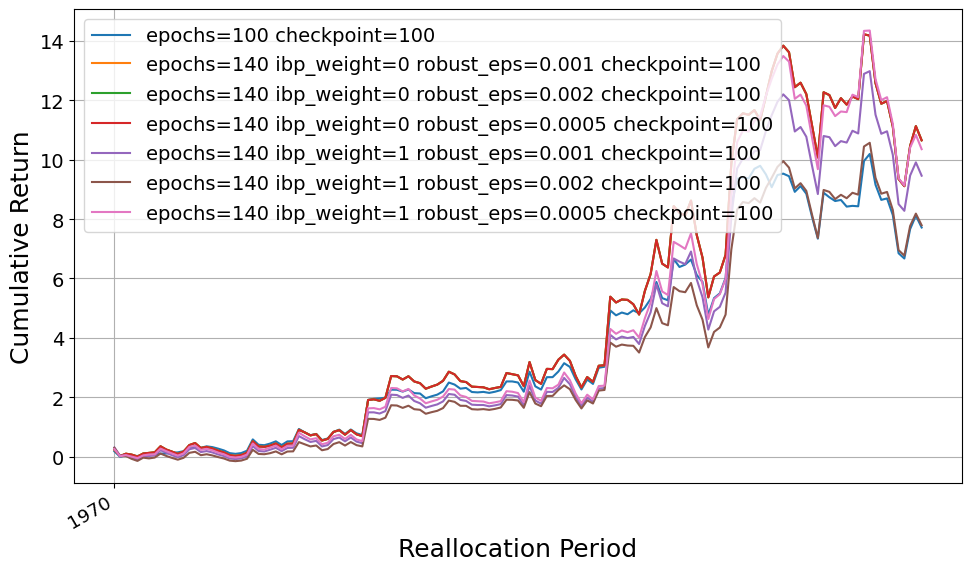

val 5


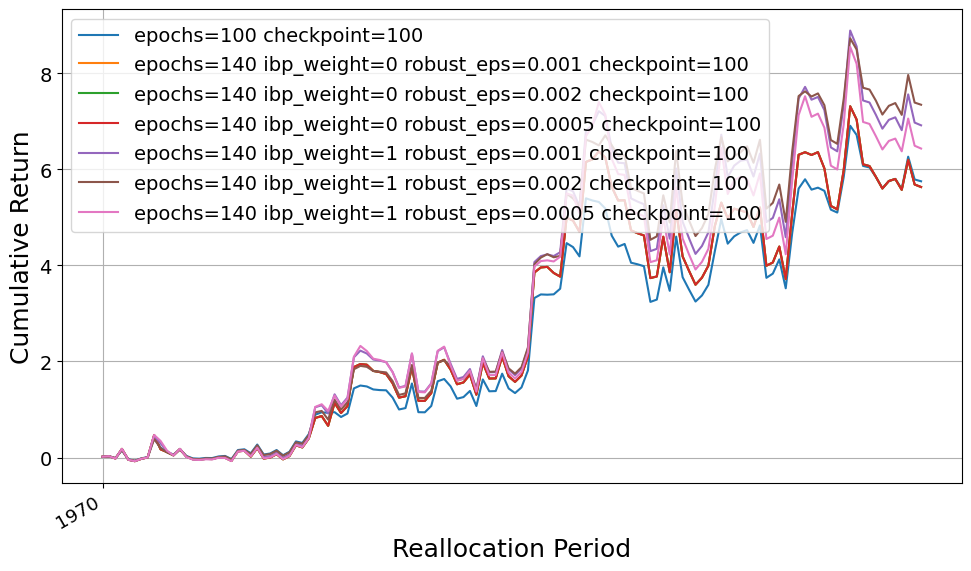

In [111]:
import matplotlib.pyplot as plt
import numpy as np

# crs_ = { e["params"]["robust_eps"]: e["results"]["test"]["raw"]["cum_returns"] for ek,e in CNN_experiments.items() if (e["params"]["checkpoint"] == 75)}


for dataset in ["test", "val"]:
    print(dataset, seed)
    crs = { ek : e["results"][dataset]["raw"]["cum_returns"][::5] for ek, e in experiments.items() if e["params"]["checkpoint"] > 60}

    cumulative_returns_dict = crs

    time_points = test_indices[50:-5][::5]#range(1, len(next(iter(cumulative_returns_dict.values()))) + 1)

    plt.figure(figsize=(10, 6))
    for label, cum_returns in cumulative_returns_dict.items():
        plt.plot(range(len(cum_returns)), cum_returns, label=label)

    plt.xlabel("Reallocation Period")
    plt.ylabel("Cumulative Return")
    # plt.ylim(bottom=0)  # Ensure returns start at zero or above
    plt.legend()
    plt.gca().xaxis.set_major_locator(mdates.YearLocator())
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter("%Y"))
    plt.setp(plt.gca().get_xticklabels(), rotation=30, ha="right", fontsize='small')

    plt.grid(True)
    plt.tight_layout()
    plt.show()


In [112]:
standard_lstm = experiments["epochs=100 checkpoint=100"]
robust_lstm = experiments["epochs=140 ibp_weight=1 robust_eps=0.002 checkpoint=100"]

filtered = { "Standard LSTM": standard_lstm, "robust_lstm": robust_lstm}

In [113]:
robustness = get_robustness(filtered, [0.1], [0.1], extra_args={"no_incomplete": ""})

['alpha-beta-CROWN/complete_verifier/trained_models/seed=10,epochs=100,lambda_entropy=0.025,model=LSTM_Unrolled,lstm_hidden_layers=1,lstm_hidden_size=8,learning_rate=0.001,rebalance_freq=5,loss=Standard,jitter=1.5,checkpoint=100.pth', 'alpha-beta-CROWN/complete_verifier/trained_models/seed=10,epochs=140,lambda_entropy=0.025,model=LSTM_Unrolled,lstm_hidden_layers=1,lstm_hidden_size=8,learning_rate=0.001,rebalance_freq=5,loss=Standard,jitter=1.5,checkpoint_freq=20,robust_loss_weight=0.25,ibp_weight=1,robust_eps=0.002,checkpoint=100.pth']
No results found, running at 0.1, 0.1
python alpha-beta-CROWN/complete_verifier/abcrown.py --config jamie.yaml --device cuda --start 0 --end 151 --conv_mode matrix --no_incomplete  --epsilon 0.1 --delta 0.1 --output_file alpha-beta-CROWN/complete_verifier/trained_models/seed=10,epochs=100,lambda_entropy=0.025,model=LSTM_Unrolled,lstm_hidden_layers=1,lstm_hidden_size=8,learning_rate=0.001,rebalance_freq=5,loss=Standard,jitter=1.5,checkpoint=100_e=0.1_d=0.

UnboundLocalError: cannot access local variable 'cex_data' where it is not associated with a value

In [ ]:
pd.DataFrame(robustness)[""]

# End of useful work

In [ ]:
# import pandas as pd
# import numpy as np
# import matplotlib.pyplot as plt
# import seaborn as sns
# df = pd.DataFrame(to_df)
# # (Assume `df` is already defined and preprocessed as before)

# # 1) Replace NaNs with zero for counts
# df['safe-incomplete'].fillna(0, inplace=True)
# df['unsafe-pgd'].fillna(0, inplace=True)
# df['unknown'].fillna(0, inplace=True)

# # 2) Compute percentages out of total test samples (151)
# total = 25
# df['percent_robust']     = df['safe-incomplete'] / total * 100
# df['percent_non_robust'] = df['unsafe-pgd'] / total * 100
# df['percent_unknown']    = df['unknown'] / total * 100

# # 3) Pivot into matrices (rows: train ε, cols: test ε)
# pivot_robust     = df.pivot(index='eps', columns='model_path', values='percent_robust')
# pivot_non_robust = df.pivot(index='eps', columns='model_path', values='percent_non_robust')
# pivot_unknown    = df.pivot(index='eps', columns='model_path', values='percent_unknown')

# # 4) Sort both axes
# pivot_robust     = pivot_robust.sort_index(ascending=False).sort_index(axis=1)
# pivot_non_robust = pivot_non_robust.sort_index(ascending=False).sort_index(axis=1)
# pivot_unknown    = pivot_unknown.sort_index(ascending=False).sort_index(axis=1)

# # 5) Plot three narrower heatmaps side by side
# #    Reduce figure width so each cell is less wide
# fig, axes = plt.subplots(1, 3, figsize=(14, 5))  # narrower total width

# for ax, (data, cmap, title) in zip(
#     axes,
#     [
#         (pivot_robust,     "Greens",  "Robust (%)"),
#         (pivot_non_robust, "Reds",    "Non‐Robust (%)"),
#         (pivot_unknown,    "YlOrBr",  "Unknown (%)")
#     ]
# ):
#     sns.heatmap(
#         data,
#         ax=ax,
#         annot=True,
#         fmt=".0f",
#         cmap=cmap,
#         cbar=False,
#         linewidths=0.5,
#         square=False,         # allow rectangular cells
#         xticklabels=True,
#         yticklabels=True
#     )
#     ax.set_title(title)
#     ax.set_xlabel("Train ε")
#     ax.set_ylabel("Test ε")

# plt.tight_layout()
# plt.show()


In [ ]:
# 	model_path	eps	delta	cp	safe-incomplete	unsafe-pgd	unknown
# 0	standard	0.01	0.05	0.30	16.0	9	NaN
# 1	standard	0.01	0.10	-0.27	18.0	6	1.0
# 2	standard	0.01	0.20	-0.25	21.0	3	1.0
# 3	standard	0.01	0.30	0.00	24.0	0	1.0
# 4	standard	0.02	0.05	0.36	6.0	18	1.0
# 5	standard	0.02	0.10	0.62	13.0	9	3.0
# 6	standard	0.02	0.20	-0.29	16.0	8	1.0
# 7	standard	0.02	0.30	-0.49	16.0	6	3.0
# 8	standard	0.05	0.05	0.02	2.0	23	NaN
# 9	standard	0.05	0.10	0.90	2.0	20	3.0
# 10	standard	0.05	0.20	-0.33	5.0	16	4.0
# 11	standard	0.05	0.30	-0.37	6.0	15	4.0
# 12	standard	0.10	0.05	0.38	NaN	23	2.0
# 13	standard	0.10	0.10	-0.01	NaN	23	2.0
# 14	standard	0.10	0.20	1.03	NaN	21	4.0
# 15	standard	0.10	0.30	-0.48	1.0	19	5.0
# 16	robust	0.01	0.05	0.00	25.0	0	NaN
# 17	robust	0.01	0.10	0.00	25.0	0	NaN
# 18	robust	0.01	0.20	0.00	25.0	0	NaN
# 19	robust	0.01	0.30	0.00	25.0	0	NaN
# 20	robust	0.02	0.05	0.00	25.0	0	NaN
# 21	robust	0.02	0.10	0.00	25.0	0	NaN
# 22	robust	0.02	0.20	0.00	25.0	0	NaN
# 23	robust	0.02	0.30	0.00	25.0	0	NaN
# 24	robust	0.05	0.05	-0.03	18.0	7	NaN
# 25	robust	0.05	0.10	0.00	25.0	0	NaN
# 26	robust	0.05	0.20	0.00	25.0	0	NaN
# 27	robust	0.05	0.30	0.00	25.0	0	NaN
# 28	robust	0.10	0.05	-0.06	10.0	15	NaN
# 29	robust	0.10	0.10	-0.05	18.0	7	NaN
# 30	robust	0.10	0.20	0.00	25.0	0	NaN
# 31	robust	0.10	0.30	0.00	25.0	0	NaN


In [ ]:
# for model_path, model_path_dict in results.items():
#     for eps, eps_dict in model_path_dict.items():
#         for delta, delta_dict in eps_dict.items():

#             if eps != 0.1 or delta != 0.1:
#                 continue

#             # curr_result = results[model_path][eps][delta]


#             # current_result = results[0.1][0.1]
#             Xc_test_tensor = X_test_tensor.clone()
#             c = 0

#             # print(summary["results_data"]["summary"]["unsafe-pgd"])
#             for i in range(0,Xc_test_tensor.shape[0], 5):
#                 if i // 5 in delta_dict["results_data"]["summary"]["unsafe-pgd"]:
#                     avd = torch.tensor(delta_dict["cex_data"]["x"][c]).reshape(50,4)
#                     c += 1
#                     Xc_test_tensor[i] = avd

#             # print(Xc_test_tensor)
#             true_run = run_experiment(to_model[model_path], (X_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1)), experiment)
#             fake_run = run_experiment(to_model[model_path], (Xc_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1)), experiment)

#             cp = round((fake_run["metrics"]["expected_return"] - true_run["metrics"]["expected_return"]) / true_run["metrics"]["expected_return"], 2)

#             plt.figure(figsize=(10,8))
#             plt.plot(fake_run["raw"]["cum_returns"], label="Counterfactual")
#             plt.plot(true_run["raw"]["cum_returns"], label="True")
#             plt.legend()
#             plt.show()
                        
            


#             summary_agg = {}
#             if delta_dict["results_data"] is not None:
#                 summary = delta_dict["results_data"]["summary"]
#                 for k, v in summary.items():
#                     summary_agg[k] = len(v)

#             to_df.append({
#                 "model_path": namer[model_path],
#                 "eps": eps,
#                 "delta": delta,
#                 "cp": cp,
#                 "fake": fake_run["metrics"]["expected_return"],
#                 "true": true_run["metrics"]["expected_return"]
#             } | summary_agg)

# to_df

In [ ]:
# current_result = results["alpha-beta-CROWN/complete_verifier/trained_models/seed=2,epochs=55,lambda_entropy=0.025,model=CNN,learning_rate=0.001,checkpoint_freq=10,rebalance_freq=5,jitter=0.03,checkpoint=20.pth"][0.1][0.2]
# Xc_test_tensor = X_test_tensor.clone()
# c = 0
# for i in range(0,Xc_test_tensor.shape[0], 5):
#     if i // 5 in current_result["results_data"]["summary"]["unsafe-pgd"]:
#         avd = torch.tensor(current_result["cex_data"]["x"][c]).reshape(50,4)
#         c += 1
#         Xc_test_tensor[i] = avd
  

In [ ]:
# model = standard_experiment["model"]

In [ ]:
# # for model_name, experiment in Stan.items():

# standard_experiment["results"]["fake"] = run_experiment(model, (Xc_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1)), standard_experiment)

In [ ]:
# standard_experiment["results"]["fake"]["metrics"]["expected_return"]

In [ ]:
# plt.figure(figsize=(10,8))
# plt.plot(standard_experiment["results"]["fake"]["raw"]["cum_returns"], label="Counterfactual")
# plt.plot(standard_experiment["results"]["test"]["raw"]["cum_returns"], label="True")
# plt.legend()
# plt.show()

In [ ]:
# for dataset_key, dataset_idx in zip(["test", "fake"], [test_idx,test_idx]):
#     print("-"*20)
#     print(dataset_key.capitalize() + " RESULTS")
#     print("-"*20)
#     display_experiment_results(filtered_experiements_robust, dataset_key, dataset_idx )

In [ ]:
# torch.tensor(results[0.1][0.1]["cex_data"]["x"][0]).reshape(50,4)-X_test_tensor[0]

In [ ]:
# Best results so far

# 	eps	delta	unsafe-pgd	unknown	safe-incomplete
# 0	0.005	0.05	45.0	34.0	72.0
# 1	0.005	0.10	9.0	12.0	130.0
# 2	0.005	0.20	NaN	1.0	150.0
# 3	0.005	0.30	NaN	NaN	151.0
# 4	0.010	0.05	72.0	75.0	4.0
# 5	0.010	0.10	45.0	70.0	36.0
# 6	0.010	0.20	8.0	50.0	93.0
# 7	0.010	0.30	NaN	32.0	119.0
# 8	0.020	0.05	125.0	26.0	NaN
# 9	0.020	0.10	76.0	75.0	NaN
# 10	0.020	0.20	NaN	NaN	NaN


In [ ]:
# 	eps	delta	unsafe-pgd	unknown	safe-incomplete
# 0	0.005	0.05	45.0	34.0	72.0
# 1	0.005	0.10	9.0	12.0	130.0
# 2	0.005	0.20	NaN	1.0	150.0
# 3	0.005	0.30	NaN	NaN	151.0
# 4	0.010	0.05	72.0	75.0	4.0
# 5	0.010	0.10	45.0	70.0	36.0
# 6	0.010	0.20	8.0	50.0	93.0
# 7	0.010	0.30	NaN	32.0	119.0
# 8	0.020	0.05	125.0	26.0	NaN

In [ ]:
# default_params = {
#     "config": "jamie.yaml",
#     "device": "cuda",
#     "start": "0",
#     "end": "64",
#     "conv_mode": "patches",
#     "load_model": model_path,
# }

# results = {}#20

# force_run = True


# for eps in [0.01]:
#     results[eps] = {}
#     for delta in tqdm([0.1, 0.5, 0.25, 0.01]):
#         path = model_path[:-4] + f"_e={eps}_d={delta}"
#         output_path = path + "_output.pkl"
#         results_path = path + "_results.txt" 
#         debug_path = path + "_debug.txt"  

#         print(debug_path)

#         if not os.path.isfile(output_path) or not os.path.isfile(results_path) or force_run:
#             print(f"No results found, running at {eps}, {delta}")
#             args = default_params | {
#                 "epsilon": eps,
#                 "delta": delta,
#                 "output_file": output_path,
#                 "results_file": results_path,
#             }
#             run_abcrown_from_dict_ipython(args, debug_path)

        
#         if os.path.isfile(output_path) and os.path.isfile(results_path):
#             print("loading results")
#             with open(output_path, "rb") as f:
#                 output_data = pickle.load(f)
#             with open(results_path, "rb") as f:
#                 results_data = pickle.load(f)   
#         else:
#             print("failed to load results")
#             output_data = None
#             results_data = None    

#         results[eps][delta] = {"results_data": results_data, "output_data": output_data}

In [ ]:
# torch.tensor([0.1, 1, 2, 3, 5, 10]) * (saved_std/0.0128 * 0.041)[1]

In [ ]:
# torch.tensor([0.1, 1, 2, 3, 5, 10]) *  0.041 /0.0128 #* (saved_std/ )[1]

In [ ]:
# to_df = []

# for eps, eps_dict in results.items():
#     for delta, delta_dict in eps_dict.items():
#         summary_agg = {}
#         if delta_dict["results_data"] is not None:
#             summary = delta_dict["results_data"]["summary"]
#             for k, v in summary.items():
#                 summary_agg[k] = len(v)

#         to_df.append({
#             "eps": eps,
#             "delta": delta,
#         } | summary_agg)

# pd.DataFrame(to_df)

In [ ]:
# 	eps	delta	unsafe-pgd	unknown	safe-incomplete
# 0	0.10	0.05	35.0	NaN	NaN
# 1	0.10	0.10	34.0	1.0	NaN
# 2	0.10	0.20	31.0	4.0	NaN
# 3	0.10	0.30	30.0	5.0	NaN
# 4	0.50	0.05	35.0	NaN	NaN
# 5	0.50	0.10	35.0	NaN	NaN
# 6	0.50	0.20	35.0	NaN	NaN
# 7	0.50	0.30	35.0	NaN	NaN
# 8	0.25	0.05	35.0	NaN	NaN
# 9	0.25	0.10	35.0	NaN	NaN
# 10	0.25	0.20	35.0	NaN	NaN
# 11	0.25	0.30	35.0	NaN	NaN
# 12	0.01	0.05	14.0	21.0	NaN
# 13	0.01	0.10	10.0	18.0	7.0
# 14	0.01	0.20	1.0	10.0	24.0
# 15	0.01	0.30	NaN	7.0	28.0


In [ ]:
# %ls

In [ ]:
# 

In [ ]:
# import torch
# import re

# # Replace with your actual filename
# filename = "test_cex.txt"

# # Read the entire file as text
# with open(filename, "r") as f:
#     text = f.read()

# # Use regex to grab all X_i values (in order) and all Y_j values
# # This pattern looks for "(X_<digits> <float>)"
# x_matches = re.findall(r'\(X_\d+\s+([-+]?\d*\.\d+|\d+)\)', text)
# y_matches = re.findall(r'\(Y_\d+\s+([-+]?\d*\.\d+|\d+)\)', text)

# # Convert to floats
# x_vals = [float(v) for v in x_matches]
# y_vals = [float(v) for v in y_matches]

# # Sanity check lengths
# if len(x_vals) != 200:
#     raise ValueError(f"Expected 200 X-values but found {len(x_vals)}")
# if len(y_vals) != 4:
#     raise ValueError(f"Expected 4 Y-values but found {len(y_vals)}")

# # Create 1‐D tensors
# X = torch.tensor(x_vals)   # shape: (200,)
# Y = torch.tensor(y_vals)   # shape: (4,)

# # Reshape X into (50, 4)
# X = X.view(50, 4)

# print("X shape:", X.shape)  # torch.Size([50, 4])
# print("Y shape:", Y.shape)  # torch.Size([4])


In [ ]:
# Y 

In [ ]:
# X_np = X.numpy()
# X_true = X_test_tensor[0].numpy()
# # ---------------------------------------------------
# # STEP 4: Plot each of the 4 columns of X
# # ---------------------------------------------------
# plt.figure()
# for i in range(1):
#     plt.plot(X_np[:, i], label=f"Column {i}")
#     plt.plot(X_true[:, i], label=f"Column {i}")
#     # plt.plot()

# plt.xlabel("Row Index (0 to 49)")
# plt.ylabel("X Value")
# plt.title("Plot of X (shape 50×4)")
# plt.legend()
# plt.tight_layout()
# plt.show()

In [ ]:
# import subprocess

# def run_abcrown(epsilon, delta, model_path, config_file="jamie.yaml", device="cpu", start=0, end=5):
#     abcrown_cmd = [
#         "conda", "run", "-n", "abcrown3", "python",
#         "alpha-beta-CROWN/complete_verifier/abcrown.py",
#         "--config", str(config_file),
#         "--device", str(device),
#         "--epsilon", str(epsilon),
#         "--delta", str(delta),
#         "--start", str(start),
#         "--end", str(end),
#         "--load_model", str(model_path)
#     ]

#     result = subprocess.run(abcrown_cmd, capture_output=True, text=True)
#     print("STDOUT:\n", result.stdout)
#     print("STDERR:\n", result.stderr)
#     return result.returncode == 0
  

# # Example usage:
# # success = run_abcrown("config.yaml", "cuda", 0.1, 1e-5, 0, 100, "model.pth")
# # print("Run successful:", success)

# run_abcrown(0.01, 0.01, model_path)



In [ ]:
# 

In [ ]:
# # epsilon = 1e-6
# config_file = "jamie.yaml"
# # model_path = 

# !python alpha-beta-CROWN/complete_verifier/abcrown.py \
#     --config {config_file} \
#     --device {device} \
#     --epsilon {epsilon} 

In [ ]:
# def hyperparam_search(experiments, metric="val_expected_return"):
#     params_df = pd.DataFrame({k: v['params'] for k, v in experiments.items()}).T
#     results_df = params_df
#     for df_name in ["val", "test"]:
#         df  = pd.DataFrame({k: v['results'][df_name]["metrics"] for k, v in experiments.items()}).T
#         df = df.add_prefix(f'{df_name}_')
#         results_df = pd.concat([results_df, df], axis=1)

#     metric = "val_expected_return"
#     params = params_df.columns 
#     group_by_params = [p for p in params if p!= "seed"]
#     agg_results_df = results_df.groupby(group_by_params)[metric].mean().reset_index().sort_values(metric, ascending=False).dropna().rename(columns={metric: f"mean_{metric}"})
#     print("Hyperparam Search over seeds")
#     display(agg_results_df)
#     best_params = agg_results_df[group_by_params].iloc[0].to_dict()

#     for col, val in best_params.items():
#         results_df = results_df[results_df[col] == val]

#     results_df = results_df.sort_values(metric, ascending=False)[params].iloc[0]
#     return results_df.to_dict()


In [ ]:
# 

<!-- ## MLP - Param Tuning -->

In [ ]:
# params_grids = [{
#     "seed": [1,2,3,4,5],
#     "epochs": [50],
#     "lambda_entropy": [0.025],#, 0.4],#, 0.0025],#[0.0001, 0.001, 0.01, 0.025, 0.05, 0.1],
#     "model": ["MLP"],
#     "learning_rate": [1e-3],
#     "checkpoint_freq": [5],
#     "rebalance_freq": [5],
#     "jitter" : [1.5]
# }
# ]

# experiment_path = "fyp3/experiments/standard_model/"
# experiments = get_experiment_model(standard_model_fn, experiment_path, params_grids, loss_fn_fn, dataset_fn)

# for model_name, experiment in experiments.items():
#     model = experiment["model"]
#     experiment["results"]["val"] = run_experiment(model, (X_val_tensor, y_val_tensor[:, 0:1, :].squeeze(1)), experiment)
#     experiment["results"]["test"] = run_experiment(model, (X_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1)), experiment)

In [ ]:
# best_params = best_MLP_params = hyperparam_search(experiments)
# filtered_experiements = { ek: e for ek,e in experiments.items() if all([(best_params[pk] == e["params"][pk] or pk == "seed") for pk in best_params])}
# display_train_results(filtered_experiements)
# for dataset_key, dataset_idx in zip(["test", "val"], [test_idx,val_idx]):
#     print("-"*20)
#     print(dataset_key.capitalize() + " RESULTS")
#     print("-"*20)
#     display_experiment_results(filtered_experiements, dataset_key, dataset_idx )

<!-- ## LSTM Hyperparameter tuning -->

In [ ]:
# params_grids = [{
#     "seed": [0, 20],
#     "epochs": [100],
#     "lambda_entropy": [0.025],
#     "model": ["LSTM"],
#     "lstm_layers" : [4],
#     "lstm_hidden_layers": [1],
#     "learning_rate": [1e-3],
#     "rebalance_freq": [5],
#     "checkpoint_freq": [8]
# }
# ]

# experiment_path = "fyp3/experiments/standard_model/"
# experiments = get_experiment_model(standard_model_fn, experiment_path, params_grids, loss_fn_fn, dataset_fn)

# for model_name, experiment in experiments.items():
#     model = experiment["model"]
#     experiment["results"]["val"] = run_experiment(model, (X_val_tensor, y_val_tensor[:, 0:1, :].squeeze(1)), experiment)
#     experiment["results"]["test"] = run_experiment(model, (X_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1)), experiment)

In [ ]:
# best_params = best_lstm_params = hyperparam_search(experiments)
# filtered_experiements = { ek: e for ek,e in experiments.items() if all([(best_params[pk] == e["params"][pk] or pk == "seed") for pk in best_params])}
# display_train_results(filtered_experiements)
# for dataset_key, dataset_idx in zip(["test", "val"], [test_idx,val_idx]):
#     print("-"*20)
#     print(dataset_key.capitalize() + " RESULTS")
#     print("-"*20)
#     display_experiment_results(filtered_experiements, dataset_key, dataset_idx )

<!-- ## Transformer Hyperparameter tuning
 -->


In [ ]:
# params_grids = [{
#     "seed": [0, 1, 2],
#     "epochs": [20],
#     "lambda_entropy": [0.025],
#     "model": ["Transformer"],
#     "learning_rate": [1e-3],
#     "rebalance_freq": [5],
#     "checkpoint_freq": [3]
# }
# ]

# experiment_path = "fyp3/experiments/standard_model/"
# experiments = get_experiment_model(standard_model_fn, experiment_path, params_grids, loss_fn_fn, dataset_fn)

# for model_name, experiment in experiments.items():
#     model = experiment["model"]
#     experiment["results"]["val"] = run_experiment(model, (X_val_tensor, y_val_tensor[:, 0:1, :].squeeze(1)), experiment)
#     experiment["results"]["test"] = run_experiment(model, (X_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1)), experiment)

In [ ]:
# best_params = best_transformer_params = hyperparam_search(experiments)
# filtered_experiements = { ek: e for ek,e in experiments.items() if all([(best_params[pk] == e["params"][pk] or pk == "seed") for pk in best_params])}
# display_train_results(filtered_experiements)
# for dataset_key, dataset_idx in zip(["test", "val"], [test_idx,val_idx]):
#     print("-"*20)
#     print(dataset_key.capitalize() + " RESULTS")
#     print("-"*20)
#     display_experiment_results(filtered_experiements, dataset_key, dataset_idx )

<!-- ## Comparison of models -->

In [ ]:
# best_lstm_unrolled_params = {k: v for k,v in best_lstm_params.items()}
# best_lstm_unrolled_params["model"] = "LSTM_Unrolled"
# params_grids = [{k: [v] for k,v in ps.items()} for ps in [best_MLP_params, best_CNN_params, best_lstm_params, best_transformer_params, best_lstm_unrolled_params]]

# experiment_path = "fyp3/experiments/standard_model/"
# experiments = get_experiment_model(standard_model_fn, experiment_path, params_grids, loss_fn_fn, dataset_fn)

# for model_name, experiment in experiments.items():
#     model = experiment["model"]
#     experiment["results"]["test"] = run_experiment(model, (X_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1)), experiment)
#     experiment["results"]["val"] = run_experiment(model, (X_val_tensor, y_val_tensor[:, 0:1, :].squeeze(1)), experiment)


# def custom_label_from_params(params, _):
#     if params["model"] == "Transformer":
#         return "Transformer"
#     return params["model"].upper()

# for dataset_key, dataset_idx in zip(["test", "val"], [test_idx, val_idx]):
#     print("-"*20)
#     print(dataset_key.capitalize() + " RESULTS")
#     print("-"*20)
#     display_experiment_results(experiments, dataset_key, dataset_idx)

<!-- # Standard Training - Robust Analysis  -->

In [ ]:
# from auto_LiRPA import BoundedTensor, PerturbationLpNorm,BoundedModule

In [ ]:
# def bound_model(model, x, eps, method, batch_size=1):
#     upper_batches = []
#     lower_batches = []
#     x = x.to(device)
#     N = x.shape[0]


    
#     if method in ["a-CROWN", "b-CROWN", "ab-CROWN", "CROWN-Optimized"]:
#         bound_args = model.bound_opts["optimize_bound_args"]
#         bound_args["enable_alpha_crown"] = method in ["a-CROWN", "ab-CROWN"]
#         bound_args["enable_beta_crown"] = method in ["b-CROWN", "ab-CROWN"]
#         method = "CROWN-Optimized"
#         # print(model.bound_opts)

#     if method == "CROWN-Optimized":
#         model.get_split_nodes()

#     out_shape = (N, 4)

#     for i in tqdm(range(0, N, batch_size)):
#         x_batch = x[i: i+batch_size]
#         eps_vector = torch.tensor(eps, dtype=torch.float32, device=device)  # One ε per asset
#         eps_tensor = eps_vector.view(1, 1, -1).expand_as(x_batch) 

#         perturbation = PerturbationLpNorm(norm=np.inf, eps=eps_tensor)
#         x_perturbed = BoundedTensor(x_batch, perturbation)
#         try:
#             lb, ub = model.compute_bounds(x=(x_perturbed,), method=method)
#             lb = lb.cpu()
#             ub = ub.cpu()
#         except Exception as e:
#             print(e)
#             lb, ub = torch.tensor([torch.nan]*4).unsqueeze(0), torch.tensor([torch.nan]*4).unsqueeze(0)
             
#         lower_batches.append(lb)
#         upper_batches.append(ub)

#         # print(lb.shape)
#     # print(lower_batches)

#     lower_all = torch.cat(lower_batches, 0).nan_to_num(nan=0).clamp_min(0)
#     upper_all = torch.cat(upper_batches, 0).nan_to_num(nan=1).clamp_max(1)

#     return lower_all, upper_all

# # torch.tensor([torch.nan]*4).unsqueeze(0).shape
# # 

In [ ]:
# def pgd_attack(model, x_init, y, eps, loss_fn, n_steps=20, step_size=0.1, device='cuda:0'):
#     # 0/0
#     model.eval()
#     x0 = x_init.to(device)
#     y0 = y.to(device)
#     eps = eps.to(device) if torch.is_tensor(eps) else eps

#     # start from the clean example, one tensor that always requires grad
#     adv = x0.clone().detach().requires_grad_(True)
#     best_loss = torch.full((x0.size(0),), -float('inf'), device=device)
#     with torch.enable_grad():
#         for _ in range(n_steps):
#             # zero the gradient from the previous step
#             if adv.grad is not None:
#                 adv.grad.zero_()
#             # forward + objective (we do -loss because we want the *worst* point)
#             logits = model(adv)
#             obj = -loss_fn(logits, y0)            # this must be a Tensor, not a float

#             # keep the best‐so‐far point per example
#             mask = (obj >= best_loss).view(-1, *([1] * (adv.dim()-1)))
#             best_loss = torch.where(obj >= best_loss, obj.detach(), best_loss)
#             # you can store best‐so‐far inputs if needed, same pattern

#             # compute gradient w.r.t. adv
#             obj.sum().backward()                  # builds d(obj)/d(adv)
#             # PGD step: modify adv.data in‐place, then clamp
#             adv.data = (adv.data + step_size * adv.grad.data.sign())
#             adv.data = adv.data.clamp(x0 - eps, x0 + eps)

#     # at the end, adv contains your adversarial examples
#     return adv.detach()

# def pgd_attack_loss(x, y):
#     loss = ((1 + y).prod(1) * x).sum(1)
#     return loss

In [ ]:
# def get_bounded_model(experiment):
#     model_type = experiment["params"]["model"]
#     model = experiment["model"]

#     model = model.to(device)

#     beta_crown_args = {
#                 "enable_alpha_crown": True,   # α-CROWN
#                 "enable_beta_crown": True,    # β-CROWN (branch-and-bound)
#                 "optimizer": "adam",          
#                 "iteration": 5,              # α/β optimization steps
#                 "lr_alpha": 0.5,
#                 "lr_beta": 0.05,
#                 "pruning_in_iteration": True
#             }
#     if model_type == "MLP" or model_type == "LSTM":
#         bound_opts = {
#                 "optimize_bound_args": beta_crown_args,
#         }
#     else:
#         bound_opts = {
#                 "optimize_bound_args": beta_crown_args,
#                 "conv_mode": "matrix"
#             }
#     return BoundedModule(model, X_train_tensor, bound_opts=bound_opts)

In [ ]:
# def pgd_attack_experiments(experiments, x, y, test_eps, loss_fn=pgd_attack_loss):
#     for model_name, experiment in experiments.items():
#         if "epochs" not in experiment["params"]:
#             continue
#         model = experiment["model"]

#         experiment["results"]["test"]["PGD"] = {}
#         experiment["results"]["test"]["PGD_AdvX"]  = {}
#         experiment["results"]["test"]["PGD_AdvY"]  = {}
#         for eps in test_eps:
#             attack_point = pgd_attack(model, x, y, eps, loss_fn)
#             experiment["results"]["test"]["PGD_AdvX"][eps] = attack_point.cpu()
#             experiment["results"]["test"]["PGD_AdvY"][eps] = model(attack_point).cpu()

In [ ]:
# def deltas_experiments(experiments):
#     for model_name, experiment in experiments.items():
#         returns = experiment["results"]["test"]["returns"] 
#         deltas = experiment["results"]["test"]["deltas"] = {}
#         model_returns = returns["None"]

#         for method, return_dict in returns.items():
#             if method == "None":
#                 continue
#             deltas[method] = {}
#             for eps, ret in return_dict.items():
#                 deltas[method][eps] = ((ret + 1) -(model_returns+1))/ (model_returns+1)  


In [ ]:
# def get_experiment_returns(experiments, y):
#     for model_name, experiment in experiments.items():
#         # model = experiment["model"]

#         model_weights = experiment["results"]["test"]["bounds"]["None"]
#         returns = experiment["results"]["test"]["returns"] = {}
#         asset_returns = (y+1).prod(1)-1

#         returns["None"] = (asset_returns * model_weights).sum(1)#.cpu()

#         for method in experiment["results"]["test"]["bounds"].keys():


#             if method == "PGD" or method =="None": #TODO delete
#                 continue

#             # print(method)

#             returns[method] = {}
#             for eps, bounds in experiment["results"]["test"]["bounds"][method].items():
#                 ub, lb = bounds
#                 # print(lb.shape, asset_returns.shape)
#                 returns[method][eps] = torch.min(asset_returns * lb, asset_returns * ub).sum(1)#.cpu()

#         if "epochs" not in experiment["params"]:
#             continue

#         returns["PGD"] = {}

#         for eps, weights in experiment["results"]["test"]["PGD_AdvY"].items():
#             returns["PGD"][eps] = (asset_returns * weights).sum(1)#cpu()
#             # print(returns["PGD"][eps])
# # get_experiment_returns(exps, y)

In [ ]:
# def bound_experiments(experiments, methods, x, test_eps):
#     for model_name, experiment in experiments.items():
#         model = experiment["bounded_model"]
        
#         if "bounds" not in experiment["results"]["test"]:
#             experiment["results"]["test"]["bounds"] = {}
#         experiment["results"]["test"]["bounds"]["None"] = model(x.to(device)).cpu()
        
#         for method in methods:
#             experiment["results"]["test"]["bounds"][method] = {}
#             for eps in test_eps:
#                 experiment["results"]["test"]["bounds"][method][eps] = bound_model(model, x, eps, method, batch_size=1)

# # bound_experiments({"mlp": mlp}, ["IBP"], x[:5], [0.001])

<!-- ## Adversarial Attacks -->

In [ ]:
# mlp = experiments["seed=0,epochs=30,lambda_entropy=0.001,model=MLP,learning_rate=0.001,checkpoint_freq=3,rebalance_freq=5,checkpoint=3.pth"]
# cnn = experiments["seed=0,epochs=30,lambda_entropy=0.0025,model=CNN,learning_rate=0.001,checkpoint_freq=10,rebalance_freq=5,checkpoint=10.pth"]
# LSTM_Unrolled = experiments["seed=0,epochs=100,lambda_entropy=0.025,model=LSTM_Unrolled,lstm_layers=4,lstm_hidden_layers=1,learning_rate=0.001,rebalance_freq=5,checkpoint_freq=8,checkpoint=64.pth"]
# transformer = experiments["seed=0,epochs=20,lambda_entropy=0.025,model=Transformer,learning_rate=0.001,rebalance_freq=5,checkpoint_freq=3,checkpoint=15.pth"]
# lstm = experiments["seed=0,epochs=100,lambda_entropy=0.025,model=LSTM,lstm_layers=4,lstm_hidden_layers=1,learning_rate=0.001,rebalance_freq=5,checkpoint_freq=8,checkpoint=64.pth"]

# exps = {"MLP": mlp, "CNN": cnn, "Transformer": transformer, "LSTM": LSTM_Unrolled}

In [ ]:
# for model_name, model in exps.items():
#     model["bounded_model"] = get_bounded_model(model)

In [ ]:
# test_eps = [0.05]
# x = X_test_tensor[::horizon]
# y = y_test_tensor[::horizon]
# pgd_attack_experiments(exps, x, y, test_eps)
# bound_experiments(exps, [], x, [])
# get_experiment_returns(exps, y)
# deltas_experiments(exps)

In [ ]:
# model_names = ["CNN"]
# for model_name in model_names:
#     first = exps[model_names[0]]["results"]["test"]["deltas"]["PGD"]
#     thresholds = sorted(first.keys())
#     for eps in test_eps:
#         deltas = exps[model_name]["results"]["test"]["deltas"]["PGD"][eps]
#         returns = exps[model_name]["results"]["test"]["returns"]


#         model_returns = returns["None"]
#         pgd_returns = returns["PGD"][eps]

#         model = exps[model_name]["model"]

#         mask_pos_in_a = model_returns > 0.04       # True where 'a' is positive
#         mask_neg_in_b = pgd_returns < 0       # True where 'b' is negative

#         # 2) Combine them: only indices where BOTH are True
#         combined_mask = mask_pos_in_a & mask_neg_in_b

#         # 3) Extract the integer indices where combined_mask is True
#         #    torch.nonzero(...) returns a tensor of shape (N, 1) for a 1D mask, so we .flatten() or .squeeze().
#         intersection_idx = torch.nonzero(combined_mask)
#         # print(intersection_idx)
#         # print(model_returns[:5])
#         # print(pgd_returns)
#         # print(pgd_returns[:5])
#         # print(deltas[intersection_idx])
#         # 0/0
        


      

#         # print(deltas[intersection_idx])

#         test = deltas[intersection_idx]
        

#         # print(torch.argmin(test))


#         min_idx = torch.argmin(pgd_returns[intersection_idx])
#         min_idx = intersection_idx[min_idx].cpu().detach().numpy()[0]
#         # print(min_idx)
#         # print(deltas[min_idx])
#         print("Clean return", returns["None"][min_idx].cpu().detach().numpy())
#         print("Adversarial return", returns["PGD"][eps][min_idx].cpu().detach().numpy())

    
#         adv_X = exps[model_name]["results"]["test"]["PGD_AdvX"][eps]

        

        
#         adv_Y = exps[model_name]["results"]["test"]["PGD_AdvY"][eps]
#         deltas = exps[model_name]["results"]["test"]["deltas"]["PGD"][eps]

#         model_weights = exps[model_name]["results"]["test"]["bounds"]["None"]

#         data_np = X_test_tensor[::5][min_idx].numpy()
#         data_np2 = adv_X[min_idx].cpu().numpy()

#         time = range(data_np.shape[0])  # 0,1,…,49

#         # Create a 2×2 grid of subplots
#         fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 8), sharex=True)

#         # Flatten the axes array for easy iteration
#         axes = axes.flatten()

#         for i, ax in enumerate(axes):

#             print(data_np[:, i].shape)
#             ax.plot(time, torch.tensor(data_np[:, i]) * saved_std[i] + saved_mean[i],  linestyle='-')
#             ax.plot(time, torch.tensor(data_np2[:, i]) * saved_std[i] + saved_mean[i], linestyle='--')
#             ax.set_title(f'{asset_names[i]}')
#             ax.set_ylabel('Value')
#             ax.grid(True, linestyle='--', alpha=0.5)

#         # Label the shared x-axis on the bottom row
#         for ax in axes[2:]:
#             ax.set_xlabel('Time')

#         # fig.suptitle(f'Tensor Data over Time (2×2 Grid) {label_from_params(eps[model_name]["params"], exps)} {eps}', y=0.95)
#         plt.tight_layout()
#         plt.show()


#         weights_clean = model(X_test_tensor[::5][min_idx].to(device).unsqueeze(0)).cpu().detach().numpy().squeeze(0)
#         weights_adv   = model(adv_X[min_idx].to(device).unsqueeze(0)).cpu().detach().numpy().squeeze(0)

#         # X-axis positions for the two scenarios
#         x = np.arange(2)

#         # Compute cumulative bottoms for stacking
#         bottom_idx0 = np.zeros(2)
#         bottom_idx1 = np.zeros(2)
#         bottom_idx2 = np.zeros(2)

#         # Plot stacked bar chart
#         plt.figure(figsize=(6, 5))

#         # Index 0
#         plt.bar(x,
#                 [weights_clean[0], weights_adv[0]],
#                 label=asset_names[0])

#         # Index 1 on top of Index 0
#         bottom_idx0 = [weights_clean[0], weights_adv[0]]
#         plt.bar(x,
#                 [weights_clean[1], weights_adv[1]],
#                 bottom=bottom_idx0,
#                 label=asset_names[1])

#         # Index 2 on top of Index 0 + Index 1
#         bottom_idx1 = [weights_clean[0] + weights_clean[1],
#                     weights_adv[0]   + weights_adv[1]]
#         plt.bar(x,
#                 [weights_clean[2], weights_adv[2]],
#                 bottom=bottom_idx1,
#                 label=asset_names[2])

#         # Index 3 on top of Index 0 + Index 1 + Index 2
#         bottom_idx2 = [weights_clean[0] + weights_clean[1] + weights_clean[2],
#                     weights_adv[0]   + weights_adv[1]   + weights_adv[2]]
#         plt.bar(x,
#                 [weights_clean[3], weights_adv[3]],
#                 bottom=bottom_idx2,
#                 label=asset_names[3])

#         # Labels, ticks, title, and legend
#         plt.xticks(x, ['Clean Output', 'Adversarial Output'])
#         plt.xlabel('Output Type')
#         plt.ylabel('Weight Value')
#         plt.title('Stacked Bar Plot: Clean vs. Adversarial Weights')
#         plt.legend(title='Weight Index')
#         plt.tight_layout()
#         plt.show()

        

In [ ]:
# exps = {"MLP": mlp, "CNN": cnn, "Transformer": transformer, "LSTM": LSTM_Unrolled}
# # exps = {"LSTM": }
# test_eps = [0.05, 0.01, 0.25, 0.1]
# test_delta = [0.01, 0.025, 0.05, 0.1]
# x = X_test_tensor[::horizon]
# y = y_test_tensor[::horizon]
# pgd_attack_experiments(exps, x, y, test_eps)
# bound_experiments(exps, [], x, [])
# get_experiment_returns(exps, y)
# deltas_experiments(exps)

# def find_counterexamples(exps, test_delta):
#     counterexamples = []
#     for model_name, model in exps.items():
#         for e in test_eps:
#             for d in test_delta:
#                 true_deltas = model["results"]["test"]["deltas"]["PGD"][e]
#                 num_counterexamples = torch.abs(true_deltas) > d
#                 num_examples = num_counterexamples.shape[0]
#                 counterexamples.append({
#                     "model": model_name,
#                     "epsilon": e,
#                     "delta": d,
#                     "counterexamples": round((float((sum(num_counterexamples)/ num_examples).cpu().detach().numpy())),2)
#                 })

#     counterexamples_df = pd.DataFrame(counterexamples)  

#     counterexamples_df = counterexamples_df.pivot(index=["epsilon", 'delta'], columns='model', values='counterexamples')
#     counterexamples_df = counterexamples_df.reset_index()
#     counterexamples_df.columns.name = None
#     counterexamples_df

#     return counterexamples_df

# PGD_results_table = find_counterexamples(exps, test_delta)
# print("PGD Results table")
# display(PGD_results_table)

# test_delta_graph = np.array(list(range(31)))/100

# PGD_results_graph = find_counterexamples(exps, test_delta_graph)

# for eps, df_eps in PGD_results_graph.groupby("epsilon"):
#     plt.figure(figsize=(12, 8))
#     for model in exps.keys():
#         plt.plot(df_eps["delta"], df_eps[model], label=model)
#     plt.xlabel("Test δ")
#     plt.ylabel("% Counterexample")
#     plt.title(f"% known adversarial examples with a reduction in returns worse than test δ for ε={eps}")
#     plt.grid(True)
#     plt.legend()
#     plt.show()

<!-- ## Verified bounds -->

In [ ]:
# def get_robust(deltas, exps):
#     robust = []
  


#     for model_name, model in exps.items():

#         # print(model_name)
#         # print(model["results"]["test"]["deltas"])

#         for method_name, method in model["results"]["test"]["deltas"].items():
#             # print(method_name)
#             if method_name in ["PGD", "None"]:
#                 continue

#             # print(method)
            
#             for eps, true_deltas in method.items():
#                 # for e in test_eps:
#                     # true_deltas = model["results"]["test"]["deltas"][method][e]
#                 for d in deltas:
#                     num_counterexamples = torch.abs(true_deltas) <= d
#                     num_examples = num_counterexamples.shape[0]
#                     robust.append({
#                         "model": model_name,
#                         "method": method_name,
#                         "epsilon": eps,
#                         "delta": d,
#                         "robust": round((float((sum(num_counterexamples)/ num_examples).cpu().detach().numpy())),2)
#                     })
#     return robust

# # pd.DataFrame(get_robust(table_test_delta, exps))  


<!-- ### IBP -->

<!--  -->

In [ ]:
# x = X_test_tensor[::horizon][:30]
# y = y_test_tensor[::horizon][:30]

In [ ]:
# 

In [ ]:
# test_eps = [0.001, 0.005, 0.01]
# exps = {"MLP": mlp, "CNN": cnn, "Transformer": transformer, "LSTM": LSTM_Unrolled}
# methods = ["IBP"]
# pgd_attack_experiments(exps, x, y, test_eps)
# bound_experiments(exps, methods, x, test_eps)
# get_experiment_returns(exps, y)
# deltas_experiments(exps)

In [ ]:
# table_test_delta = [0.01, 0.025, 0.05, 0.1]

# df = pd.DataFrame(get_robust(table_test_delta, exps))  
# df = df[df["method"] == "IBP"]
# df = df.pivot(index=["epsilon", 'delta'], columns='model', values='robust')
# df = df.reset_index()
# df.columns.name = None
# df

In [ ]:
# graph_test_delta = np.array(list(range(31)))/100
# df = pd.DataFrame(get_robust(graph_test_delta, exps))
# method = "IBP"
# df = df[df["method"] == method]
# for eps, df_eps in df.groupby("epsilon"):
#     # for method, df_eps_method in df_eps.groupby("method"):
#     plt.figure()
#     for model_name, df_model in df_eps.groupby("model"):
#         plt.plot(df_model["delta"], df_model["robust"], label=model_name)
#     plt.xlabel("Test δ")
#     plt.ylabel("% Certified Robust")
#     plt.title(f"Certified Robustness under {method} of models tested at ε={eps}")
#     plt.grid(True)
#     plt.legend()
#     plt.show()

<!-- ### CROWN -->

In [ ]:
# test_eps = [0.01, 0.025, 0.05, 0.1]
# exps = {"MLP": mlp, "CNN": cnn} #"LSTM TODO"#, "Transformer": transformer, "LSTM": LSTM_Unrolled}
# methods = ["CROWN"]
# pgd_attack_experiments(exps, x, y, test_eps)
# bound_experiments(exps, methods, x, test_eps)
# get_experiment_returns(exps, y)
# deltas_experiments(exps)

In [ ]:
# 

In [ ]:
# table_test_delta = [0.01, 0.025, 0.05, 0.1]
# df = pd.DataFrame(get_robust(table_test_delta, {"MLP": mlp, "CNN": cnn}))  
# df = df[df["method"] == "CROWN"]
# df = df.pivot(index=["epsilon", 'delta'], columns='model', values='robust')
# df = df.reset_index()
# df.columns.name = None
# df

In [ ]:
# graph_test_delta = np.array(list(range(31)))/100
# df = pd.DataFrame(get_robust(graph_test_delta, exps))

# method = "CROWN"
# df = df[df["method"] == method]

# for eps, df_eps in df.groupby("epsilon"):
#     # for method, df_eps_method in df_eps.groupby("method"):
#     plt.figure()
#     for model_name, df_model in df_eps.groupby("model"):
#         plt.plot(df_model["delta"], df_model["robust"], label=model_name)
#     plt.xlabel("Test δ")
#     plt.ylabel("% Certified Robust")
#     plt.title(f"Certified Robustness under {method} of models tested at ε={eps}")
#     plt.grid(True)
#     plt.legend()
#     plt.show()

<!-- ### ab-CROWN -->

In [ ]:
# test_eps = [0.01, 0.025, 0.05, 0.1]
# exps =  {"MLP": mlp, "CNN": cnn}
# methods = ["ab-CROWN"]
# pgd_attack_experiments(exps, x, y, test_eps)
# # bound_experiments(exps, methods, x, test_eps)
# get_experiment_returns(exps, y)
# deltas_experiments(exps)

In [ ]:
# table_test_delta = [0.01, 0.025, 0.05, 0.1]
# df = pd.DataFrame(get_robust(table_test_delta, exps))  
# df = df[df["method"] == "ab-CROWN"]
# df = df.pivot(index=["epsilon", 'delta'], columns='model', values='robust')
# df = df.reset_index()
# df.columns.name = None
# df

In [ ]:
# graph_test_delta = np.array(list(range(61)))/240
# df = pd.DataFrame(get_robust(graph_test_delta, exps))
# method = "ab-CROWN"
# df = df[df["method"] == method]

# for eps, df_eps in df.groupby("epsilon"):
#     # for method, df_eps_method in df_eps.groupby("method"):
#     plt.figure(figsize=(10,6))
#     for model_name, df_model in df_eps.groupby("model"):
#         plt.plot(df_model["delta"], df_model["robust"], label=model_name)
#     plt.xlabel("Test δ")
#     plt.ylabel("% Certified Robust")
#     plt.title(f"Certified Robustness under α,β-CROWN of models tested at ε={eps}")
#     plt.grid(True)
#     plt.legend()
#     plt.show()

In [ ]:
# df_tables = pd.DataFrame(get_robust(table_test_delta))  
# for method_name, df_table in df_tables.groupby("method"):
#     display(df_table)

In [ ]:
# graph_test_delta = np.array(list(range(31)))/100
# df_graphs = pd.DataFrame(get_robust(graph_test_delta))

# for eps, df_eps in df_graphs.groupby("epsilon"):
#     for method, df_eps_method in df_eps.groupby("method"):
#         plt.figure()
#         for model_name, df_model in df_eps_method.groupby("model"):
#             plt.plot(df_model["delta"], df_model["robust"], label=model_name)
#         plt.xlabel("test_delta")
#         plt.ylabel("% Certified Robust")
#         plt.title(f"{method} {eps}")
#         plt.grid(True)
#         plt.legend()
#         plt.show()

<!-- ## Runtime Analysis -->

In [ ]:
# import time as time

In [ ]:
# N = 1

# exps = {"MLP": mlp, "CNN": cnn, "Transformer": transformer, "LSTM": LSTM_Unrolled}


# bound_performance_path = os.path.join(experiment_path, "bound_performance8.csv")
# os.makedirs(os.path.dirname(bound_performance_path), exist_ok=True)
# if os.path.exists(bound_performance_path):
#     with open(bound_performance_path, 'r') as file:
#         bound_performance = json.load(file)
# else:
#     bound_performance = {}

# methods = ["IBP", "PGD", "CROWN-IBP", "CROWN", "ab-CROWN"]
# skip = {
#     "MLP": [],
#     "CNN": [],
#     "Transformer": methods,#["CROWN", "CROWN-IBP", "ab-CROWN"],
#     "LSTM": methods#["ab-CROWN", "CROWN"],

# }


# for N in [1]:
#     x = X_test_tensor[:N]
#     y = y_test_tensor[:N]
#     N = str(N)
#     if N not in bound_performance :
#         bound_performance[N] = {}
#     for method in methods:
#         if method not in bound_performance[N] :
#             bound_performance[N][method] = {}
#         for model_name, model_dict in exps.items():
#             if model_name in bound_performance[N][method]:
#                 print(f"Already tested {model_name} {method} {N}")
#                 continue 

#             if method in skip[model_name]:
#                 print(f"Skipping {model_name} {method} {N}")
#                 continue 

            
#             if ("model_bounded" not in model_dict):
#                 print(f"Loading bounded model for {model_name}")
#                 model_dict["model_bounded"] = get_bounded_model(model_dict)
#             bounded_model = model_dict["model_bounded"]
            
#             bounds = None
#             start_time = time.time()
#             if method == "PGD":
#                 pgd_attack(bounded_model, x.to(device), y.to(device), 0.1, pgd_attack_loss, step_size=20, device=device)
#             else:
#                 bounds = bound_model(bounded_model, x.to(device), 0.1, method)
#             time_taken = time.time() - start_time
#             print(f"{model_name} {method} {N} - {time_taken}")
#             mean_width = None
#             if bounds is not None:     
#                 mean_width = torch.mean(torch.abs(bounds[1] - bounds[0]))
#             bound_performance[N][method][model_name] = {"time_taken": time_taken, "mean_width": mean_width}


#             print(bound_performance)
#             # print(bound_performance[N][method][model_name])
#             with open(bound_performance_path, 'w') as file: 
#                 json.dump(bound_performance, file, indent=4)

In [ ]:
# import pandas as pd


# # Convert to DataFrame
# rows = []
# for run, methods in bound_performance.items():
#     for method, models in methods.items():
#         for model, value in models.items():
#             rows.append({
#                 'N': int(run),
#                 'method': method,
#                 'model': model,
#                 'value': value*100 / int(run)
#             })

# df = pd.DataFrame(rows)
# df = df[df["N"] == 8]
# # Aggregate value over runs (compute mean)
# # agg_df = df.groupby(['method', 'model'], as_index=False)['value'].mean()

# # Pivot so that 'model' remains rows and 'method' become columns
# df =  df.pivot(index=['model',"N"], columns='method', values='value').reset_index()

# df

In [ ]:
# import pandas as pd


# # Convert to DataFrame
# rows = []
# for run, methods in bound_performance.items():
#     for method, models in methods.items():
#         for model, value in models.items():
#             rows.append({
#                 'run#': int(run),
#                 'method': method,
#                 'model': model,
#                 'value': value
#             })

# df = pd.DataFrame(rows)

# # Aggregate value over runs (compute mean)
# agg_df = df.groupby(['method', 'model'], as_index=False)['value'].mean()

# # Pivot so that 'model' remains rows and 'method' become columns
# pivot_df = agg_df.pivot(index='model', columns='method', values='value').reset_index()

# pivot_df

In [ ]:
# bounds_dict = []
# for model_name, model in exps.items():
#     for method in model["results"]["test"]["deltas"].keys():
#         if method in ["PGD", "None"]:
#             continue
#         for e in model["results"]["test"]["deltas"][method].keys():
#             true_deltas = model["results"]["test"]["deltas"][method][e]
#             bounds = model["results"]["test"]["bounds"][method][e]

#             mean_bound_width = torch.mean(torch.abs(bounds[1] - bounds[0]))
#             mean_delta = torch.mean(true_deltas)

#             bounds_dict.append({
#                     "model": model_name,
#                     "method": method,
#                     "epsilon": e,
#                     "mean_bound_width": round(float(mean_bound_width.cpu()),2),
#                     "mean_delta": round(float(mean_delta.cpu()),2),
#                 })
# print("Mean bound width. Mean delta")
# df = pd.DataFrame(bounds_dict)  
# display(df)

In [ ]:
# 

In [ ]:
# exp = {"ml"}

In [ ]:
# import time

In [ ]:
# exp = experiments["seed=0,epochs=30,lambda_entropy=0.001,model=MLP,learning_rate=0.001,checkpoint_freq=3,rebalance_freq=5,checkpoint=3.pth"]
# exp2 = experiments["seed=0,epochs=30,lambda_entropy=0.0025,model=CNN,learning_rate=0.001,checkpoint_freq=10,rebalance_freq=5,checkpoint=10.pth"]
# exp3 = experiments["seed=0,epochs=100,lambda_entropy=0.025,model=LSTM_Unrolled,lstm_layers=4,lstm_hidden_layers=1,learning_rate=0.001,rebalance_freq=5,checkpoint_freq=8,checkpoint=64.pth"]
# # device = "cpu"
# bound_performance_path = os.path.join(experiment_path, "bound_performance.csv")
# os.makedirs(os.path.dirname(bound_performance_path), exist_ok=True)
# if os.path.exists(bound_performance_path):
#     with open(bound_performance_path, 'r') as file:
#         bound_performance = json.load(file)
# else:
#     bound_performance = {}

# eps = {"mlp": exp, "cnn": exp2, "lstm": exp3}

# for run in range(3):
#     run = str(run)
#     if run not in bound_performance:
#         bound_performance[run] = {}
#     for method in ["IBP", "PGD", "CROWN-IBP", "CROWN"]:
#         if method not in bound_performance[run] :
#             bound_performance[run][method] = {}
#         for model_name, model_dict in eps.items():
#             if model_name in bound_performance[run][method]:
#                 print(f"Already tested {model_name} {method} {run}")
#                 continue 
            
#             if ("model_bounded" not in model_dict):
#                 print(f"Loading bounded model for {model_name}")
#                 model_dict["model_bounded"] = get_bounded_model(model_dict)
#             bounded_model = model_dict["model_bounded"]

#             start_time = time.time()
#             if method == "PGD":
#                 pgd_attack(bounded_model, X_test_tensor[::horizon].to(device), y_test_tensor[::horizon].to(device), 0.1, pgd_attack_loss, step_size=20, device=device)
#             else:
#                 bound_model(bounded_model, X_test_tensor[::horizon].to(device), 0.1, method)
#             time_taken = time.time() - start_time
#             print(f"{model_name} {method} {run} - {time_taken}")

#             bound_performance[run][method][model_name] = time_taken
#             with open(bound_performance_path, 'w') as file: 
#                 json.dump(bound_performance, file, indent=4)


In [ ]:
# import pandas as pd


# # Convert to DataFrame
# rows = []
# for run, methods in bound_performance.items():
#     for method, models in methods.items():
#         for model, value in models.items():
#             rows.append({
#                 'run#': int(run),
#                 'method': method,
#                 'model': model,
#                 'value': value
#             })

# df = pd.DataFrame(rows)

# # Aggregate value over runs (compute mean)
# agg_df = df.groupby(['method', 'model'], as_index=False)['value'].mean()

# # Pivot so that 'model' remains rows and 'method' become columns
# pivot_df = agg_df.pivot(index='model', columns='method', values='value').reset_index()

# pivot_df

In [ ]:
def loss_fn_fn(params):
    lambda_entropy = params["lambda_entropy"]
    def loss_fn(x, y, model):
        weights = model(x)

        asset_returns = ((1 + y).prod(1)-1)
        portfolio_returns = (asset_returns*weights).sum(1)
        natural_loss = -portfolio_returns.mean() 
        clamped_weights = weights.clamp(min=1e-8)
        entropy_loss = lambda_entropy * (-(clamped_weights * clamped_weights.log()).sum(dim=1).mean())
        return natural_loss -  entropy_loss
    return loss_fn 
    
def model_fn(params):
    if params["model"] == "CNN":
        model = CNNAllocatorCausal(4, lookback, dropout_rate=params["dropout"]).to(device)
    else:
        model = SimpleAssetAllocationModel(4*lookback)

    return model

params_grids = [{
    "seed": [0],
    "epochs": [10, 20, 30],
    "lambda_entropy": [1e-4, 1e-3, 1e-2, 0.05, 0.1],
    "model": ["CNN"],
    "dropout": [0.1],
    "learning_rate": [1e-3],
    "rebalance_freq": [5],
},
]

experiment_path = "fyp3/experiments/standard_model/"
experiments = get_experiment_model(model_fn, experiment_path, params_grids, loss_fn_fn)
experiments["Uniform Baseline"] = {"model": UniformModel(), "params": {"label": "Uniform Baseline"}, "results": {}}

for model_name, experiment in experiments.items():
    model = experiment["model"]
    experiment["results"]["train"] = run_experiment(model, (X_train_tensor, y_train_tensor[:, 0:1, :].squeeze(1)), experiment)
    experiment["results"]["val"] = run_experiment(model, (X_val_tensor, y_val_tensor[:, 0:1, :].squeeze(1)), experiment)
    experiment["results"]["test"] = run_experiment(model, (X_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1)), experiment)

display_train_results(experiments)
for dataset_key, dataset_idx in zip(["test", "val", "train",], [test_idx, val_idx, train_idx]):
    print("-"*20)
    print(dataset_key.capitalize() + " RESULTS")
    print("-"*20)
    display_experiment_results(experiments, dataset_key, dataset_idx )

In [ ]:
# 

In [ ]:

# def loss_fn_fn(params):
#     lambda_risk = 1.5
#     lambda_entropy = params["lambda_entropy"]


#     def loss_fn(x, y, model):
#         weights_ = model(x)
        
#         weights = weights_.unsqueeze(1).repeat(1, horizon, 1)

#         portfolio_returns = (weights * y).sum(1).sum(1)

#         natural_loss = -portfolio_returns.mean() 

#         clamped_weights = weights.clamp(min=1e-8)
#         entropy_loss = lambda_entropy * (-(clamped_weights * clamped_weights.log()).sum(dim=1).mean())

#         return natural_loss -  entropy_loss
#     return loss_fn
    

# def model_fn(params):
#     if params["model"] == "CNN":
#         model = CNNAllocatorCausal(4, lookback, dropout_rate=params["dropout"]).to(device)
#     else:
#         model = SimpleAssetAllocationModel(4*lookback)

#     return model

# params_grids = [{
#     "seed": [441],
#     "epochs": [10],
#     "lambda_entropy": [1e-4, 1e-3, 1e-2, 0.05, 0.1, 0.5, 1.0],
#     # "lambda_entropy": [0.0],
#     "model": ["CNN"],
#     "dropout": [0.1],
#     "learning_rate": [1e-3],
#     "rebalance_freq": [5],
# },
# ]

# experiment_path = "fyp3/experiments/standard_model/"
# experiments = get_experiment_model(model_fn, experiment_path, params_grids, loss_fn_fn)
# experiments["Uniform Baseline"] = {"model": UniformModel(), "params": {"label": "Uniform Baseline"}, "results": {}}


# for model_name, experiment in experiments.items():
#     model = experiment["model"]
#     experiment["results"]["train"] = run_experiment(model, (X_train_tensor, y_train_tensor[:, 0:1, :].squeeze(1)), experiment)
#     experiment["results"]["test"] = run_experiment(model, (X_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1)), experiment)

# display_train_results(experiments)
# for dataset_key, dataset_idx in zip(["test", "train"], [test_idx, train_idx]):
#     print("-"*20)
#     print(dataset_key.capitalize() + " RESULTS")
#     print("-"*20)
#     display_experiment_results(experiments, dataset_key, dataset_idx )

In [ ]:
# params_grids = [{
#     "seed": [441,2,3],
#     "epochs": [10, 20, 30],
#     "lambda_entropy": [1e-2],
#     "model": ["CNN"],
#     "dropout": [0.1, 0],
#     "learning_rate": [1e-3],
#     "rebalance_freq": [5],
# },
# ]

# experiment_path = "fyp2/experiments/standard_model/"

# experiments = get_experiment_model(model_fn, experiment_path, params_grids, loss_fn_fn)
# experiments["Uniform Baseline"] = {"model": UniformModel(), "params": {"label": "Uniform Baseline"}, "results": {}}


# for model_name, experiment in experiments.items():
#     model = experiment["model"]
#     experiment["results"]["train"] = run_experiment(model, (X_train_tensor, y_train_tensor[:, 0:1, :].squeeze(1)), experiment)
#     experiment["results"]["test"] = run_experiment(model, (X_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1)), experiment)

# display_train_results(experiments)
# for dataset_key, dataset_idx in zip(["test", "train"], [test_idx, train_idx]):
#     print("-"*20)
#     print(dataset_key.capitalize() + " RESULTS")
#     print("-"*20)
#     display_experiment_results(experiments, dataset_key, dataset_idx )

<!-- # Robust Analysis (old) -->

In [ ]:
def model_fn(params):
    if params["model"] == "CNN":
        model = CNNAllocatorCausal(4, lookback, dropout_rate=params["dropout"])
        bound_opts = {
            "optimize_bound_args": {
                "enable_alpha_crown": True,   # α-CROWN
                "enable_beta_crown": True,    # β-CROWN (branch-and-bound)
                "optimizer": "adam",          
                "iteration": 5,              # α/β optimization steps
                "lr_alpha": 0.5,
                "lr_beta": 0.05,
                "pruning_in_iteration": True
            },
            "verbose":True,
            "conv_mode": "matrix"
        }
        model = BoundedModule(model.to(device), X_train_tensor.to(device), bound_opts=bound_opts).to(device)

    else:
        model = SimpleAssetAllocationModel(4*lookback) 
        model = BoundedModule(model, X_train_tensor).to(device)
        
    return model


params_grids = [{
    "seed": [0],
    "epochs": [10, 20],
    "model": ["CNN"],
    "alpha": [0.5],
    "robust_eps": [0.0005],
    "dropout": [0.1],
    "learning_rate": [1e-3],
    "rebalance_freq": [5],
    "loss": ["CROWN-IBP"],
    "lambda_entropy": [0.025]
},
{
    "seed": [0],
    "epochs": [10],
    "model": ["CNN"],
    "alpha": [0],
    "robust_eps": [0.0000],
    "dropout": [0.1],
    "learning_rate": [1e-3],
    "rebalance_freq": [5],
    "loss": ["Standard"],
    "lambda_entropy": [0.025]
},
]

experiment_path = "fyp3/experiments/robust_models2/"
experiments = get_experiment_model(model_fn, experiment_path, params_grids, robust_loss_fn_fn)
experiments["Uniform Baseline"] = {"model": BoundedModule(UniformModel(), X_train_tensor), "params": {"label": "Uniform Baseline"}, "results": {}}

for model_name, experiment in experiments.items():
    model = experiment["model"]
    experiment["results"]["train"] = run_experiment(model, (X_train_tensor, y_train_tensor[:, 0:1, :].squeeze(1)), experiment)
    experiment["results"]["test"] = run_experiment(model, (X_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1)), experiment)

display_train_results(experiments)
for dataset_key, dataset_idx in zip(["test", "train"], [test_idx, train_idx]):
    print("-"*20)
    print(dataset_key.capitalize() + " RESULTS")
    print("-"*20)
    display_experiment_results(experiments, dataset_key, dataset_idx )

In [ ]:
def bound_model(model, x, eps, method, batch_size=1):
    upper_batches = []
    lower_batches = []
    x = x.to(device)
    N = x.shape[0]

    if method == "CROWN-Optimized":
        model.get_split_nodes()

    out_shape = (N, 4)

    for i in tqdm(range(0, N, batch_size)):
        x_batch = x[i: i+batch_size]
        eps_vector = torch.tensor(eps, dtype=torch.float32, device=device)  # One ε per asset
        eps_tensor = eps_vector.view(1, 1, -1).expand_as(x_batch) 

        perturbation = PerturbationLpNorm(norm=np.inf, eps=eps_tensor)
        x_perturbed = BoundedTensor(x_batch, perturbation)
        lb, ub = model.compute_bounds(x=(x_perturbed,), method=method)
        lower_batches.append(lb.to(device))
        upper_batches.append(ub.to(device))

    lb_out = torch.zeros(out_shape, device=device)
    ub_out = torch.ones(out_shape, device=device)

    lower_all = torch.cat(lower_batches, dim=0)
    upper_all = torch.cat(upper_batches, dim=0)

    lower_all = torch.max(lower_all, lb_out)
    upper_all = torch.min(upper_all, ub_out)

    return lower_all, upper_all

In [ ]:

def loss_fn(x, y):
    loss = ((1 + y).prod(1) * x).sum(1)
    return loss

In [ ]:
test_period = 20
test_eps = [1/100, 1/200]


In [ ]:
eps_tensor = torch.tensor(e, dtype=torch.float32, device=device)

In [ ]:
def bound_experiments(experiments, methods, x, test_eps):
    for model_name, experiment in experiments.items():
        model = experiment["model"]
        
        experiment["results"]["test"]["bounds"] = {}
        experiment["results"]["test"]["bounds"]["None"] = model(x)
        
        for method in methods:
            experiment["results"]["test"]["bounds"][method] = {}
            for eps in test_eps:
                print(f"{method} {eps}")
                experiment["results"]["test"]["bounds"][method][eps] = bound_model(model, x, eps_tensor * eps, method, batch_size=1)

In [ ]:
def pgd_attack_experiments(experiments, x, y, test_eps):
    for model_name, experiment in experiments.items():
        if "epochs" not in experiment["params"]:
            continue
        model = experiment["model"]

        experiment["results"]["test"]["PGD"] = {}
        experiment["results"]["test"]["PGD_AdvX"]  = {}
        experiment["results"]["test"]["PGD_AdvY"]  = {}
        for eps in test_eps:
            attack_point = pgd_attack(model, x, y, (eps * eps_tensor), loss_fn)
            experiment["results"]["test"]["PGD_AdvX"][eps] = attack_point
            experiment["results"]["test"]["PGD_AdvY"][eps] = model(attack_point)

In [ ]:
test_period = 10
test_eps = [1/200, 1/500, 1/1000]
x = X_test_tensor[::horizon].to(device)
y = y_test_tensor[::horizon].to(device)
pgd_attack_experiments(experiments, x, y, test_eps)

In [ ]:
bound_experiments(experiments, ["IBP", "CROWN"], x ,test_eps)

In [ ]:
def get_experiment_returns(experiments, y):
    for model_name, experiment in experiments.items():
        model = experiment["model"]

        model_weights = experiment["results"]["test"]["bounds"]["None"].to(device)
        returns = experiment["results"]["test"]["returns"] = {}
        asset_returns = (y+1).prod(1)-1

        returns["None"] = (asset_returns * model_weights).sum(1)

        for method in ["IBP", "CROWN"]:
            returns[method] = {}
            for eps, bounds in experiment["results"]["test"]["bounds"][method].items():
                ub, lb = bounds
                returns[method][eps] = torch.min(asset_returns * lb, asset_returns * ub).sum(1)

        if "epochs" not in experiment["params"]:
            continue

        returns["PGD"] = {}

        for eps, weights in experiment["results"]["test"]["PGD_AdvY"].items():
            returns["PGD"][eps] = (asset_returns * weights).sum(1)
            # print(returns["PGD"][eps])

In [ ]:
# 

In [ ]:
get_experiment_returns(experiments, y)

In [ ]:
for model_name, experiment in experiments.items():
    model = experiment["model"]
    y = y_test_tensor[::5][:test_period]

    model_weights = experiment["results"]["test"]["bounds"]["None"]
    returns = experiment["results"]["test"]["returns"] = {}
    asset_returns = (y+1).prod(1)-1

    returns["None"] = (asset_returns * model_weights).sum(1)

    for method in ["IBP", "CROWN"]:
        returns[method] = {}
        for eps, bounds in experiment["results"]["test"]["bounds"][method].items():
            ub, lb = bounds
            returns[method][eps] = torch.min(asset_returns * lb, asset_returns * ub).sum(1)

    if "epochs" not in experiment["params"]:
        continue

    returns["PGD"] = {}

    for eps, weights in experiment["results"]["test"]["PGD_AdvY"].items():
        returns["PGD"][eps] = (asset_returns * weights).sum(1)
        print(returns["PGD"][eps])
        

In [ ]:
def deltas_experiments(experiments):
    for model_name, experiment in experiments.items():
        returns = experiment["results"]["test"]["returns"] 
        deltas = experiment["results"]["test"]["deltas"] = {}
        model_returns = returns["None"]

        for method, return_dict in returns.items():
            if method == "None":
                continue
            deltas[method] = {}
            for eps, ret in return_dict.items():
                deltas[method][eps] = ((ret + 1) -(model_returns+1))/ (model_returns+1)  

deltas_experiments(experiments)

In [ ]:
model_names = list(experiments.keys())
model_names.remove("Uniform Baseline")
model_names

In [ ]:
experiments.keys()

experiments_to_display = {k: experiments[k] for k in experiments.keys() if k != "Uniform Baseline"}

In [ ]:

def box_plot_experiment(experiments, method):
    model_names = list(experiments.keys())
    first = experiments[model_names[0]]["results"]["test"]["deltas"][method]
    thresholds = sorted(first.keys())
    n_thresh = len(thresholds)
    model_labels = [label_from_params(experiments[m]["params"], experiments) for m in model_names]

    # prepare figure
    fig, ax = plt.subplots(figsize=(12,6))
    
    # width of each box, total span = width * n_models
    n_models = len(model_names)
    width = 0.8 / n_models
    ind = np.arange(n_thresh)
    
    # define a color cycle or list here if you like
    colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
    
    # plot each model
    box_handles = []
    for i, model_name in enumerate(model_names):
        data = experiments[model_name]["results"]["test"]["deltas"][method]

        vals = [data[t].detach().cpu() for t in thresholds]
        
        pos = ind - 0.4 + width*(i + 0.5)
        b = ax.boxplot(
            vals,
            positions=pos,
            widths=width,
            patch_artist=True,
            boxprops=dict(facecolor=colors[i % len(colors)], alpha=0.6),
            medianprops=dict(color='black'),
            manage_ticks=False
        )
        # grab one of the boxes for the legend
        box_handles.append(b["boxes"][0])
    
    # labels & legend
    ax.set_xticks(ind)
    ax.set_xticklabels([str(t) for t in thresholds])
    ax.set_xlabel('Threshold')
    ax.set_ylabel('Max change in returns')
    ax.set_title(f'Model Comparison at Different Thresholds ({method})')
    ax.legend(box_handles, model_labels, loc='upper left')
    
    plt.tight_layout()
    plt.show()

for method in ["IBP", "CROWN", "PGD"]:
    box_plot_experiment(experiments_to_display, method)

In [ ]:
def plot_experiment_delta_returns_vs_epsilon(experiments):
    model_names = list(experiments.keys())
    fig, ax = plt.subplots(figsize=(12, 6))
    first = experiments[model_names[0]]["results"]["test"]["deltas"]["CROWN"]
    thresholds = sorted(first.keys())
    model_labels = ["CROWN", "IBP", "PGD"]

    for i, (model_name, model_label) in enumerate(zip(model_names, model_labels)):
        crown_bounds = [torch.mean(experiments[model_name]["results"]["test"]["deltas"]["CROWN"][eps].cpu()) for eps in thresholds]
        IBP_bounds = [torch.mean(experiments[model_name]["results"]["test"]["deltas"]["IBP"][eps].cpu()) for eps in thresholds]

        # print(experiments[model_name]["results"]["test"]["deltas"]["PGD"].keys(), thresholds)
        PGD_bounds = [torch.mean(experiments[model_name]["results"]["test"]["deltas"]["PGD"][eps].cpu()) for eps in thresholds]
        plt.plot(thresholds, crown_bounds, color = colors(i), linestyle='-', label=f"{model_label} CROWN")
        plt.plot(thresholds, IBP_bounds, color = colors(i),  linestyle='dashdot', label=f"{model_label} IBP")
        plt.plot(thresholds, PGD_bounds, color = colors(i),  linestyle='dotted', alpha=0.7, label=f"{model_label} PGD")
    plt.xlabel('Epsilon')
    plt.legend()
    plt.ylabel('Delta Returns')
    plt.show()

plot_experiment_delta_returns_vs_epsilon(experiments_to_display)

In [ ]:
def plot_experiment_delta_returns_vs_time(experiments, model_labels, max_points=30):
    model_names = list(experiments.keys())
    first = experiments[model_names[0]]["results"]["test"]["deltas"]["CROWN"]
    thresholds = sorted(first.keys())

    for eps in thresholds:
        fig, ax = plt.subplots(figsize=(12, 6))
        #   model_labels = [label_from_params(experiments[m]["params"], experiments) for m in model_names]

        for i, (model_name, model_label) in enumerate(zip(model_names, model_labels)):
            #     print(model_label)
                data = experiments[model_name]["results"]["test"]["deltas"]["CROWN"][eps].cpu()[:max_points]
                
                ax.plot(data, '-', label=f'{model_label} Verified Bound', color = colors(i))

                data = experiments[model_name]["results"]["test"]["deltas"]["PGD"][eps].cpu()[:max_points]
                ax.plot(data, '--', label=f'{model_label} Adverserial Attack', alpha=0.5, color = colors(i))

        ax.set_xlabel('Date')
        ax.set_ylabel('Max change in returns')
        ax.set_title(f'Model Comparison Over Time {eps} {method}')
        ax.legend(loc='best')
        ax.grid(True)
        ax.set_yscale('symlog', linthresh=0.001, base=10)


        plt.tight_layout()
        plt.show()

plot_experiment_delta_returns_vs_time(experiments_to_display, ["Robust Model", "Standard Model"])

In [ ]:
def plot attack ###
for model_name in model_names:
    first = experiments[model_names[0]]["results"]["test"]["deltas"]["PGD"]
    thresholds = sorted(first.keys())
    for eps in [0.002]:
        deltas = experiments[model_name]["results"]["test"]["deltas"]["PGD"][eps]

        min_idx = torch.argmin(deltas)


        adv_X = experiments[model_name]["results"]["test"]["PGD_AdvX"][eps]
        adv_Y = experiments[model_name]["results"]["test"]["PGD_AdvY"][eps]
        deltas = experiments[model_name]["results"]["test"]["deltas"]["PGD"][eps]

        model_weights = experiments[model_name]["results"]["test"]["bounds"]["None"]

        data_np = X_test_tensor[::5][min_idx].numpy()
        data_np2 = adv_X[min_idx].cpu().numpy()

        time = range(data_np.shape[0])  # 0,1,…,49

        # Create a 2×2 grid of subplots
        fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 8), sharex=True)

        # Flatten the axes array for easy iteration
        axes = axes.flatten()

        for i, ax in enumerate(axes):
            ax.plot(time, data_np[:, i], marker='o', linestyle='-')
            ax.plot(time, data_np2[:, i], marker='o', linestyle='-')
            ax.set_title(f'{asset_names[i]}')
            ax.set_ylabel('Value')
            ax.grid(True, linestyle='--', alpha=0.5)

        # Label the shared x-axis on the bottom row
        for ax in axes[2:]:
            ax.set_xlabel('Time')

        fig.suptitle(f'Tensor Data over Time (2×2 Grid) {label_from_params(experiments[model_name]["params"], experiments)} {eps}', y=0.95)
        plt.tight_layout()
        plt.show()

<!-- # Robust Training -->

In [ ]:
# from tqdm import tqdm

In [ ]:
# standard_param_grid = [{
#     "seed": [44, 1,2],
#     "epochs": [10],
#     "model": ["CNN"],
#     "dropout": [0.1],
#     "learning_rate": [1e-3],
#     "rebalance_freq": [5],
#     "lambda_entropy": [0.025],
#     "loss": ["Standard"]
# }]
# robust_eps = [0.001, 0.0005, 0.0001, 0.00001, 0.00001, 0.00005, 0.000001]

In [ ]:
# params_grids = standard_param_grid 

# experiment_path = "fyp3/experiments/robust_models2/"
# experiments = get_experiment_model(model_fn, experiment_path, params_grids, robust_loss_fn_fn)
# experiments["Uniform Baseline"] = {"model": BoundedModule(UniformModel(), X_train_tensor), "params": {"label": "Uniform Baseline"}, "results": {}}

# for model_name, experiment in experiments.items():
#     model = experiment["model"]
#     experiment["results"]["train"] = run_experiment(model, (X_train_tensor, y_train_tensor[:, 0:1, :].squeeze(1)), experiment)
#     experiment["results"]["test"] = run_experiment(model, (X_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1)), experiment)

# display_train_results(experiments)
# for dataset_key, dataset_idx in zip(["test", "train"], [test_idx, train_idx]):
#     print("-"*20)
#     print(dataset_key.capitalize() + " RESULTS")
#     print("-"*20)
#     display_experiment_results(experiments, dataset_key, dataset_idx)

In [ ]:
# def linestyle_map(params):
#     if "robust_eps" in params:
#         return "-"
#     else:
#         return "--"

<!-- ### IBP -->

In [ ]:
# IBP_param_grid = [
# {
#     "seed": [3],
#     "epochs": [10],
#     "model": ["CNN"],
#     "alpha": [0.5],
#     "robust_eps": robust_eps,
#     "dropout": [0.1],
#     "learning_rate": [1e-3],
#     "rebalance_freq": [5],
#     "lambda_entropy": [0.025],
#     "loss": ["IBP"],
# }
# ]

# params_grids = standard_param_grid + IBP_param_grid

# experiment_path = "fyp3/experiments/robust_models2/"
# experiments = get_experiment_model(model_fn, experiment_path, params_grids, robust_loss_fn_fn)
# experiments["Uniform Baseline"] = {"model": BoundedModule(UniformModel(), X_train_tensor), "params": {"label": "Uniform Baseline"}, "results": {}}

# for model_name, experiment in experiments.items():
#     model = experiment["model"]
#     experiment["results"]["train"] = run_experiment(model, (X_train_tensor, y_train_tensor[:, 0:1, :].squeeze(1)), experiment)
#     experiment["results"]["test"] = run_experiment(model, (X_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1)), experiment)

# display_train_results(experiments)
# for dataset_key, dataset_idx in zip(["test", "train"], [test_idx, train_idx]):
#     print("-"*20)
#     print(dataset_key.capitalize() + " RESULTS")
#     print("-"*20)
#     display_experiment_results(experiments, dataset_key, dataset_idx)

<!-- ### CROWN-IBP -->

In [ ]:
# robust_eps2 = [0.001, 0.0005, 0.0001, 0.00001, 0.00001, 0.000001]

# CROWN_IBP_param_grid =[
# {
#     "seed": [3],
#     "epochs": [10],
#     "model": ["CNN"],
#     "alpha": [0.5],
#     "robust_eps": robust_eps2,
#     "dropout": [0.1],
#     "learning_rate": [1e-3],
#     "rebalance_freq": [5],
#     "lambda_entropy": [0.025],
#     "loss": ["CROWN-IBP"],
# }
# ]

# params_grids = CROWN_IBP_param_grid

# params_grids += [{
#     "seed": [3],
#     "epochs": [10],
#     "model": ["CNN"],
#     "dropout": [0.1],
#     "learning_rate": [1e-3],
#     "rebalance_freq": [5],
#     "lambda_entropy": [0.025],
#     "loss": ["Standard"]
# }]


# def labeler(params, _):
#     if "robust_eps" in params:
#         return f"Robust Model (train eps={params['robust_eps']})"
#     elif "epochs" in params:
#         return "Standard Model"
#     else:
#         return "Uniform Baseline"
    
# experiment_path = "fyp3/experiments/robust_models2/"
# experiments = get_experiment_model(model_fn, experiment_path, params_grids, robust_loss_fn_fn)
# experiments["Uniform Baseline"] = {"model": BoundedModule(UniformModel(), X_train_tensor), "params": {"label": "Uniform Baseline"}, "results": {}}

# for model_name, experiment in experiments.items():
#     model = experiment["model"]
#     experiment["results"]["train"] = run_experiment(model, (X_train_tensor, y_train_tensor[:, 0:1, :].squeeze(1)), experiment)
#     experiment["results"]["test"] = run_experiment(model, (X_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1)), experiment)

# display_train_results(experiments)
# for dataset_key, dataset_idx in zip(["test", "train"], [test_idx, train_idx]):
#     if dataset_key == "train":
#         continue
#     print("-"*20)
#     print(dataset_key.capitalize() + " RESULTS")
#     print("-"*20)
#     display_experiment_results(experiments, dataset_key, dataset_idx, linestyle_map, labeler)

In [ ]:
# test_eps = [0.001, 0.002, 0.003, 0.004, 0.005]
# test_period = 100
# x = X_test_tensor[::horizon].to(device)[:test_period]
# y = y_test_tensor[::horizon].to(device)[:test_period]
# pgd_attack_experiments(experiments, x, y, test_eps)
# bound_experiments(experiments, ["IBP", "CROWN"], x ,test_eps)
# get_experiment_returns(experiments, y)
# deltas_experiments(experiments)

In [ ]:
# len(experiments_to_display.keys())

In [ ]:
# experiments_to_display = {k: experiments[k] for k in experiments.keys() if k != "Uniform Baseline"}

# model_names = list(experiments_to_display.keys())
# fig, ax = plt.subplots(figsize=(12, 8))
# first = experiments_to_display[model_names[0]]["results"]["test"]["deltas"]["CROWN"]
# thresholds = sorted(first.keys())

# def labeler(params):
#     if "robust_eps" in params:
#         return f"Robust Model (train eps={params['robust_eps']})"
#     elif "epochs" in params:
#         return "Standard Model"
#     else:
#         return "Uniform Baseline"

# model_labels = [labeler(exp["params"]) for exp in experiments_to_display.values()]

# for i, (model_name, model_label) in enumerate(zip(model_names, model_labels)):
#     crown_bounds = [torch.mean(experiments_to_display[model_name]["results"]["test"]["deltas"]["CROWN"][eps].cpu()) for eps in thresholds]
#     IBP_bounds = [torch.mean(experiments_to_display[model_name]["results"]["test"]["deltas"]["IBP"][eps].cpu()) for eps in thresholds]

#     PGD_bounds = [torch.mean(experiments_to_display[model_name]["results"]["test"]["deltas"]["PGD"][eps].cpu()) for eps in thresholds]
#     plt.plot(thresholds, crown_bounds, color = colors(i), linestyle='-', label=f"{model_label} Verified Bound")
#     plt.plot(thresholds, PGD_bounds, color = colors(i),  linestyle='dotted', alpha=0.7, label=f"{model_label} Worst PGD Attack")
# plt.xlabel('Test Epsilon')
# plt.legend()
# plt.title("Mean Delta Returns By Test Epsilon (Test Data)")
# plt.ylabel('Mean Delta Return')
# plt.show()

In [ ]:
# experiments_to_display = {k: experiments[k] for k in experiments.keys() if k != "Uniform Baseline"}

# model_names = list(experiments_to_display.keys())
# fig, ax = plt.subplots(figsize=(16, 10))
# first = experiments_to_display[model_names[0]]["results"]["test"]["deltas"]["CROWN"]
# thresholds = sorted(first.keys())

# def labeler(params):
#     if "robust_eps" in params:
#         return f"Robust Model (train eps={params['robust_eps']})"
#     else:
#         return "Standard Model"

# model_labels = [labeler(exp["params"]) for exp in experiments_to_display.values()]

# for i, (model_name, model_label) in enumerate(zip(model_names, model_labels)):

#     # print([experiments_to_display[model_name]["results"]["test"]["metrics"].keys() for eps in thresholds])
#     crown_bounds = [experiments_to_display[model_name]["results"]["test"]["metrics"]["expected_return"] for eps in thresholds]
#     # IBP_bounds = [torch.mean(experiments_to_display[model_name]["results"]["test"]["deltas"]["IBP"][eps].cpu()) for eps in thresholds]

#     # PGD_bounds = [torch.mean(experiments_to_display[model_name]["results"]["test"]["deltas"]["PGD"][eps].cpu()) for eps in thresholds]
#     plt.plot(thresholds, crown_bounds, color = colors(i), linestyle='-', label=f"{model_label} Verified Bound")
#     # plt.plot(thresholds, PGD_bounds, color = colors(i),  linestyle='dotted', alpha=0.7, label=f"{model_label} Worst PGD Attack")
# plt.xlabel('Test Epsilon')
# plt.legend()
# plt.ylabel('Maximum Delta Returns')
# plt.show()

<!-- ### MLT-IBP -->

In [ ]:
# MTL_IBP_param_grids = [
#     {
#     "seed": [3],
#     "epochs": [10],
#     "model": ["CNN"],
#     "alpha": [0.25, 0.5, 0.75],
#     "robust_eps": robust_eps,
#     "dropout": [0.1],
#     "learning_rate": [1e-3],
#     "rebalance_freq": [5],
#     "lambda_entropy": [0.025],
#     "loss": ["MTL-IBP"],
# }
# ]

# params_grids = standard_param_grid + MTL_IBP_param_grids

# experiment_path = "fyp3/experiments/robust_models2/"
# experiments = get_experiment_model(model_fn, experiment_path, params_grids, robust_loss_fn_fn)
# experiments["Uniform Baseline"] = {"model": BoundedModule(UniformModel(), X_train_tensor), "params": {"label": "Uniform Baseline"}, "results": {}}

# for model_name, experiment in experiments.items():
#     model = experiment["model"]
#     experiment["results"]["train"] = run_experiment(model, (X_train_tensor, y_train_tensor[:, 0:1, :].squeeze(1)), experiment)
#     experiment["results"]["test"] = run_experiment(model, (X_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1)), experiment)

# display_train_results(experiments)
# for dataset_key, dataset_idx in zip(["test", "train"], [test_idx, train_idx]):
#     print("-"*20)
#     print(dataset_key.capitalize() + " RESULTS")
#     print("-"*20)
#     display_experiment_results(experiments, dataset_key, dataset_idx)

<!-- ### CC-IBP -->

In [ ]:
CC_IBP_param_grids = [
    {
    "seed": [3],
    "epochs": [10],
    "model": ["CNN"],
    "alpha": [0.05],#[0, 0.25, 0.5, 0.75, 1],
    "robust_eps": [0.00001],#[0.00001, 0.000005],
    "dropout": [0.1],
    "learning_rate": [1e-3],
    "rebalance_freq": [5],
    "lambda_entropy": [0.025],
    "loss": ["CC-IBP"],
}
]

params_grids = standard_param_grid + CC_IBP_param_grids

experiment_path = "fyp3/experiments/robust_models2/"
experiments = get_experiment_model(model_fn, experiment_path, params_grids, robust_loss_fn_fn)
experiments["Uniform Baseline"] = {"model": BoundedModule(UniformModel(), X_train_tensor), "params": {"label": "Uniform Baseline"}, "results": {}}

for model_name, experiment in experiments.items():
    model = experiment["model"]
    experiment["results"]["train"] = run_experiment(model, (X_train_tensor, y_train_tensor[:, 0:1, :].squeeze(1)), experiment)
    experiment["results"]["test"] = run_experiment(model, (X_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1)), experiment)

display_train_results(experiments)
for dataset_key, dataset_idx in zip(["test", "train"], [test_idx, train_idx]):
    print("-"*20)
    print(dataset_key.capitalize() + " RESULTS")
    print("-"*20)
    display_experiment_results(experiments, dataset_key, dataset_idx)

<!-- ## Model Comparison -->

In [ ]:
# params_grids = standard_param_grid + IBP_param_grid + CROWN_IBP_param_grid + MTL_IBP_param_grids

# experiment_path = "fyp3/experiments/robust_models2/"
# experiments = get_experiment_model(model_fn, experiment_path, params_grids, robust_loss_fn_fn)
# experiments["Uniform Baseline"] = {"model": BoundedModule(UniformModel(), X_train_tensor), "params": {"label": "Uniform Baseline"}, "results": {}}

In [ ]:
# for model_name, experiment in experiments.items():
#     model = experiment["model"]
#     experiment["results"]["train"] = run_experiment(model, (X_train_tensor, y_train_tensor[:, 0:1, :].squeeze(1)), experiment)
#     experiment["results"]["test"] = run_experiment(model, (X_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1)), experiment)


In [ ]:
# # test_period = 10
# test_eps = [1/500]
# x = X_test_tensor[::horizon].to(device)[:test_period]
# y = y_test_tensor[::horizon].to(device)[:test_period]
# pgd_attack_experiments(experiments, x, y, test_eps)
# bound_experiments(experiments, ["IBP", "CROWN"], x ,test_eps)
# get_experiment_returns(experiments, y)
# deltas_experiments(experiments)

In [ ]:
# filtered_experiements = [
#     # {k: experiments[k] for k in experiments.keys() if "loss" in experiments[k]["params"] and experiments[k]["params"]["loss"] == "Standard"},
#     {k: experiments[k] for k in experiments.keys() if "loss" in experiments[k]["params"] and experiments[k]["params"]["loss"] == "IBP"},
#     {k: experiments[k] for k in experiments.keys() if "loss" in experiments[k]["params"] and experiments[k]["params"]["loss"] == "CROWN-IBP"}   
# ]

# for alpha in [0.25, 0.5, 0.75]:
#     filtered_experiements.append({k: experiments[k] for k in experiments.keys() if "loss" in experiments[k]["params"] and experiments[k]["params"]["loss"] == "MTL-IBP" and experiments[k]["params"]["alpha"] == alpha})

# model_names = ["IBP", "CROWN-IBP", "MTL-IBP α=0.25", "MTL-IBP α=0.5", "MTL-IBP α=0.75"]

In [ ]:
# for metric in ["mean_return", "shape", "max_drawdown", "mean_entropy"]:
#     plt.figure()
#     for name, fs in zip(model_names, filtered_experiements):
#         eps = [exp["params"]["robust_eps"] for exp in fs.values()]
#         e_return = [exp["results"]["test"]["metrics"][metric] for exp in fs.values()]
#         pairs = sorted(zip(eps, e_return), key=lambda x: x[0])
#         eps, e_return =  zip(*pairs)
#         plt.plot(eps, e_return, label = name)
#     plt.title(metric)
#     plt.xlabel("Train ε")
#     plt.ylabel("Mean Test Return")
#     plt.legend()
#     plt.show()

In [ ]:
# for metric in ["CROWN", "PGD"]:
#     models = ["CROWN-IBP", "IBP"]
#     plt.figure()
#     for name, fs in zip(model_names, filtered_experiements):
#         eps = [exp["params"]["robust_eps"] for exp in fs.values()]

#         e_return = [torch.mean(exp["results"]["test"]["deltas"]["CROWN"][0.002].cpu()) for exp in fs.values()]#[exp["results"]["test"]["metrics"][metric] for exp in filtered_experiements.values()]
#         pairs = sorted(zip(eps, e_return), key=lambda x: x[0])
#         eps, e_return =  zip(*pairs)
#         plt.plot(eps, e_return, label = name)
#     plt.title(metric)
#     plt.xlabel("Train ε")
#     plt.ylabel("Worst Return")
#     plt.legend()
#     plt.show()

In [ ]:
# As train eps increaes, how does it affect the expected returns under CROWN?
# As train-eps increase, how does it affect the deltas
# Treat each alpha sepererately for the blended pgd-ibp
# Then is that MVP done?

# Email updates !!!
# Draft email
# Datasets
# Loss functions
# Standard model
# Checking Robustness 
# Comparision of models

